In [1]:
%reset -f
%load_ext autoreload
%autoreload 2

import os
import time
import sys
import numpy as np
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
import glob
import math
from sklearn.linear_model import LinearRegression
import figurefirst as fifi
sys.path.append('../utils_2')
import figure_functions as ff
from pybounds import SlidingEmpiricalObservabilityMatrix, SlidingFisherObservability, colorline
sys.path.append('../model')
from drone_model_with_PWM import DroneSimulator
from drone_model_with_PWM import DroneModel
from drone_model_with_PWM import DroneParameters
sys.path.append('../EKF')
from ekf import ekf as EKF
# from drone_model_body_level import DroneSimulator

ekf.py loaded successfully


# Set trajectory

In [2]:
# dt = 0.1  # sampling time [s]
# fs = 1 / dt  # sampling frequency [hz]
# T = 4.0  # total time [s]
# tsim = np.arange(0, T + dt/2, step=dt) # time vector [s]

In [3]:
dt = 0.1  # sampling time [s]
fs = 1 / dt  # sampling frequency [hz]
T = 11.0  # total time [s]
tsim = np.arange(0, T + dt/2, step=dt) # time vector [s]
g0 = 1.0
t0 = 1.0
v_x =  g0 * np.ones_like(tsim) + 0.0 * tsim
v_y =  0.0 * np.ones_like(tsim) + 0.0 * tsim
psi = (-np.pi/4) * np.ones_like(tsim)
psi_global = -(np.pi/4) * np.ones_like(tsim)
index = int((0.5 + t0) * fs)
v_x[index:] = v_x[index] - 3*g0/4
index = int((3.0 + t0) * fs)
v_x[index:] = v_x[index] + 3*g0/4
index = int((4.0 + t0) * fs)
psi[index:] = psi[index] + np.pi/2
index = int((6.9 + t0) * fs)
psi[index:] = psi[index] + np.pi/1.3
index = int((8.0 + t0) * fs)
tsim_temp = tsim[index:]
tsim_temp = tsim_temp - tsim_temp[0]
psi_temp = -(np.pi/3)*np.sin(2*np.pi*0.6*tsim_temp + np.pi/2) + 0.0*(np.pi/6)*np.cos(2*np.pi*1.0*tsim_temp + np.pi/3)
psi_temp = psi_temp - psi_temp[0]
# psi_temp = util.wrapTo2Pi(psi_temp)
psi[index:] = psi[index] + psi_temp
index = int((8.0 + t0) * fs)
psi[index:] = psi[index:] + np.pi/2
# Global course
x_dot = v_x * np.cos(psi_global) + v_y * np.sin(psi_global)
y_dot = v_x * np.sin(psi_global) + v_y * np.cos(psi_global)
index = int((5.5 + t0) * fs)
psi_global[index:] = psi_global[index] - np.pi/2
index = int((6.9 + t0) * fs)
psi_global[index:] = psi_global[index] + np.pi/2
# index = int((7.5 + t0) * fs)
# psi_global[index:] = psi_global[index] + np.pi
v_x = x_dot * np.cos(psi_global) + y_dot * np.sin(psi_global)
v_y = y_dot * np.cos(psi_global) - x_dot * np.sin(psi_global)
z= 0.5 * np.ones_like(v_x)

print(len(tsim))
print(len(v_x))
print(len(v_y))
print(len(psi))
print(len(z))

111
111
111
111
111


In [4]:
# Set the ambient wind
w = 0.5 * np.ones_like(tsim)
zeta = np.pi * np.ones_like(tsim)

In [5]:
# # Set the trajectory
# z =  0.5 * np.ones_like(tsim)  # elevation
# v_x =  0.8 * np.ones_like(tsim) + 0.01 * tsim  # forward velocity in body-level frame
# v_y =  0.001 * np.ones_like(tsim) + 0.01 * tsim  # sideways velocity in body-level frame
# psi = (np.pi/4) * np.ones_like(tsim)  # yaw heading
# 
# # Add turn(s)
# turn_times = [1.2, 3.0]
# turn_mags = [-np.pi/2, np.pi/2]
# for t, m in zip(turn_times, turn_mags):
#     index = int(t * fs)
#     psi[index:] = psi[index] + m
#     
# # Add accelerations(s)
# accel_times = [2.2, 4.0]
# accel_mags = [0.5, -1.0]
# for t, m in zip(accel_times, accel_mags):
#     index = int(t * fs)
#     v_x[index:] = v_x[index] + m

In [6]:
# # Set nominal trajectory
# z =  0.5 * np.ones_like(tsim)  # elevation
# v_x =  0.8 * np.ones_like(tsim) + 0.0 * tsim  # forward velocity in body-level frame
# v_y =  0.0 * np.ones_like(tsim) + 0.0 * tsim  # sideways velocity in body-level frame
# psi = (np.pi/4) * np.ones_like(tsim)  # yaw heading

# # Add turn(s)
# turn_times = [1.9]
# turn_mags = [-np.pi/2]
# for t, m in zip(turn_times, turn_mags):
#     index = int(t * fs)
#     psi[index:] = psi[index] + m
    
# # Add accelerations(s)
# accel_times = [1.9]
# accel_mags = [0.0]
# for t, m in zip(accel_times, accel_mags):
#     index = int(t * fs)
#     v_x[index:] = v_x[index] + m



# Run simulator

In [7]:
# Create simulator
simulator = DroneSimulator(dt=dt, mpc_horizon=50, r_u=1e-4, control_mode='velocity_body_level')
# Update the setpoints
simulator.update_setpoint(v_x=v_x, v_y=v_y, psi=psi, z=z, w=w, zeta=zeta)
# Run simulation
st = time.time()
t_sim, x_sim, u_sim, y_sim = simulator.simulate(x0=None, mpc=True, return_full_output=True)
et = time.time()
print('elapsed time:', et-st)

TypeError: update_setpoint() got an unexpected keyword argument 'w'

# Plot trajectory in 2D

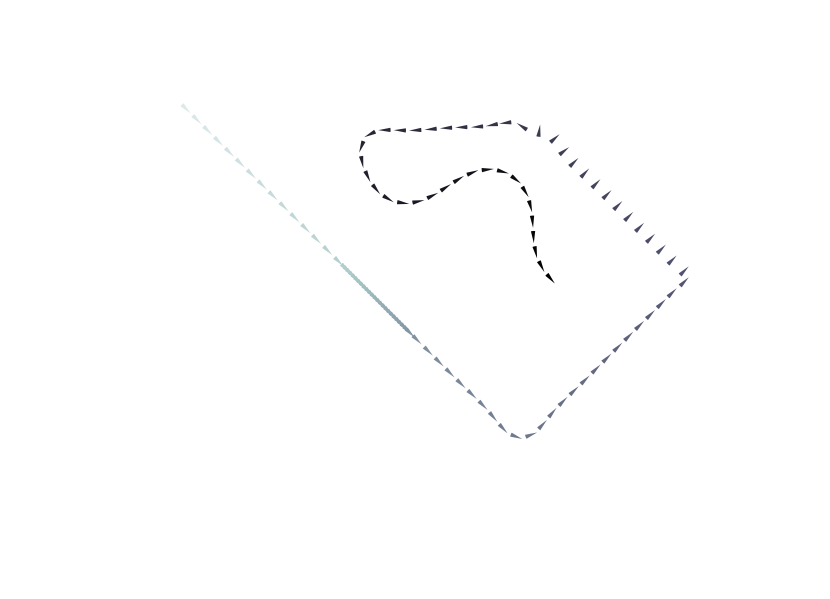

In [439]:
fig, ax = plt.subplots(1, 1, figsize=(3 * 1, 3 * 1), sharex=True, sharey=True, dpi=300)

ff.plot_trajectory(x_sim['x'], x_sim['y'], x_sim['psi'],
                   color=t_sim,
                   ax=ax,
                   size_radius=0.08,
                   nskip=0)

fifi.mpl_functions.adjust_spines(ax, [])

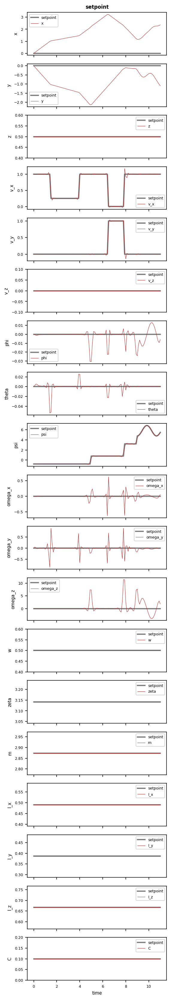

In [440]:
simulator.plot(name='setpoint')

/tmp/ipykernel_2967533/138927273.py:12: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


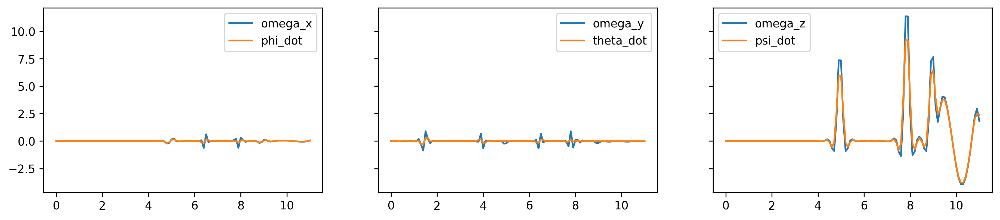

In [441]:
# plot omega_x and phi_dot
fig, ax = plt.subplots(1, 3, figsize=(3 * 5, 3 * 1), sharex=True, sharey=True, dpi=300)
ax[0].plot(t_sim, x_sim['omega_x'], label='omega_x')
ax[0].plot(t_sim, np.gradient(x_sim['phi'], t_sim), label='phi_dot')
ax[0].legend()
ax[1].plot(t_sim, x_sim['omega_y'], label='omega_y')
ax[1].plot(t_sim, np.gradient(x_sim['theta'], t_sim), label='theta_dot')
ax[1].legend()
ax[2].plot(t_sim, x_sim['omega_z'], label='omega_z')
ax[2].plot(t_sim, np.gradient(x_sim['psi'], t_sim), label='psi_dot')
ax[2].legend()
fig.show()

{'PWM1': array([  1.99960908,   4.1733102 ,   6.20888884,   8.20404385,
        10.26948219,  12.36472493,  14.42581317,  16.45735835,
        18.54736991,  20.71388337,  22.5953755 ,  24.38681219,
        27.71336503,  30.02981848,  28.44369385,  33.2236123 ,
        33.88319954,  34.2244559 ,  36.15674176,  37.72286766,
        39.15761543,  40.70555869,  42.23181734,  43.74788759,
        45.27163678,  46.79385542,  48.3154909 ,  49.83761048,
        51.35970541,  52.89449115,  54.57498879,  56.40893975,
        58.28253384,  60.17805659,  62.07119846,  63.86676743,
        65.96070537,  67.6979615 ,  68.29833402,  73.97608661,
        71.63469305,  74.4211995 ,  75.81012111,  76.96198989,
        78.85053209,  81.20845742,  82.20637361,  78.96869879,
        75.45168739,  85.49608573,  96.19958376,  93.84877141,
        89.86966275,  90.47627263,  92.85367485,  94.71998968,
        96.07350906,  97.36505092,  98.78318369, 100.19261991,
       101.78763748, 103.02638131, 104.0665990

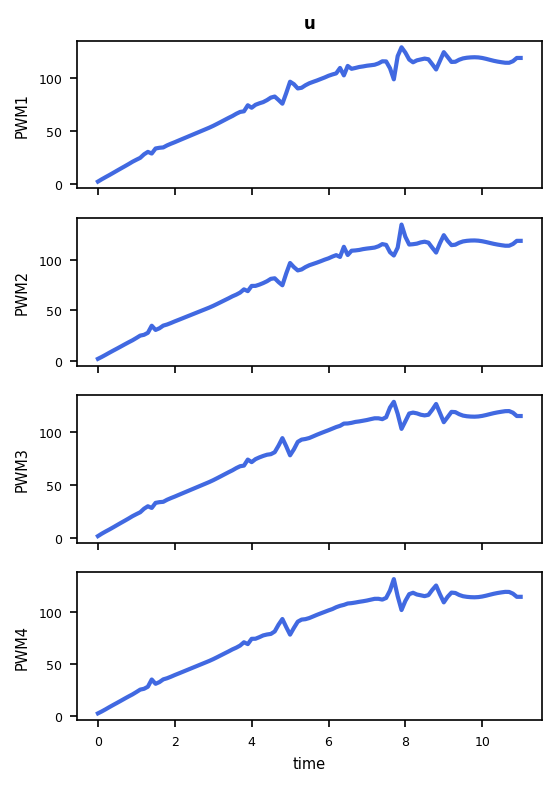

In [445]:
simulator.plot(name='u')
print(u_sim)

In [14]:
# #plot original trajectory
# X_target = np.cumsum(v_x) * dt
# Y_target = np.cumsum(v_y) * dt
# print('target x:', Y_target)
# plt.plot(X_target, Y_target, color='red', linewidth=5)
# # plot x and y sim have color as time
# plt.plot(x_sim['x'], x_sim['y'], color='blue', linewidth=0.5)

# # plt.scatter(x_sim['x'], x_sim['y'], c=t_sim, cmap='viridis', s=5)

# Observability

In [15]:
# Set time-window
time_window = 8

In [16]:
# Set time-window
time_window = 8

In [17]:
# Construct O in sliding windows
st = time.time()
SEOM = SlidingEmpiricalObservabilityMatrix(simulator, t_sim, x_sim, u_sim, w=time_window, eps=1e-4)
et = time.time()
print('elapsed time:', et-st)

elapsed time: 129.5890691280365


In [18]:
# Get O's
O_sliding = SEOM.get_observability_matrix()
n_window = len(O_sliding)
print(n_window, 'windows')

104 windows


In [19]:
o_sensors = ['psi', 'beta', 'gamma']
# o_sensors = ['psi', 'phi', 'theta', 'alpha', 'gamma']
# o_sensors = ['psi', 'phi', 'theta', 'alpha', 'gamma']
# o_sensors = ['psi', 'beta', 'gamma']
# o_sensors = ['psi', 'alpha', 'gamma', 'q', 'r']

o_states = None
# o_states = simulator.state_names[0:-5] + ['m', 'C', 'I_x']

window_size = 5
o_time_steps = np.arange(0, window_size, step=1)

In [20]:
o_states

In [21]:
# Compute the Fisher information & inverse for each window and store the minimum error variance
SFO = SlidingFisherObservability(SEOM.O_df_sliding, time=SEOM.t_sim, lam=1e-6, R=0.1,
                                 states=o_states, sensors=o_sensors, time_steps=o_time_steps, w=window_size)

EV_aligned = SFO.get_minimum_error_variance()
EV_no_nan = EV_aligned.fillna(method='bfill').fillna(method='ffill')

In [22]:
EV_no_nan

,time,time_initial,x,y,z,v_x,v_y,v_z,phi,theta,...,omega_x,omega_y,omega_z,w,zeta,m,I_x,I_y,I_z,C
0,0.0,0.0,999999.999651,999999.999652,1000000.0,869973.715383,0.099818,999999.999822,160.173191,2370.346334,...,3.761712,177.284543,1.205357,488003.361673,619293.836653,999156.732695,6918.995562,7045.340549,1621.305421,708085.232856
1,0.1,0.0,999999.999651,999999.999652,1000000.0,869973.715383,0.099818,999999.999822,160.173191,2370.346334,...,3.761712,177.284543,1.205357,488003.361673,619293.836653,999156.732695,6918.995562,7045.340549,1621.305421,708085.232856
2,0.2,0.0,999999.999651,999999.999652,1000000.0,869973.715383,0.099818,999999.999822,160.173191,2370.346334,...,3.761712,177.284543,1.205357,488003.361673,619293.836653,999156.732695,6918.995562,7045.340549,1621.305421,708085.232856
3,0.3,0.1,999999.999746,999999.999748,1000000.0,863095.115761,0.321906,999999.999854,117.969815,1685.907501,...,2291.090670,51680.118126,86.600506,490120.913906,626036.380828,998227.454200,5592.844515,6951.785783,2702.329782,929820.630568
4,0.4,0.2,999999.999424,999999.999429,1000000.0,867774.995850,0.098070,999999.999940,87.117167,1457.146750,...,1446.399463,235443.857288,578.574038,492213.922080,625664.528202,998643.115036,16405.108421,81539.946080,8065.234914,677749.644381
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
106,10.6,10.3,1000000.000000,999999.999996,1000000.0,110272.205311,0.216036,999999.999996,1202.675840,7701.998177,...,258799.284267,55713.134272,9747.540024,28043.471762,2169.402384,869029.086992,311.442912,6.985525,0.142247,576215.047797
107,10.7,10.3,1000000.000000,999999.999996,1000000.0,110272.205311,0.216036,999999.999996,1202.675840,7701.998177,...,258799.284267,55713.134272,9747.540024,28043.471762,2169.402384,869029.086992,311.442912,6.985525,0.142247,576215.047797
108,10.8,10.3,1000000.000000,999999.999996,1000000.0,110272.205311,0.216036,999999.999996,1202.675840,7701.998177,...,258799.284267,55713.134272,9747.540024,28043.471762,2169.402384,869029.086992,311.442912,6.985525,0.142247,576215.047797
109,10.9,10.3,1000000.000000,999999.999996,1000000.0,110272.205311,0.216036,999999.999996,1202.675840,7701.998177,...,258799.284267,55713.134272,9747.540024,28043.471762,2169.402384,869029.086992,311.442912,6.985525,0.142247,576215.047797


# Plot state observability

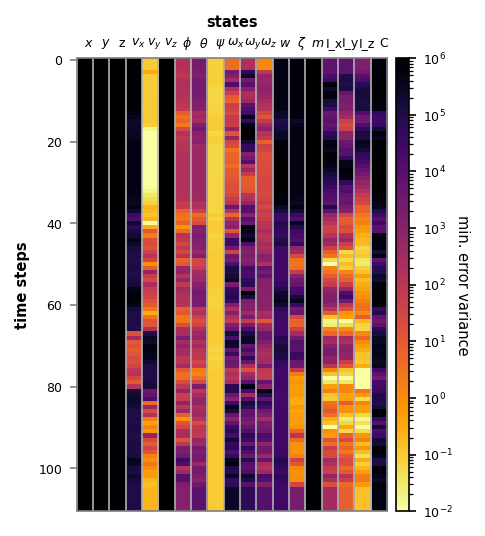

In [23]:
if o_states is None:
    state_labels = simulator.state_names
else:
    state_labels = o_states

cnorm, cmap, log_ticks = ff.plot_heatmap_log_timeseries(EV_no_nan.iloc[:, 2:].values, log_ticks=(-2, 6),
                                                        data_labels=state_labels, y_label='min. error variance')

In [24]:
EV_no_nan

,time,time_initial,x,y,z,v_x,v_y,v_z,phi,theta,...,omega_x,omega_y,omega_z,w,zeta,m,I_x,I_y,I_z,C
0,0.0,0.0,999999.999651,999999.999652,1000000.0,869973.715383,0.099818,999999.999822,160.173191,2370.346334,...,3.761712,177.284543,1.205357,488003.361673,619293.836653,999156.732695,6918.995562,7045.340549,1621.305421,708085.232856
1,0.1,0.0,999999.999651,999999.999652,1000000.0,869973.715383,0.099818,999999.999822,160.173191,2370.346334,...,3.761712,177.284543,1.205357,488003.361673,619293.836653,999156.732695,6918.995562,7045.340549,1621.305421,708085.232856
2,0.2,0.0,999999.999651,999999.999652,1000000.0,869973.715383,0.099818,999999.999822,160.173191,2370.346334,...,3.761712,177.284543,1.205357,488003.361673,619293.836653,999156.732695,6918.995562,7045.340549,1621.305421,708085.232856
3,0.3,0.1,999999.999746,999999.999748,1000000.0,863095.115761,0.321906,999999.999854,117.969815,1685.907501,...,2291.090670,51680.118126,86.600506,490120.913906,626036.380828,998227.454200,5592.844515,6951.785783,2702.329782,929820.630568
4,0.4,0.2,999999.999424,999999.999429,1000000.0,867774.995850,0.098070,999999.999940,87.117167,1457.146750,...,1446.399463,235443.857288,578.574038,492213.922080,625664.528202,998643.115036,16405.108421,81539.946080,8065.234914,677749.644381
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
106,10.6,10.3,1000000.000000,999999.999996,1000000.0,110272.205311,0.216036,999999.999996,1202.675840,7701.998177,...,258799.284267,55713.134272,9747.540024,28043.471762,2169.402384,869029.086992,311.442912,6.985525,0.142247,576215.047797
107,10.7,10.3,1000000.000000,999999.999996,1000000.0,110272.205311,0.216036,999999.999996,1202.675840,7701.998177,...,258799.284267,55713.134272,9747.540024,28043.471762,2169.402384,869029.086992,311.442912,6.985525,0.142247,576215.047797
108,10.8,10.3,1000000.000000,999999.999996,1000000.0,110272.205311,0.216036,999999.999996,1202.675840,7701.998177,...,258799.284267,55713.134272,9747.540024,28043.471762,2169.402384,869029.086992,311.442912,6.985525,0.142247,576215.047797
109,10.9,10.3,1000000.000000,999999.999996,1000000.0,110272.205311,0.216036,999999.999996,1202.675840,7701.998177,...,258799.284267,55713.134272,9747.540024,28043.471762,2169.402384,869029.086992,311.442912,6.985525,0.142247,576215.047797


# Plot state observability on trajectory

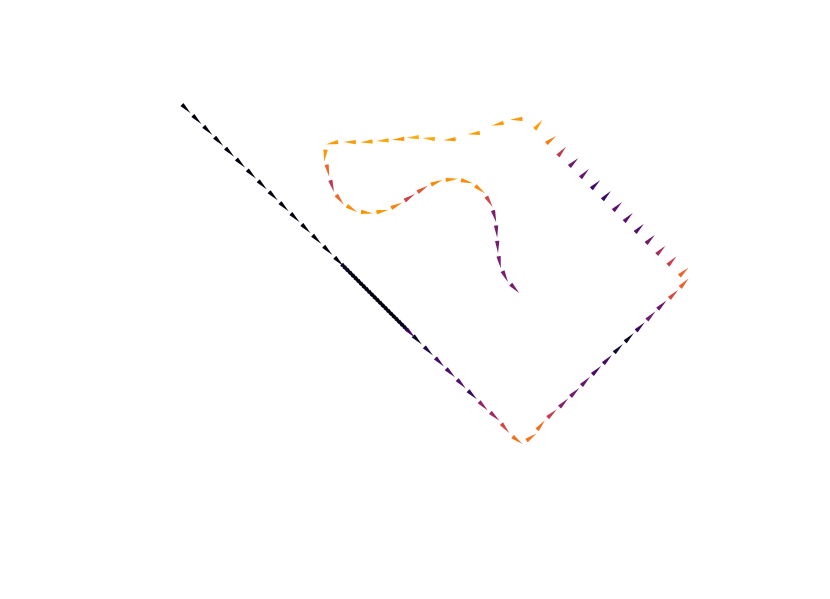

In [25]:
fig, ax = plt.subplots(1, 1, figsize=(3 * 1, 3 * 1), sharex=True, sharey=True, dpi=300)

color = EV_no_nan['zeta'].values

ff.plot_trajectory(x_sim['x'], x_sim['y'], x_sim['psi'],
                   color=color,
                   ax=ax,
                   size_radius=0.08,
                   nskip=0,
                   colormap=cmap,
                   colornorm=cnorm)


fifi.mpl_functions.adjust_spines(ax, [])

# get parameters

In [179]:
g = 9.81  # gravity [m/s^2]
m = 0.086  # mass [kg]
M = 2.529  # mass [kg]
Mm = 4 * m + M  # total mass [kg]
L = 0.2032  # length [m]
R = 0.1778  # average body radius [m]
I_x = .491
# self.I_x = 2 * (self.M * self.R ** 2) / 5 + 2 * self.m * self.L ** 2  # [kg*m^2] moment of inertia about x
I_y = .387
# self.I_y = 2 * (self.M * self.R ** 2) / 5 + 2 * self.m * self.L ** 2  # [kg*m^2] moment of inertia about y
I_z = .667
# self.I_z = 2 * (self.M * self.R ** 2) / 5 + 4 * self.m * self.L ** 2  # [kg*m^2] moment of inertia about y
b = 1.8311  # thrust coefficient
d = 1  # drag constant
C = 0.1  # drag coefficient from ground speed plus air speed

PARAMS = {
            'g': g,
            'm': m,
            'M': M,
            'Mm': Mm,
            'L': L,
            'R': R,
            'I_x': I_x,
            'I_y': I_y,
            'I_z': I_z,
            'b': b,
            'd': d,
            'C': C
                            }

DroneParams = DroneParameters()
params = DroneParams.get_params()
print(params)

{'g': 9.81, 'm': 0.086, 'M': 2.529, 'Mm': 2.8729999999999998, 'L': 0.2032, 'R': 0.1778, 'I_x': 0.491, 'I_y': 0.387, 'I_z': 0.667, 'b': 1.8311, 'd': 1, 'C': 0.1}


# creat measuerments form sim

In [27]:
# creat measuerments from the simulation states
#control inputs
Lx = 2*params['L']/np.sqrt(2)
PWM1 = u_sim['PWM1']
PWM2 = u_sim['PWM2']
PWM3 = u_sim['PWM3']
PWM4 = u_sim['PWM4']
#u_thrust = self.params.b * (PWM1 + PWM2 + PWM3 + PWM4)
u_thrust = params['b']*(PWM1 + PWM2 + PWM3 + PWM4)
#u_phi = self.params.b * Lx * (-PWM1 + PWM2 + PWM3 - PWM4)
u_phi = params['b']*Lx*(-PWM1 + PWM2 + PWM3 - PWM4)
#u_theta = self.params.b * Lx * (-PWM1 + PWM2 - PWM3 + PWM4)
u_theta = params['b']*Lx*(-PWM1 + PWM2 - PWM3 + PWM4)
#u_psi = self.params.d * (-PWM1 - PWM2 + PWM3 + PWM4)
u_psi = params['d']*(-PWM1 - PWM2 + PWM3 + PWM4)

# Rotation
# phi_dot = omega_x + omega_z * np.tan(theta) * np.cos(phi) + omega_y * np.tan(theta) * np.sin(phi)
phi_dot = x_sim['omega_x'] + x_sim['omega_z'] * np.tan(x_sim['theta']) * np.cos(x_sim['phi']) + x_sim['omega_y'] * np.tan(x_sim['theta']) * np.sin(x_sim['phi'])
# theta_dot = omega_y * np.cos(phi) - omega_z * np.sin(phi)
theta_dot = x_sim['omega_y'] * np.cos(x_sim['phi']) - x_sim['omega_z'] * np.sin(x_sim['phi'])
# psi_dot = omega_z * np.cos(phi) * (1 / np.cos(theta)) + omega_y * np.sin(phi) * (1 / np.cos(theta))
psi_dot = x_sim['omega_z'] * np.cos(x_sim['phi']) * (1 / np.cos(x_sim['theta'])) + x_sim['omega_y'] * np.sin(x_sim['phi']) * (1 / np.cos(x_sim['theta']))

# mocap
##pose
mocap_pose_noise = 0.01
Px = x_sim['x'] + np.random.normal(0, mocap_pose_noise, len(x_sim['x']))
Py = x_sim['y'] + np.random.normal(0, mocap_pose_noise, len(x_sim['y']))
Pz = x_sim['z'] + np.random.normal(0, mocap_pose_noise, len(x_sim['z']))
##vel
mocap_vel_noise = 0.01
Vx = x_sim['v_x'] + np.random.normal(0, mocap_vel_noise, len(x_sim['v_x']))
Vy = x_sim['v_y'] + np.random.normal(0, mocap_vel_noise, len(x_sim['v_y']))
Vz = x_sim['v_z'] + np.random.normal(0, mocap_vel_noise, len(x_sim['v_z']))
##attitude
mocap_att_noise = 0.01
Phi = x_sim['phi'] + np.random.normal(0, mocap_att_noise, len(x_sim['phi']))
Theta = x_sim['theta'] + np.random.normal(0, mocap_att_noise, len(x_sim['theta']))
Psi = x_sim['psi'] + np.random.normal(0, mocap_att_noise, len(x_sim['psi']))
# imu
##rate
imu_rate_noise = 0.01
Omega_x = x_sim['omega_x'] + np.random.normal(0, imu_rate_noise, len(x_sim['omega_x']))
Omega_y = x_sim['omega_y'] + np.random.normal(0, imu_rate_noise, len(x_sim['omega_y']))
Omega_z = x_sim['omega_z'] + np.random.normal(0, imu_rate_noise, len(x_sim['omega_z']))
##acc
imu_acc_noise = 0.01
# Drag dynamics
# a_x = v_x - w * np.cos(psi - zeta)
a_x = x_sim['v_x'] - x_sim['w'] * np.cos(x_sim['psi'] - x_sim['zeta'])
# a_y = v_y + w * np.sin(psi - zeta)
a_y = x_sim['v_y'] + x_sim['w'] * np.sin(x_sim['psi'] - x_sim['zeta'])
# a_z = v_z
a_z = x_sim['v_z']
#(1 / m) * (u_thrust * np.cos(phi) * np.sin(theta) - C * a_x) + v_y * psi_dot
Ax = (1 / x_sim['m']) * (u_thrust * np.cos(x_sim['phi']) * np.sin(x_sim['theta']) - x_sim['C'] * a_x) + x_sim['v_y'] * psi_dot + np.random.normal(0, imu_acc_noise, len(x_sim['x']))
#(1 / m) * (-u_thrust * np.sin(phi) - C * a_y) - v_x * psi_dot
Ay = (1 / x_sim['m']) * (-u_thrust * np.sin(x_sim['phi']) - x_sim['C'] * a_y) - x_sim['v_x'] * psi_dot + np.random.normal(0, imu_acc_noise, len(x_sim['y']))
#v_z_dot = (1 / m) * (u_thrust * np.cos(phi) * np.cos(theta) - C * v_z - m * g)
Az = (1 / x_sim['m']) * (u_thrust * np.cos(x_sim['phi']) * np.cos(x_sim['theta']) - x_sim['C'] * x_sim['v_z'] - x_sim['m'] * params['g']) + np.random.normal(0, imu_acc_noise, len(x_sim['v_z']))
#optical flow
optical_flow_noise = 0.01
#OF_x = v_x*(1/z)
OF_x = x_sim['v_x'] * (1 / x_sim['z']) + np.random.normal(0, optical_flow_noise, len(x_sim['v_x']))
#OF_y = v_y*(1/z)
OF_y = x_sim['v_y'] * (1 / x_sim['z']) + np.random.normal(0, optical_flow_noise, len(x_sim['v_y']))
#OF_z = v_z*(1/z)
OF_z = x_sim['v_z'] * (1 / x_sim['z']) + np.random.normal(0, optical_flow_noise, len(x_sim['v_z']))
# wind
wind_noise = 0.01
#a_x = v_x - w * np.cos(psi - zeta)
Aw_x = x_sim['v_x'] - w * np.cos(x_sim['psi'] - x_sim['zeta']) + np.random.normal(0, wind_noise, len(x_sim['v_x']))
#a_y = v_y + w * np.sin(psi - zeta)
Aw_y = x_sim['v_y'] + w * np.sin(x_sim['psi'] - x_sim['zeta']) + np.random.normal(0, wind_noise, len(x_sim['v_y']))
#a_z = v_z
Aw_z = x_sim['v_z'] + np.random.normal(0, wind_noise, len(x_sim['v_z']))
#a = np.sqrt(a_x ** 2 + a_y ** 2)
Aa = np.sqrt(Aw_x ** 2 + Aw_y ** 2)
#gamma = np.arctan2(a_y, a_x)
Agamma = np.arctan2(Aw_y, Aw_x)

# Plotting the measuerments

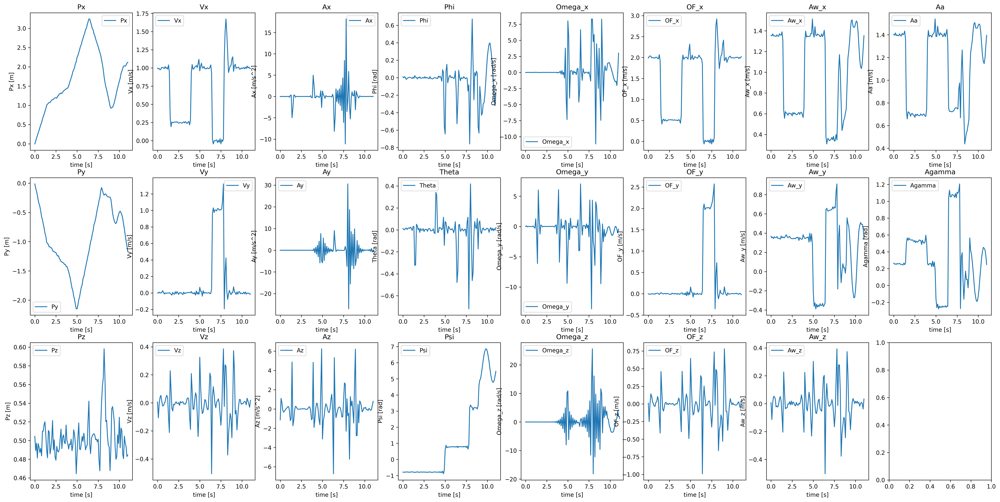

In [28]:
# plot the measurements
fig, ax = plt.subplots(3,8, figsize=(3 * 10, 3 * 5), dpi=300)
ax[0,0].plot(t_sim, Px, label='Px')
ax[0,0].set_title('Px')
ax[0,0].set_xlabel('time [s]')
ax[0,0].set_ylabel('Px [m]')
ax[0,0].legend()

ax[1,0].plot(t_sim, Py, label='Py')
ax[1,0].set_title('Py')
ax[1,0].set_xlabel('time [s]')
ax[1,0].set_ylabel('Py [m]')
ax[1,0].legend()

ax[2,0].plot(t_sim, Pz, label='Pz')
ax[2,0].set_title('Pz')
ax[2,0].set_xlabel('time [s]')
ax[2,0].set_ylabel('Pz [m]')
ax[2,0].legend()

ax[0,1].plot(t_sim, Vx, label='Vx')
ax[0,1].set_title('Vx')
ax[0,1].set_xlabel('time [s]')
ax[0,1].set_ylabel('Vx [m/s]')
ax[0,1].legend()

ax[1,1].plot(t_sim, Vy, label='Vy')
ax[1,1].set_title('Vy')
ax[1,1].set_xlabel('time [s]')
ax[1,1].set_ylabel('Vy [m/s]')
ax[1,1].legend()

ax[2,1].plot(t_sim, Vz, label='Vz')
ax[2,1].set_title('Vz')
ax[2,1].set_xlabel('time [s]')
ax[2,1].set_ylabel('Vz [m/s]')
ax[2,1].legend()

ax[0,2].plot(t_sim, Ax, label='Ax')
ax[0,2].set_title('Ax')
ax[0,2].set_xlabel('time [s]')
ax[0,2].set_ylabel('Ax [m/s^2]')
ax[0,2].legend()

ax[1,2].plot(t_sim, Ay, label='Ay')
ax[1,2].set_title('Ay')
ax[1,2].set_xlabel('time [s]')
ax[1,2].set_ylabel('Ay [m/s^2]')
ax[1,2].legend()

ax[2,2].plot(t_sim, Az, label='Az')
ax[2,2].set_title('Az')
ax[2,2].set_xlabel('time [s]')
ax[2,2].set_ylabel('Az [m/s^2]')
ax[2,2].legend()

ax[0,3].plot(t_sim, Phi, label='Phi')
ax[0,3].set_title('Phi')
ax[0,3].set_xlabel('time [s]')
ax[0,3].set_ylabel('Phi [rad]')
ax[0,3].legend()

ax[1,3].plot(t_sim, Theta, label='Theta')
ax[1,3].set_title('Theta')
ax[1,3].set_xlabel('time [s]')
ax[1,3].set_ylabel('Theta [rad]')
ax[1,3].legend()

ax[2,3].plot(t_sim, Psi, label='Psi')
ax[2,3].set_title('Psi')
ax[2,3].set_xlabel('time [s]')
ax[2,3].set_ylabel('Psi [rad]')
ax[2,3].legend()

ax[0,4].plot(t_sim, Omega_x, label='Omega_x')
ax[0,4].set_title('Omega_x')
ax[0,4].set_xlabel('time [s]')
ax[0,4].set_ylabel('Omega_x [rad/s]')
ax[0,4].legend()

ax[1,4].plot(t_sim, Omega_y, label='Omega_y')
ax[1,4].set_title('Omega_y')
ax[1,4].set_xlabel('time [s]')
ax[1,4].set_ylabel('Omega_y [rad/s]')
ax[1,4].legend()

ax[2,4].plot(t_sim, Omega_z, label='Omega_z')
ax[2,4].set_title('Omega_z')
ax[2,4].set_xlabel('time [s]')
ax[2,4].set_ylabel('Omega_z [rad/s]')
ax[2,4].legend()

ax[0,5].plot(t_sim, OF_x, label='OF_x')
ax[0,5].set_title('OF_x')
ax[0,5].set_xlabel('time [s]')
ax[0,5].set_ylabel('OF_x [m/s]')
ax[0,5].legend()

ax[1,5].plot(t_sim, OF_y, label='OF_y')
ax[1,5].set_title('OF_y')
ax[1,5].set_xlabel('time [s]')
ax[1,5].set_ylabel('OF_y [m/s]')
ax[1,5].legend()

ax[2,5].plot(t_sim, OF_z, label='OF_z')
ax[2,5].set_title('OF_z')
ax[2,5].set_xlabel('time [s]')
ax[2,5].set_ylabel('OF_z [m/s]')
ax[2,5].legend()

ax[0,6].plot(t_sim, Aw_x, label='Aw_x')
ax[0,6].set_title('Aw_x')
ax[0,6].set_xlabel('time [s]')
ax[0,6].set_ylabel('Aw_x [m/s]')
ax[0,6].legend()

ax[1,6].plot(t_sim, Aw_y, label='Aw_y')
ax[1,6].set_title('Aw_y')
ax[1,6].set_xlabel('time [s]')
ax[1,6].set_ylabel('Aw_y [m/s]')
ax[1,6].legend()

ax[2,6].plot(t_sim, Aw_z, label='Aw_z')
ax[2,6].set_title('Aw_z')
ax[2,6].set_xlabel('time [s]')
ax[2,6].set_ylabel('Aw_z [m/s]')
ax[2,6].legend()

ax[0,7].plot(t_sim, Aa, label='Aa')
ax[0,7].set_title('Aa')
ax[0,7].set_xlabel('time [s]')
ax[0,7].set_ylabel('Aa [m/s]')
ax[0,7].legend()

ax[1,7].plot(t_sim, Agamma, label='Agamma')
ax[1,7].set_title('Agamma')
ax[1,7].set_xlabel('time [s]')
ax[1,7].set_ylabel('Agamma [rad]')
ax[1,7].legend()



# measuerment cluster

In [29]:
Y_flag = 'real'
if Y_flag == 'all':
     Y_m = np.vstack((Px, Py, Pz, Vx, Vy, Vz, Phi, Theta, Psi, Omega_x, Omega_y, Omega_z, Ax, Ay, Az, OF_x, OF_y, OF_z, Aw_x, Aw_y, Aw_z, Aa, Agamma))
elif Y_flag == 'real':
     Y_m = np.vstack((Omega_x, Omega_y, Omega_z, Ax, Ay, Az, OF_x, OF_y, Aw_x, Aw_y, Aa, Agamma))

# set the control input cluster

In [30]:
U = np.vstack((PWM1, PWM2, PWM3, PWM4))

# set the Xo values

In [31]:
X0 = np.atleast_2d(np.vstack((x_sim['x'][0]+.25,
                              x_sim['y'][0]+.25,
                              x_sim['z'][0]+.25,
                              x_sim['v_x'][0]+.25,
                              x_sim['v_y'][0]+.25,
                              x_sim['v_z'][0]+.25,
                              x_sim['phi'][0]+x_sim['phi'][0]*.25,
                              x_sim['theta'][0]+x_sim['theta'][0]*.25,
                              x_sim['psi'][0]+x_sim['psi'][0]*.25,
                              x_sim['omega_x'][0]+.25,
                              x_sim['omega_y'][0]+.25,
                              x_sim['omega_z'][0]+.25,
                              x_sim['w'][0]+x_sim['w'][0]*.25,
                              x_sim['zeta'][0]+x_sim['zeta'][0]*.25,
                              x_sim['m'][0]+x_sim['m'][0]*.25,
                              x_sim['I_x'][0]+x_sim['I_x'][0]*.25,
                              x_sim['I_y'][0]+x_sim['I_y'][0]*.25,
                              x_sim['I_z'][0]+x_sim['I_z'][0]*.25,
                              x_sim['C'][0]+x_sim['C'][0]*.25)))

# set Q for dynamics modle

In [32]:
Q = np.diag(np.array([1e-5, # x
                      1e-5, # y
                      1e-5, # z
                      1e-5, # v_x
                      1e-5, # v_y
                      1e-5, # v_z
                      1e-5, # phi
                      1e-5, # theta
                      1e-5, # psi
                      1e-5, # omega_x
                      1e-5, # omega_y
                      1e-5, # omega_z
                      1e-5, # w
                      1e-2, # zeta
                      1e-5, # m
                      1e-5, # I_x
                      1e-5, # I_y
                      1e-5, # I_z
                      1e-5])) # C

# set the measuerment noise covariance

In [33]:
Pxv = mocap_pose_noise
Pyv = mocap_pose_noise
Pzv = mocap_pose_noise
Vxv = mocap_vel_noise
Vyv = mocap_vel_noise
Vzv = mocap_vel_noise
Phiv = mocap_att_noise
Thetav = mocap_att_noise
Psiv = mocap_att_noise
Omega_xv = imu_rate_noise
Omega_yv = imu_rate_noise
Omega_zv = imu_rate_noise
Axv = imu_acc_noise
Ayv = imu_acc_noise
Azv = imu_acc_noise
OF_xv = optical_flow_noise
OF_yv = optical_flow_noise
OF_zv = optical_flow_noise
Aw_xv = wind_noise
Aw_yv = wind_noise
Aw_zv = wind_noise
Aav = wind_noise
Agammav = wind_noise

V_flag = 'real'
if V_flag == 'all':
    V = np.hstack(np.array([Pxv, Pyv, Pzv, Vxv, Vyv, Vzv, Phiv, Thetav, Psiv, Omega_xv, Omega_yv, Omega_zv, Axv, Ayv, Azv, OF_xv, OF_yv, OF_zv, Aw_xv, Aw_yv, Aw_zv, Aav, Agammav]))
elif V_flag == 'real':
    V = np.hstack(np.array([Omega_xv, Omega_yv, Omega_zv, Axv, Ayv, Azv, OF_xv, OF_yv, Aw_xv, Aw_yv, Aav, Agammav]))
R=np.power(np.diag(V), 2)




# setting P0

In [34]:
P0 = np.diag(np.array([1e-2, # x
                       1e-2, # y
                       1e-2, # z
                       1e-2, # v_x
                       1e-2, # v_y
                       1e-2, # v_z
                       1e-2, # phi
                       1e-2, # theta
                       1e-2, # psi
                       1e-2, # omega_x
                       1e-2, # omega_y
                       1e-2, # omega_z
                       1e-2, # w
                       1e-2, # zeta
                       1e-2, # m
                       1e-2, # I_x
                       1e-2, # I_y
                       1e-2, # I_z
                       1e-2])) # C

In [35]:
# check that all inputs are a two-dimensional array
print('Ynoisy:',Y_m.shape)
print('x0:',X0.shape)
print('U:',U.shape)
print('Q:',Q.shape)
print('R:',R.shape)
print('P0:',P0.shape)

Ynoisy: (12, 111)
x0: (19, 1)
U: (4, 111)
Q: (19, 19)
R: (12, 12)
P0: (19, 19)


# get model function

In [36]:
drone_model = DroneModel()
f_c=drone_model.f_c

def outer(func):
    def wrapper(*args, **kwargs):
        global dt
        args = list(args) + [dt]
        value = func(*args)
        return value
    return wrapper

f_c = outer(drone_model.f_c)

# # drone_model.f_c(np.zeros_like(X0),U[:,0],.1)
# f_c(np.zeros_like(X0),U[:,0])

# get measuerment function

In [37]:
h_c=drone_model.h_c

In [38]:
xhat, P, s = EKF(Y_m, X0, f_c, h_c, Q, R, U, P0)

ValueError: operands could not be broadcast together with shapes (13,13) (12,12) 

# Estimate

In [ ]:
x_hat = xhat[0,:] # x estimate
y_hat = xhat[1,:] # y estimate
z_hat = xhat[2,:] # z estimate
v_x_hat = xhat[3,:] # v_x estimate
v_y_hat = xhat[4,:] # v_y estimate
v_z_hat = xhat[5,:] # v_z estimate
phi_hat = xhat[6,:] # phi estimate
theta_hat = xhat[7,:] # theta estimate
psi_hat = xhat[8,:] # psi estimate
omega_x_hat = xhat[9,:] # omega_x estimate
omega_y_hat = xhat[10,:] # omega_y estimate
omega_z_hat = xhat[11,:] # omega_z estimate
w_hat = xhat[12,:] # w estimate
zeta_hat = xhat[13,:] # zeta estimate
m_hat = xhat[14,:] # m estimate
I_x_hat = xhat[15,:] # I_x estimate
I_y_hat = xhat[16,:] # I_y estimate
I_z_hat = xhat[17,:] # I_z estimate
C_hat = xhat[18,:] # C estimate


# plotting estimates

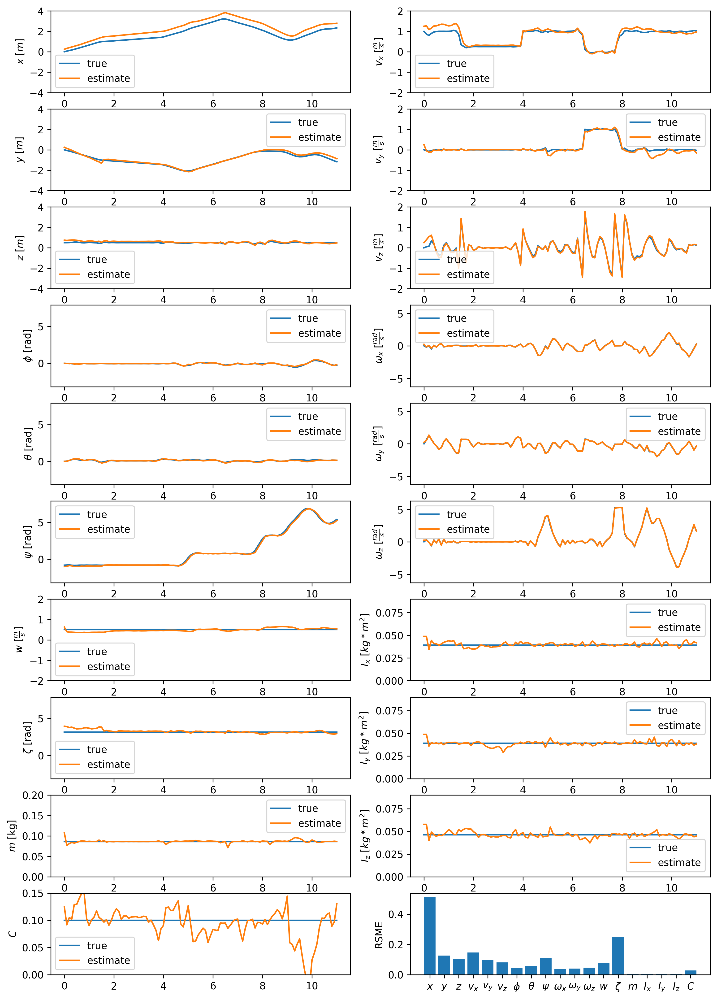

In [ ]:
# plot the estimated states and the true states all on the same figure
# 19 states make the plots 10 by 2
fig, ax = plt.subplots(10, 2, figsize=(3 * 4, 3 * 6), dpi=300)
# plot x
ax[0, 0].plot(t_sim, x_sim['x'], label='true')
ax[0, 0].plot(t_sim, x_hat, label='estimate')
ax[0, 0].set_ylabel('$x$ [$m$]')
ax[0, 0].set_ylim(-4, 4)
ax[0, 0].legend()
# plot y
ax[1, 0].plot(t_sim, x_sim['y'], label='true')
ax[1, 0].plot(t_sim, y_hat, label='estimate')
ax[1, 0].set_ylabel('$y$ [$m$]')
ax[1, 0].set_ylim(-4, 4)
ax[1, 0].legend()
# plot z
ax[2, 0].plot(t_sim, x_sim['z'], label='true')
ax[2, 0].plot(t_sim, z_hat, label='estimate')
ax[2, 0].set_ylabel('$z$ [$m$]')
ax[2, 0].set_ylim(-4, 4)
ax[2, 0].legend()
# plot v_x
ax[0, 1].plot(t_sim, x_sim['v_x'], label='true')
ax[0, 1].plot(t_sim, v_x_hat, label='estimate')
ax[0, 1].set_ylabel(r'$v_x$ [$\frac{m}{s}$]')
ax[0, 1].set_ylim(-2, 2)
ax[0, 1].legend()
# plot v_y
ax[1, 1].plot(t_sim, x_sim['v_y'], label='true')
ax[1, 1].plot(t_sim, v_y_hat, label='estimate')
ax[1, 1].set_ylabel(r'$v_y$ [$\frac{m}{s}$]')
ax[1, 1].set_ylim(-2, 2)
ax[1, 1].legend()
# plot v_z
ax[2, 1].plot(t_sim, x_sim['v_z'], label='true')
ax[2, 1].plot(t_sim, v_z_hat, label='estimate')
ax[2, 1].set_ylabel(r'$v_z$ [$\frac{m}{s}$]')
ax[2, 1].set_ylim(-2, 2)
ax[2, 1].legend()
# plot phi
ax[3, 0].plot(t_sim, x_sim['phi'], label='true')
ax[3, 0].plot(t_sim, phi_hat, label='estimate')
ax[3, 0].set_ylabel('$\phi$ [rad]')
ax[3, 0].set_ylim(-np.pi, 2.5*np.pi)
ax[3, 0].legend()
# plot theta
ax[4, 0].plot(t_sim, x_sim['theta'], label='true')
ax[4, 0].plot(t_sim, theta_hat, label='estimate')
ax[4, 0].set_ylabel(r'$\theta$ [rad]')
ax[4, 0].set_ylim(-np.pi, 2.5*np.pi)
ax[4, 0].legend()
# plot psi
ax[5, 0].plot(t_sim, x_sim['psi'], label='true')
ax[5, 0].plot(t_sim, psi_hat, label='estimate')
ax[5, 0].set_ylabel('$\psi$ [rad]')
ax[5, 0].set_ylim(-np.pi, 2.5*np.pi)
ax[5, 0].legend()
# plot omega_x
ax[3, 1].plot(t_sim, x_sim['omega_x'], label='true')
ax[3, 1].plot(t_sim, omega_x_hat, label='estimate')
ax[3, 1].set_ylabel(r'$\omega_x$ [$\frac{rad}{s}$]')
ax[3, 1].set_ylim(-2*np.pi, 2*np.pi)
ax[3, 1].legend()
# plot omega_y
ax[4, 1].plot(t_sim, x_sim['omega_y'], label='true')
ax[4, 1].plot(t_sim, omega_y_hat, label='estimate')
ax[4, 1].set_ylabel(r'$\omega_y$ [$\frac{rad}{s}$]')
ax[4, 1].set_ylim(-2*np.pi, 2*np.pi)
ax[4, 1].legend()
# plot omega_z
ax[5, 1].plot(t_sim, x_sim['omega_z'], label='true')
ax[5, 1].plot(t_sim, omega_z_hat, label='estimate')
ax[5, 1].set_ylabel(r'$\omega_z$ [$\frac{rad}{s}$]')
ax[5, 1].set_ylim(-2*np.pi, 2*np.pi)
ax[5, 1].legend()
# plot w
ax[6, 0].plot(t_sim, x_sim['w'], label='true')
ax[6, 0].plot(t_sim, w_hat, label='estimate')
ax[6, 0].set_ylabel(r'$w$ [$\frac{m}{s}$]')
ax[6, 0].set_ylim(-2, 2)
ax[6, 0].legend()
# plot zeta
ax[7, 0].plot(t_sim, x_sim['zeta'], label='true')
ax[7, 0].plot(t_sim, zeta_hat, label='estimate')
ax[7, 0].set_ylabel('$\zeta$ [rad]')
ax[7, 0].set_ylim(-np.pi, 2.5*np.pi)
ax[7, 0].legend()
# plot m
ax[8, 0].plot(t_sim, x_sim['m'], label='true')
ax[8, 0].plot(t_sim, m_hat, label='estimate')
ax[8, 0].set_ylabel('$m$ [kg]')
ax[8, 0].set_ylim(0, .2)
ax[8, 0].legend()
# plot C
ax[9, 0].plot(t_sim, x_sim['C'], label='true')
ax[9, 0].plot(t_sim, C_hat, label='estimate')
ax[9, 0].set_ylabel('$C$')
ax[9, 0].set_ylim(0, .15)
ax[9, 0].legend()
# plot I_x
ax[6, 1].plot(t_sim, x_sim['I_x'], label='true')
ax[6, 1].plot(t_sim, I_x_hat, label='estimate')
ax[6, 1].set_ylabel('$I_x$ [$kg*m^2$]')
ax[6, 1].set_ylim(0, .09)
ax[6, 1].legend()
# plot I_y
ax[7, 1].plot(t_sim, x_sim['I_y'], label='true')
ax[7, 1].plot(t_sim, I_y_hat, label='estimate')
ax[7, 1].set_ylabel('$I_y$ [$kg*m^2$]')
ax[7, 1].set_ylim(0, .09)
ax[7, 1].legend()
# plot I_z
ax[8, 1].plot(t_sim, x_sim['I_z'], label='true')
ax[8, 1].plot(t_sim, I_z_hat, label='estimate')
ax[8, 1].set_ylabel('$I_z$ [$kg*m^2$]')
ax[8, 1].set_ylim(0, .09)
ax[8, 1].legend()
# calculate error between true and estimated states and plot as a bar graph for fig ax[9,1]
RSME_x = np.sqrt(np.mean((x_sim['x'] - x_hat) ** 2))
RSME_y = np.sqrt(np.mean((x_sim['y'] - y_hat) ** 2))
RSME_z = np.sqrt(np.mean((x_sim['z'] - z_hat) ** 2))
RSME_v_x = np.sqrt(np.mean((x_sim['v_x'] - v_x_hat) ** 2))
RSME_v_y = np.sqrt(np.mean((x_sim['v_y'] - v_y_hat) ** 2))
RSME_v_z = np.sqrt(np.mean((x_sim['v_z'] - v_z_hat) ** 2))
RSME_phi = np.sqrt(np.mean((x_sim['phi'] - phi_hat) ** 2))
RSME_theta = np.sqrt(np.mean((x_sim['theta'] - theta_hat) ** 2))
RSME_psi = np.sqrt(np.mean((x_sim['psi'] - psi_hat) ** 2))
RSME_omega_x = np.sqrt(np.mean((x_sim['omega_x'] - omega_x_hat) ** 2))
RSME_omega_y = np.sqrt(np.mean((x_sim['omega_y'] - omega_y_hat) ** 2))
RSME_omega_z = np.sqrt(np.mean((x_sim['omega_z'] - omega_z_hat) ** 2))
RSME_w = np.sqrt(np.mean((x_sim['w'] - w_hat) ** 2))
RSME_zeta = np.sqrt(np.mean((x_sim['zeta'] - zeta_hat) ** 2))
RSME_m = np.sqrt(np.mean((x_sim['m'] - m_hat) ** 2))
RSME_I_x = np.sqrt(np.mean((x_sim['I_x'] - I_x_hat) ** 2))
RSME_I_y = np.sqrt(np.mean((x_sim['I_y'] - I_y_hat) ** 2))
RSME_I_z = np.sqrt(np.mean((x_sim['I_z'] - I_z_hat) ** 2))
RSME_C = np.sqrt(np.mean((x_sim['C'] - C_hat) ** 2))
RSME = np.array([RSME_x, RSME_y, RSME_z, RSME_v_x, RSME_v_y, RSME_v_z, RSME_phi, RSME_theta, RSME_psi, RSME_omega_x, RSME_omega_y, RSME_omega_z, RSME_w, RSME_zeta, RSME_m, RSME_I_x, RSME_I_y, RSME_I_z, RSME_C])
ax[9, 1].bar(np.arange(19), RSME)
ax[9, 1].set_ylabel('RSME')
ax[9, 1].set_xticks(np.arange(19))
# write x tick lables in latex format
ax[9, 1].set_xticklabels(['$x$', '$y$', '$z$', '$v_x$', '$v_y$', '$v_z$', '$\phi$', r'$\theta$', '$\psi$', '$\omega_x$', '$\omega_y$', '$\omega_z$', '$w$', '$\zeta$', '$m$', '$I_x$', '$I_y$', '$I_z$', '$C$'])

plt.show()





# Import real data

In [436]:
# Load the data
#when using on the laptop path is /home/austin/Drone_AFRL/
#when using on the desktop path is /home/austinlopez/Drone_AFRL/
# sub_path = 'neg_X'
# sub_path = 'con_vel/03_19'
# sub_path = 'con_vel_con_yaw/03_19'
sub_path = 'wind'
FLAG_FILE = sub_path
# path = '/home/austinlopez/Drone_AFRL/CSV/'+ sub_path
path = '/home/austinlopez/BEN/CSVs/'+ sub_path
all_files = glob.glob(path + "/*.csv")
data = {}

for filename in all_files:
    df = pd.read_csv(filename, index_col=None, header=0)
    # data[os.path.basename(filename)[len(sub_path)+8:-4]] = df
    data[os.path.basename(filename)[len(sub_path)+16:-4]] = df

data = {key.replace("_slash_", "/"): value for key, value in data.items()}

for key in data.keys():
    print(key)

optic_flow/global/mean/y
optic_flow/camera/mean/x
optic_flow/wind_sensor/mean/x
optic_flow/camera/mean/y
optic_flow/wind_sensor/mean/y
mavros/imu/data
mavros/rc/in
mavros/imu/data_raw
mavros/local_position/pose
trisonica_body_level
mavros/rc/out
trisonica
optic_flow/global/mean/x
trisonica_global


# usefull functions

In [437]:
from scipy import signal
def quaternion_to_euler(x, y, z, w):
    """
    input: x, y, z, w
    output: R, P, Y
    """
    t0 = +2.0 * (w * x + y * z)
    t1 = +1.0 - 2.0 * (x * x + y * y)
    R = math.degrees(math.atan2(t0, t1))

    t2 = +2.0 * (w * y - z * x)
    t2 = +1.0 if t2 > +1.0 else t2
    t2 = -1.0 if t2 < -1.0 else t2
    P = math.degrees(math.asin(t2))

    t3 = +2.0 * (w * z + x * y)
    t4 = +1.0 - 2.0 * (y * y + z * z)
    Y = math.degrees(math.atan2(t3, t4))

    return R, P, Y

# function that interpolates data based on two time arrays using numpy
def interpolate_data(time1, data1, time2):
    """
    input: time1 (interp from), data1 (interp from), time2 (interp to)
    output: interpolated data2
    """
    return np.interp(time2, time1, data1)

# function that takes in data frame and gives out time array based on the columns secs and nsecs
def time_array(data):
    "input: data frame with columns secs and nsecs"
    "output: array of time in seconds"
    time = []
    for i in range(len(data)):
        time.append(data['secs'][i] + data['nsecs'][i] * 1e-9)

    return time

def high_pass_filter(data, dt, cut_off_freq):
    """
    input: data, dt, cut_off_freq
    output: data_filtered
    """
    # Create the high pass filter
    b, a = signal.butter(1, cut_off_freq, 'high', fs=1/dt)
    
    # Apply the high pass filter
    data_filtered = signal.filtfilt(b, a, data)
    
    return data_filtered

def low_pass_filter(data, dt, cut_off_freq):
    """
    input: data, dt, cut_off_freq
    output: data_filtered
    """
    # Create the high pass filter
    b, a = signal.butter(1, cut_off_freq, 'low', fs=1/dt)
    
    # Apply the high pass filter
    data_filtered = signal.filtfilt(b, a, data)
    
    return data_filtered

import numpy as np
import pandas as pd
from scipy.stats import zscore

def remove_outliers(data, method='iqr', threshold=1.5):
    """
    Replaces outliers with the median of their column, preserving original shape and returning a NumPy array.

    Parameters:
        data (array-like or DataFrame): Input data (1D or 2D).
        method (str): 'iqr' or 'zscore'.
        threshold (float): Threshold for detecting outliers.
                           - IQR: commonly 1.5
                           - Z-score: commonly 3.0

    Returns:
        NumPy array with outliers replaced by column median, matching original dimensions.
    """
    original_data = np.asarray(data)
    is_1d = original_data.ndim == 1

    # Convert to DataFrame
    if is_1d:
        df = pd.DataFrame({'value': original_data})
    else:
        df = pd.DataFrame(original_data)

    processed = df.copy()

    if method == 'iqr':
        for col in processed.columns:
            Q1 = processed[col].quantile(0.25)
            Q3 = processed[col].quantile(0.75)
            IQR = Q3 - Q1
            lower_bound = Q1 - threshold * IQR
            upper_bound = Q3 + threshold * IQR
            median = processed[col].median()
            processed[col] = processed[col].apply(lambda x: median if x < lower_bound or x > upper_bound else x)
    elif method == 'zscore':
        zscores = np.abs(zscore(processed))
        for i, col in enumerate(processed.columns):
            median = processed[col].median()
            processed.loc[zscores[:, i] > threshold, col] = median
    else:
        raise ValueError("Method must be 'iqr' or 'zscore'")

    result = processed.to_numpy()
    return result.flatten() if is_1d else result


# Ground Truth MoCap

In [438]:

mocap_time = data['mavros/local_position/pose']['rosbagTimestamp']/1e9/2
mocap_dt = np.mean(np.diff(mocap_time))
print('mocap_dt:', 1/mocap_dt)
mocap_Roll, mocap_Pitch, mocap_Yaw = [], [], []
for i in range(len(data['mavros/local_position/pose'])):
    R, P, Y = quaternion_to_euler(data['mavros/local_position/pose']['x.1'][i],
                                  data['mavros/local_position/pose']['y.1'][i],
                                  data['mavros/local_position/pose']['z.1'][i],
                                  data['mavros/local_position/pose']['w'][i])
    mocap_Roll.append(R)
    mocap_Pitch.append(P)
    mocap_Yaw.append(Y)


mocap_X = data['mavros/local_position/pose']['x']
mocap_Y = data['mavros/local_position/pose']['y']
mocap_Z = data['mavros/local_position/pose']['z']

mocap_time_shifted = mocap_time - mocap_time[0]
# take the derivative of the mocap data to get the velocities
mocap_X_dot = np.gradient(mocap_X, mocap_time)
mocap_X_dot = remove_outliers(mocap_X_dot, method='iqr', threshold=1.5)
mocap_Y_dot = np.gradient(mocap_Y, mocap_time)
mocap_Y_dot = remove_outliers(mocap_Y_dot, method='iqr', threshold=1.5)
mocap_Z_dot = np.gradient(mocap_Z, mocap_time)
mocap_Z_dot = remove_outliers(mocap_Z_dot, method='iqr', threshold=1.5)


# take the derivative of the mocap data to get the accelerations
mocap_X_ddot = np.gradient(mocap_X_dot, mocap_time)
mocap_Y_ddot = np.gradient(mocap_Y_dot, mocap_time)
mocap_Z_ddot = np.gradient(mocap_Z_dot, mocap_time)

mocap_dt: 30.001086613611236


## plot all mocap data

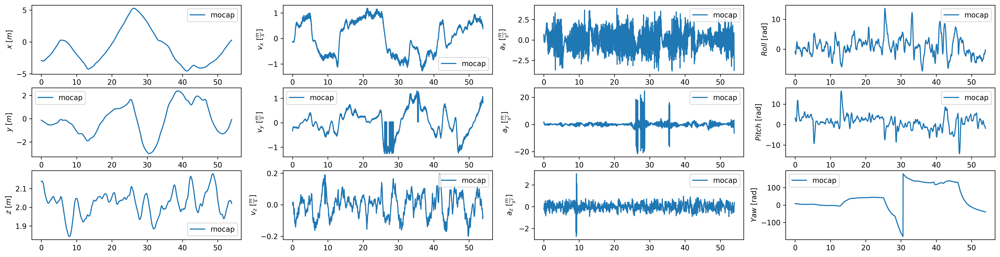

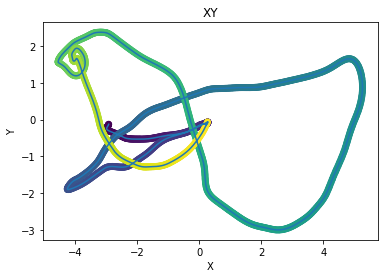

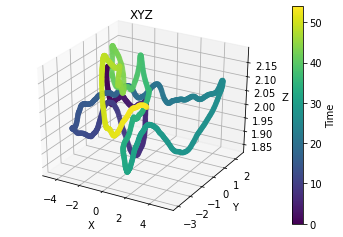

In [439]:
# plot the mocap data 
fig, ax = plt.subplots(3, 4, figsize=(3 * 8, 3 * 2), dpi=300)
# plot x
ax[0, 0].plot(mocap_time_shifted, mocap_X, label='mocap')
ax[0, 0].set_ylabel('$x$ [$m$]')
ax[0, 0].legend()
# plot y
ax[1, 0].plot(mocap_time_shifted, mocap_Y, label='mocap')
ax[1, 0].set_ylabel('$y$ [$m$]')
ax[1, 0].legend()
# plot z
ax[2, 0].plot(mocap_time_shifted, mocap_Z, label='mocap')
ax[2, 0].set_ylabel('$z$ [$m$]')
ax[2, 0].legend()
# plot x_dot
ax[0, 1].plot(mocap_time_shifted, mocap_X_dot, label='mocap')
ax[0, 1].set_ylabel(r'$v_x$ [$\frac{m}{s}$]')
ax[0, 1].legend()
# plot y_dot
ax[1, 1].plot(mocap_time_shifted, mocap_Y_dot, label='mocap')
ax[1, 1].set_ylabel(r'$v_y$ [$\frac{m}{s}$]')
ax[1, 1].legend()
# plot z_dot
ax[2, 1].plot(mocap_time_shifted, mocap_Z_dot, label='mocap')
ax[2, 1].set_ylabel(r'$v_z$ [$\frac{m}{s}$]')
ax[2, 1].legend()
# plot x_ddot
ax[0, 2].plot(mocap_time_shifted, mocap_X_ddot, label='mocap')
ax[0, 2].set_ylabel(r'$a_x$ [$\frac{m}{s^2}$]')
ax[0, 2].legend()
# plot y_ddot
ax[1, 2].plot(mocap_time_shifted, mocap_Y_ddot, label='mocap')
ax[1, 2].set_ylabel(r'$a_y$ [$\frac{m}{s^2}$]')
ax[1, 2].legend()
# plot z_ddot
ax[2, 2].plot(mocap_time_shifted, mocap_Z_ddot, label='mocap')
ax[2, 2].set_ylabel(r'$a_z$ [$\frac{m}{s^2}$]')
ax[2, 2].legend()
# plot Roll
ax[0, 3].plot(mocap_time_shifted, mocap_Roll, label='mocap')
ax[0, 3].set_ylabel('$Roll$ [rad]')
ax[0, 3].legend()
# plot Pitch
ax[1, 3].plot(mocap_time_shifted, mocap_Pitch, label='mocap')
ax[1, 3].set_ylabel('$Pitch$ [rad]')
ax[1, 3].legend()
# plot Yaw
ax[2, 3].plot(mocap_time_shifted, mocap_Yaw, label='mocap')
ax[2, 3].set_ylabel('$Yaw$ [rad]')
ax[2, 3].legend()
plt.show()

# x,y plot of the mocap data
plt.plot(mocap_X, mocap_Y)
plt.scatter(mocap_X, mocap_Y, label='start', c=mocap_time_shifted)
plt.xlabel('X')
plt.ylabel('Y')
plt.title('XY')
plt.show()



# make 3d plot of XYZ with time as color
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
sc = ax.scatter(mocap_X, mocap_Y, mocap_Z, c=mocap_time_shifted)
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
plt.title('XYZ')
plt.colorbar(sc, label='Time')
plt.show()

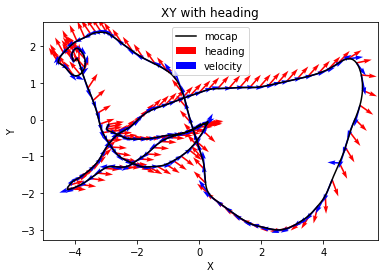

In [440]:
# plot X y data and add heading a s a quiver plot
fig, ax = plt.subplots()
ax.plot(mocap_X, mocap_Y,color='black', label='mocap')
# use mocap_yaw to get the heading
u = np.cos(np.radians(mocap_Yaw))
v = np.sin(np.radians(mocap_Yaw))
# plot every 10th point
ax.quiver(mocap_X[::10], mocap_Y[::10], u[::10], v[::10], angles='xy', scale_units='xy', scale=2, color='r', label='heading')
# add quiver based on velocity
Vu = mocap_X_dot
Vv = mocap_Y_dot
# plot every 10th point
ax.quiver(mocap_X[::10], mocap_Y[::10], Vu[::10], Vv[::10], angles='xy', scale_units='xy', scale=2, color='b', label='velocity')
ax.set_xlabel('X')
ax.set_ylabel('Y')
# add legend
ax.legend()
ax.set_title('XY with heading')
plt.show()

# body level velocities and acclerations

-1.2215369553094935 3.777786025665023 -1.9482800087547885


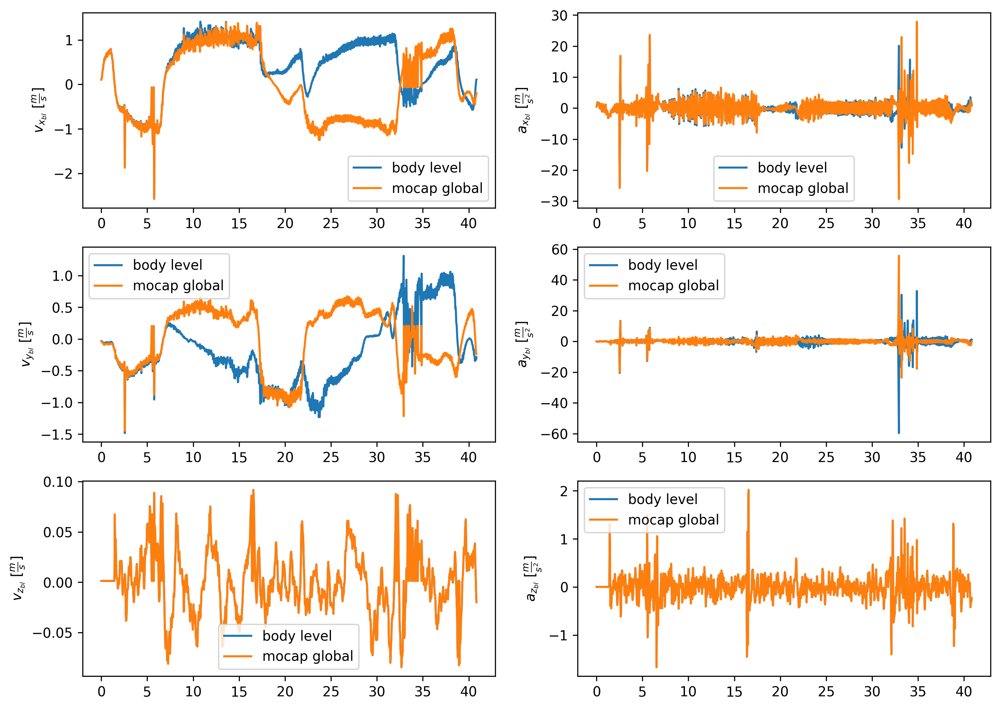

In [338]:
# R_G_BL (rotation from global to body level ) function that takes in roll, pitch, yaw and gives out the rotation matrix

def R_G_BL(roll, pitch, yaw):
    """
    Compute the rotation matrix from global frame to body-level frame.
    This only applies a yaw rotation (inverse of R_z) to align with the body-level frame.

    Args:
    roll  (float): Roll angle (phi) in radians.
    pitch (float): Pitch angle (theta) in radians.
    yaw   (float): Yaw angle (psi) in radians.

    Returns:
    numpy.ndarray: 3x3 rotation matrix from global to body-level frame.
    """
    R_z = np.array([[ np.cos(yaw), np.sin(yaw), 0],
                    [-np.sin(yaw), np.cos(yaw), 0],
                    [ 0, 0, 1]])

    return R_z  # This is R_z(-yaw), rotating global to body-level

    return R_G_BL
print(mocap_Roll[0], mocap_Pitch[0], mocap_Yaw[0])
# Rotate the velocity and acceleration from global to body level
mocap_bl_X_dot = []
mocap_bl_Y_dot = []
mocap_bl_Z_dot = []
mocap_bl_X_ddot = []
mocap_bl_Y_ddot = []
mocap_bl_Z_ddot = []

for i in range(len(mocap_Roll)):
    R_G_BL_i = R_G_BL(np.deg2rad(mocap_Roll[i]), np.deg2rad(mocap_Pitch[i]), np.deg2rad(mocap_Yaw[i]))
    
    # Velocity transformation
    velocity_vector = np.array([mocap_X_dot[i], mocap_Y_dot[i], mocap_Z_dot[i]])
    transformed_velocity = R_G_BL_i @ velocity_vector  # This returns a 3-element vector

    mocap_bl_X_dot.append(transformed_velocity[0])
    mocap_bl_Y_dot.append(transformed_velocity[1])
    mocap_bl_Z_dot.append(transformed_velocity[2])

    # Acceleration transformation
    acceleration_vector = np.array([mocap_X_ddot[i], mocap_Y_ddot[i], mocap_Z_ddot[i]])
    transformed_acceleration = R_G_BL_i @ acceleration_vector  # This returns a 3-element vector

    mocap_bl_X_ddot.append(transformed_acceleration[0])
    mocap_bl_Y_ddot.append(transformed_acceleration[1])
    mocap_bl_Z_ddot.append(transformed_acceleration[2])


# plot the body level velocities and accelerations
fig, ax = plt.subplots(3, 2, figsize=(3 * 4, 3 * 3), dpi=300)
# plot x_dot
ax[0, 0].plot(mocap_time_shifted, mocap_bl_X_dot, label='body level')
ax[0, 0].plot(mocap_time_shifted, mocap_X_dot, label='mocap global')
ax[0, 0].set_ylabel(r'$v_{x_{bl}}$ [$\frac{m}{s}$]')
ax[0, 0].legend()
# plot y_dot
ax[1, 0].plot(mocap_time_shifted, mocap_bl_Y_dot, label='body level')
ax[1, 0].plot(mocap_time_shifted, mocap_Y_dot, label='mocap global')
ax[1, 0].set_ylabel(r'$v_{y_{bl}}$ [$\frac{m}{s}$]')
ax[1, 0].legend()
# plot z_dot
ax[2, 0].plot(mocap_time_shifted, mocap_bl_Z_dot, label='body level')
ax[2, 0].plot(mocap_time_shifted, mocap_Z_dot, label='mocap global')
ax[2, 0].set_ylabel(r'$v_{z_{bl}}$ [$\frac{m}{s}$]')
ax[2, 0].legend()
# plot x_ddot
ax[0, 1].plot(mocap_time_shifted, mocap_bl_X_ddot, label='body level')
ax[0, 1].plot(mocap_time_shifted, mocap_X_ddot, label='mocap global')
ax[0, 1].set_ylabel(r'$a_{x_{bl}}$ [$\frac{m}{s^2}$]')
ax[0, 1].legend()
# plot y_ddot
ax[1, 1].plot(mocap_time_shifted, mocap_bl_Y_ddot, label='body level')
ax[1, 1].plot(mocap_time_shifted, mocap_Y_ddot, label='mocap global')
ax[1, 1].set_ylabel(r'$a_{y_{bl}}$ [$\frac{m}{s^2}$]')
ax[1, 1].legend()
# plot z_ddot
ax[2, 1].plot(mocap_time_shifted, mocap_bl_Z_ddot, label='body level')
ax[2, 1].plot(mocap_time_shifted, mocap_Z_ddot, label='mocap global')
ax[2, 1].set_ylabel(r'$a_{z_{bl}}$ [$\frac{m}{s^2}$]')
ax[2, 1].legend()
plt.show()


# IMU [Roll($\phi$),Pitch($\theta$),Yaw($\psi$)] + [$\omega_x$,$\omega_y$,$\omega_z$] + [$A_x$,$A_y$,$A_z$]

imu dt: 49.9963925234408
mocap dt: 30.001287836744122


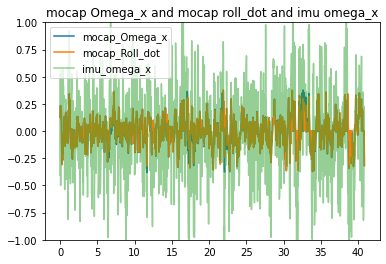

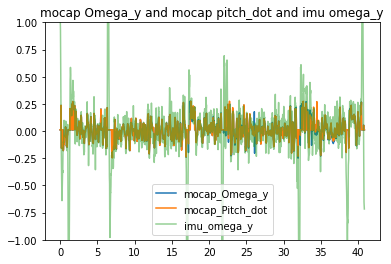

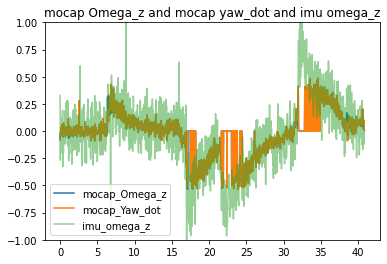

In [339]:
imu_time = data['mavros/imu/data']['rosbagTimestamp']/1e9/2
imu_time_shifted = imu_time - imu_time[0]
imu_Roll, imu_Pitch, imu_Yaw = [], [], []
for i in range(len(data['mavros/imu/data'])):
    R, P, Y = quaternion_to_euler(data['mavros/imu/data']['x'][i],
                                  data['mavros/imu/data']['y'][i],
                                  data['mavros/imu/data']['z'][i],
                                  data['mavros/imu/data']['w'][i])
    imu_Roll.append(np.radians(R))
    imu_Pitch.append(np.radians(P))
    imu_Yaw.append(np.radians(Y))

imu_omega_x = data['mavros/imu/data']['x.1']
imu_omega_y = data['mavros/imu/data']['y.1']
imu_omega_z = data['mavros/imu/data']['z.1']

# function that goes from omega_dot to phi_dot, theta_dot, psi_dot

def omega_to_euler_dot(omega_x, omega_y, omega_z, phi, theta, psi):
    """
    Converts angular velocity components (omega_x, omega_y, omega_z)
    to Euler angle rates (phi_dot, theta_dot, psi_dot).

    input: omega_x, omega_y, omega_z, phi, theta
    output: phi_dot, theta_dot, psi_dot
    """
    phi_dot = omega_x + omega_y * np.tan(theta) * np.sin(phi) + omega_z * np.tan(theta) * np.cos(phi)
    theta_dot = omega_y * np.cos(phi) - omega_z * np.sin(phi)
    psi_dot = omega_y * np.sin(phi) / np.cos(theta) + omega_z * np.cos(phi) / np.cos(theta)

    return phi_dot, theta_dot, psi_dot

def euler_dot_to_omega(phi_dot, theta_dot, psi_dot, phi, theta, psi):
    """
    Converts Euler angle rates (phi_dot, theta_dot, psi_dot)
    to angular velocity components (omega_x, omega_y, omega_z).

    input: phi_dot, theta_dot, psi_dot, phi, theta
    output: omega_x, omega_y, omega_z
    """
    omega_x = phi_dot - psi_dot * np.sin(theta)
    omega_y = theta_dot * np.cos(phi) + psi_dot * np.cos(theta) * np.sin(phi)
    omega_z = -theta_dot * np.sin(phi) + psi_dot * np.cos(theta) * np.cos(phi)

    return omega_x, omega_y, omega_z

imu_phi_dot, imu_theta_dot, imu_psi_dot = [], [], []
for i in range(len(data['mavros/imu/data'])):
    phi_dot, theta_dot, psi_dot = omega_to_euler_dot(imu_omega_x[i],
                                                         imu_omega_y[i],
                                                         imu_omega_z[i],
                                                         imu_Roll[i],
                                                         imu_Pitch[i],
                                                         imu_Yaw[i])
    imu_phi_dot.append(phi_dot)
    imu_theta_dot.append(theta_dot)
    imu_psi_dot.append(psi_dot)
# using mocap data get Omega_x, Omega_y, Omega_z
mocap_Omega_x, mocap_Omega_y, mocap_Omega_z = [], [], []
for i in range(len(data['mavros/local_position/pose'])):
    omega_x, omega_y, omega_z = euler_dot_to_omega(np.gradient(np.deg2rad(mocap_Roll), mocap_time)[i],
                                                    np.gradient(np.deg2rad(mocap_Pitch), mocap_time)[i],
                                                    np.gradient(np.deg2rad(mocap_Yaw), mocap_time)[i],
                                                    np.deg2rad(mocap_Roll[i]),
                                                    np.deg2rad(mocap_Pitch[i]),
                                                    np.deg2rad(mocap_Yaw[i]))
    mocap_Omega_x.append(omega_x)
    mocap_Omega_y.append(omega_y)
    mocap_Omega_z.append(omega_z)

mocap_Omega_x = remove_outliers(mocap_Omega_x, method='iqr', threshold=1.5)
mocap_Omega_y = remove_outliers(mocap_Omega_y, method='iqr', threshold=1.5)
mocap_Omega_z = remove_outliers(mocap_Omega_z, method='iqr', threshold=1.5)                                                   

# function that goes from phi_dot, theta_dot, psi_dot to omega_x, omega_y, omega_z
def euler_dot_to_omega_dot(phi_dot, theta_dot, psi_dot, phi, theta):
    """
    input: phi_dot, theta_dot, psi_dot, phi, theta
    output: omega_x, omega_y, omega_z
    """
    omega_x = phi_dot - psi_dot * np.sin(theta)
    omega_y = theta_dot * np.cos(phi) + psi_dot * np.cos(theta) * np.sin(phi)
    omega_z = psi_dot * np.cos(theta) * np.cos(phi) - theta_dot * np.sin(phi)
    return omega_x, omega_y, omega_z

# take the gradient of imu_roll, imu_pitch, imu_yaw to get the angular velocities
imu_Roll_dot = np.gradient(imu_Roll, imu_time)
imu_Pitch_dot = np.gradient(imu_Pitch, imu_time)
imu_Yaw_dot = np.gradient(imu_Yaw, imu_time)

mocap_Roll_dot=remove_outliers(np.gradient(np.deg2rad(mocap_Roll), mocap_time), method='iqr', threshold=1.5)
mocap_Pitch_dot=remove_outliers(np.gradient(np.deg2rad(mocap_Pitch), mocap_time), method='iqr', threshold=1.5)
mocap_Yaw_dot=remove_outliers(np.gradient(np.deg2rad(mocap_Yaw), mocap_time), method='iqr', threshold=1.5)

print('imu dt:', 1/np.mean(np.diff(imu_time)))
print('mocap dt:', 1/np.mean(np.diff(mocap_time)))
# interpolate IMU to mocap time
# imu_omega_x = interpolate_data(imu_time, imu_omega_x, mocap_time)
# imu_omega_y = interpolate_data(imu_time, imu_omega_y, mocap_time)
# imu_omega_z = interpolate_data(imu_time, imu_omega_z, mocap_time)


plt.plot(mocap_time_shifted, mocap_Omega_x, label='mocap_Omega_x')
plt.plot(mocap_time_shifted, mocap_Roll_dot, label='mocap_Roll_dot')
plt.plot(imu_time_shifted, imu_omega_x, label='imu_omega_x',alpha=.5)
plt.title('mocap Omega_x and mocap roll_dot and imu omega_x')
plt.ylim(-1,1)
plt.legend()
plt.show()


plt.plot(mocap_time_shifted, mocap_Omega_y, label='mocap_Omega_y')
plt.plot(mocap_time_shifted, mocap_Pitch_dot, label='mocap_Pitch_dot')
plt.plot(imu_time_shifted, imu_omega_y, label='imu_omega_y',alpha=.5)
plt.title('mocap Omega_y and mocap pitch_dot and imu omega_y')
plt.ylim(-1,1)
plt.legend()
plt.show()

plt.plot(mocap_time_shifted, mocap_Omega_z, label='mocap_Omega_z')
plt.plot(mocap_time_shifted, mocap_Yaw_dot, label='mocap_Yaw_dot')
plt.plot(imu_time_shifted, imu_omega_z, label='imu_omega_z',alpha=.5)
plt.title('mocap Omega_z and mocap yaw_dot and imu omega_z')
plt.ylim(-1,1)
plt.legend()
plt.show()



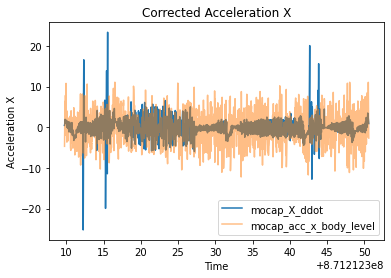

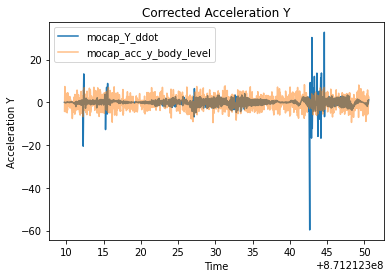

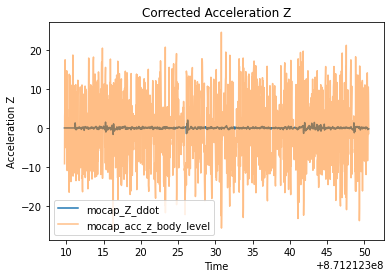

In [340]:
g = 9.81  # Gravitational acceleration (m/s^2)

# Function to compute the rotation matrix from roll, pitch, yaw
def rotation_matrix_from_euler(roll, pitch, yaw):
    """
    Creates a rotation matrix from roll, pitch, yaw angles (in radians).
    """
    # Compute rotation matrices for roll, pitch, and yaw
    R_roll = np.array([
        [1, 0, 0],
        [0, np.cos(roll), -np.sin(roll)],
        [0, np.sin(roll), np.cos(roll)]
    ])
    
    R_pitch = np.array([
        [np.cos(pitch), 0, np.sin(pitch)],
        [0, 1, 0],
        [-np.sin(pitch), 0, np.cos(pitch)]
    ])
    
    R_yaw = np.array([
        [np.cos(yaw), -np.sin(yaw), 0],
        [np.sin(yaw), np.cos(yaw), 0],
        [0, 0, 1]
    ])
    
    # Combine the rotation matrices (Z * Y * X)
    R = R_yaw @ R_pitch @ R_roll
    return R

# Function to remove gravity from linear acceleration
def remove_gravity_from_acceleration(acc_x, acc_y, acc_z, roll, pitch, yaw):
    """
    Removes the gravity component from the linear acceleration in the body frame.
    
    acc_x, acc_y, acc_z: numpy arrays
        Arrays of linear acceleration in the body frame along the x, y, and z axes.
    roll, pitch, yaw: numpy arrays
        Arrays of roll, pitch, and yaw angles (in radians).
    
    Returns:
    acc_x_corrected, acc_y_corrected, acc_z_corrected: numpy arrays
        Corrected linear accelerations with gravity removed along the x, y, and z axes.
    """
    # Initialize corrected acceleration arrays
    acc_x_corrected = np.zeros_like(acc_x)
    acc_y_corrected = np.zeros_like(acc_y)
    acc_z_corrected = np.zeros_like(acc_z)
    
    # Gravity vector in the world frame (assume gravity points along the Z-axis)
    gravity_world = np.array([0, 0, g])
    
    # Loop over each time step and correct the acceleration
    for i in range(len(acc_x)):
        # Get the rotation matrix for the current orientation (roll, pitch, yaw)
        R = rotation_matrix_from_euler(roll[i], pitch[i], yaw[i])
        
        # Transform gravity vector from world frame to body frame
        gravity_body = R.T @ gravity_world  # Transpose R to rotate from world to body
        
        # Measured acceleration in body frame
        acc_body = np.array([acc_x[i], acc_y[i], acc_z[i]])
        
        # Subtract gravity from the body-frame acceleration
        acc_corrected = acc_body - gravity_body
        
        # Store the corrected acceleration
        acc_x_corrected[i] = acc_corrected[0]
        acc_y_corrected[i] = acc_corrected[1]
        acc_z_corrected[i] = acc_corrected[2]
    
    return acc_x_corrected, acc_y_corrected, acc_z_corrected

# Remove gravity from the linear acceleration
imu_acc_x_corrected, imu_acc_y_corrected, imu_acc_z_corrected = remove_gravity_from_acceleration(
    data['mavros/imu/data']['x.2'],
    data['mavros/imu/data']['y.2'],
    data['mavros/imu/data']['z.2'],
    imu_Roll, imu_Pitch, imu_Yaw
)

# rotate the acceleration data to the world frame
def rotate_acceleration_to_world_frame(acc_x, acc_y, acc_z, roll, pitch, yaw):
    """
    Rotates the linear acceleration from the body frame to the world frame.
    
    acc_x, acc_y, acc_z: numpy arrays
        Arrays of linear acceleration in the body frame along the x, y, and z axes.
    roll, pitch, yaw: numpy arrays
        Arrays of roll, pitch, and yaw angles (in radians).
    
    Returns:
    acc_x_world, acc_y_world, acc_z_world: numpy arrays
        Linear acceleration in the world frame along the x, y, and z axes.
    """
    # Initialize world-frame acceleration arrays
    acc_x_world = np.zeros_like(acc_x)
    acc_y_world = np.zeros_like(acc_y)
    acc_z_world = np.zeros_like(acc_z)
    
    # Loop over each time step and rotate the acceleration
    for i in range(len(acc_x)):
        # Get the rotation matrix for the current orientation (roll, pitch, yaw)
        R = rotation_matrix_from_euler(roll[i], pitch[i], yaw[i])
        
        # Measured acceleration in body frame
        acc_body = np.array([acc_x[i], acc_y[i], acc_z[i]])
        
        # Rotate the body-frame acceleration to the world frame
        acc_world = R @ acc_body
        
        # Store the world-frame acceleration
        acc_x_world[i] = acc_world[0]
        acc_y_world[i] = acc_world[1]
        acc_z_world[i] = acc_world[2]
    
    return acc_x_world, acc_y_world, acc_z_world

# Rotate the acceleration data to the world frame
imu_acc_x_corrected_world, imu_acc_y_corrected_world, imu_acc_z_corrected_world = rotate_acceleration_to_world_frame(
    imu_acc_x_corrected, imu_acc_y_corrected, imu_acc_z_corrected, imu_Roll, imu_Pitch, imu_Yaw
)


# creat rotation from body to body level frame ie roll and pitch
def rotation_matrix_from_roll_pitch(roll, pitch):
    """
    Creates a rotation matrix from roll and pitch angles (in radians).
    """
    # Compute rotation matrices for roll and pitch
    R_roll = np.array([
        [1, 0, 0],
        [0, np.cos(roll), -np.sin(roll)],
        [0, np.sin(roll), np.cos(roll)]
    ])
    
    R_pitch = np.array([
        [np.cos(pitch), 0, np.sin(pitch)],
        [0, 1, 0],
        [-np.sin(pitch), 0, np.cos(pitch)]
    ])
    
    # Combine the rotation matrices
    R_b_bl = R_pitch @ R_roll
    return R_b_bl

# rotate the acceleration from the body frame to the body level frame
def rotate_acceleration_to_body_level_frame(acc_x, acc_y, acc_z, roll, pitch):
    """
    Rotates the linear acceleration from the body frame to the body level frame.
    
    acc_x, acc_y, acc_z: numpy arrays
        Arrays of linear acceleration in the body frame along the x, y, and z axes.
    roll, pitch: numpy arrays
        Arrays of roll and pitch angles (in radians).
    
    Returns:
    acc_x_body_level, acc_y_body_level, acc_z_body_level: numpy arrays
        Linear acceleration in the body level frame along the x, y, and z axes.
    """
    # Initialize body-level acceleration arrays
    acc_x_body_level = np.zeros_like(acc_x)
    acc_y_body_level = np.zeros_like(acc_y)
    acc_z_body_level = np.zeros_like(acc_z)
    
    # Loop over each time step and rotate the acceleration
    for i in range(len(acc_x)):
        # Get the rotation matrix for the current orientation (roll, pitch)
        R = rotation_matrix_from_roll_pitch(roll[i], pitch[i])
        
        # Measured acceleration in body frame
        acc_body = np.array([acc_x[i], acc_y[i], acc_z[i]])
        
        # Rotate the body-frame acceleration to the body level frame
        acc_body_level = R @ acc_body
        
        # Store the body-level acceleration
        acc_x_body_level[i] = acc_body_level[0]
        acc_y_body_level[i] = acc_body_level[1]
        acc_z_body_level[i] = acc_body_level[2]
    
    return acc_x_body_level, acc_y_body_level, acc_z_body_level

acc_x_body_level, acc_y_body_level, acc_z_body_level = rotate_acceleration_to_body_level_frame(
    imu_acc_x_corrected, imu_acc_y_corrected, imu_acc_z_corrected, imu_Roll, imu_Pitch
)


# plt.plot(imu_time, imu_acc_x_corrected_world,label='imu_acc_x_corrected')
plt.plot(mocap_time, mocap_bl_X_ddot,label='mocap_X_ddot')
plt.plot(imu_time, acc_x_body_level,label='mocap_acc_x_body_level',alpha=0.5)
# plt.plot(mocap_time, mocap_X_ddot,label='mocap_X_ddot',alpha=0.5)
plt.title('Corrected Acceleration X')
plt.xlabel('Time')
plt.ylabel('Acceleration X')
plt.legend()
plt.show()

# plt.plot(imu_time, imu_acc_y_corrected_world,label='imu_acc_y_corrected')
plt.plot(mocap_time, mocap_bl_Y_ddot,label='mocap_Y_ddot')
plt.plot(imu_time, acc_y_body_level,label='mocap_acc_y_body_level',alpha=0.5)
# plt.plot(mocap_time, mocap_Y_ddot,label='mocap_Y_ddot',alpha=0.5)
plt.title('Corrected Acceleration Y')
plt.xlabel('Time')
plt.ylabel('Acceleration Y')
plt.legend()
plt.show()

# plt.plot(imu_time, imu_acc_z_corrected_world,label='imu_acc_z_corrected')
plt.plot(mocap_time, mocap_bl_Z_ddot,label='mocap_Z_ddot')
plt.plot(imu_time, acc_z_body_level,label='mocap_acc_z_body_level',alpha=0.5)
# plt.plot(mocap_time, mocap_Z_ddot,label='mocap_Z_ddot',alpha=0.5)
plt.title('Corrected Acceleration Z')
plt.xlabel('Time')
plt.ylabel('Acceleration Z')
plt.legend()
plt.show()


# optic flow (body level) - camera data

optic_flow_camera_dt: 29.971995410758


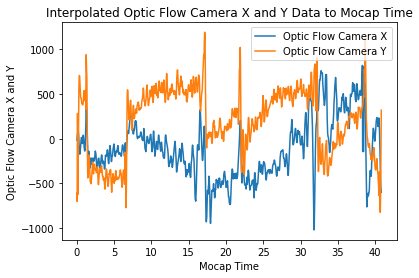

In [341]:
optic_flow_camera_x_time = data['optic_flow/camera/mean/x']['rosbagTimestamp']/1e9/2
optic_flow_camera_y_time = data['optic_flow/camera/mean/y']['rosbagTimestamp']/1e9/2
optic_flow_camera_x = data['optic_flow/camera/mean/x']['data']
optic_flow_camera_y = data['optic_flow/camera/mean/y']['data']

# get dt of optic flow camera data
optic_flow_camera_dt = np.mean(np.diff(optic_flow_camera_x_time))
print('optic_flow_camera_dt:', 1/optic_flow_camera_dt)

# interpolate optic flow camera data to mocap time
optic_flow_camera_x_mocap_interp = interpolate_data(optic_flow_camera_x_time, optic_flow_camera_x, mocap_time)
optic_flow_camera_y_mocap_interp = interpolate_data(optic_flow_camera_y_time, optic_flow_camera_y, mocap_time)

optic_flow_camera_x_mocap_interp=optic_flow_camera_x_mocap_interp
optic_flow_camera_y_mocap_interp=optic_flow_camera_y_mocap_interp

optic_flow_camera_x_mocap_interp[np.abs(optic_flow_camera_x_mocap_interp - np.median(optic_flow_camera_x_mocap_interp)) > 3 * np.std(optic_flow_camera_x_mocap_interp)] = np.median(optic_flow_camera_x_mocap_interp)
optic_flow_camera_y_mocap_interp[np.abs(optic_flow_camera_y_mocap_interp - np.median(optic_flow_camera_y_mocap_interp)) > 3 * np.std(optic_flow_camera_y_mocap_interp)] = np.median(optic_flow_camera_y_mocap_interp)

# Plot the interpolated data
plt.plot(mocap_time_shifted, optic_flow_camera_x_mocap_interp, label="Optic Flow Camera X")
plt.plot(mocap_time_shifted, optic_flow_camera_y_mocap_interp, label="Optic Flow Camera Y")
plt.title('Interpolated Optic Flow Camera X and Y Data to Mocap Time')
plt.xlabel('Mocap Time')
plt.ylabel('Optic Flow Camera X and Y')
plt.legend()
plt.show()

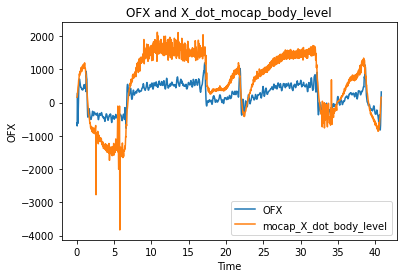

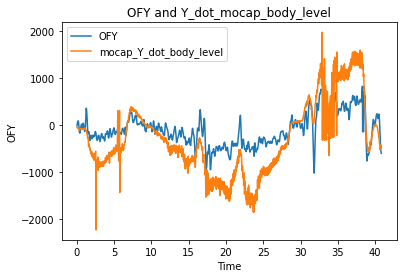

In [342]:
OFX=optic_flow_camera_x_mocap_interp.copy()
OFY=optic_flow_camera_y_mocap_interp.copy()

# apply a yaw rotation to the optic flow data using matrix multiplication
def rotate_optic_flow(OFX, OFY):
    """
    input: OFX, OFY
    output: rotated OFX, OFY
    """
    # apply a 180 degree rotation about x axis using the rotation matrix
    OFX = OFX*1
    OFY = OFY*np.cos(np.pi)

    # un yawing and rotating by 90 degrees
    OFY_rot = np.sin(np.pi/2) * OFX + np.cos(np.pi/2) * OFY
    OFX_rot = np.cos(np.pi/2) * OFX - np.sin(np.pi/2) * OFY
    return OFX_rot, OFY_rot


OFX_rot, OFY_rot = rotate_optic_flow(OFX, OFY)

plt.plot(mocap_time_shifted, OFX_rot,label='OFX')
plt.plot(mocap_time_shifted, np.multiply(mocap_bl_X_dot,1500),label='mocap_X_dot_body_level')
plt.title('OFX and X_dot_mocap_body_level')
plt.xlabel('Time')
plt.ylabel('OFX')
plt.legend()
plt.show()

plt.plot(mocap_time_shifted, OFY_rot,label='OFY')
plt.plot(mocap_time_shifted, np.multiply(mocap_bl_Y_dot,1500),label='mocap_Y_dot_body_level')
plt.title('OFY and Y_dot_mocap_body_level')
plt.xlabel('Time')
plt.ylabel('OFY')
plt.legend()
plt.show()


1226
Scalar (meters/pixel) X: 0.0015627317737934366
Scalar (meters/pixel) Y: 0.0013137470752592553


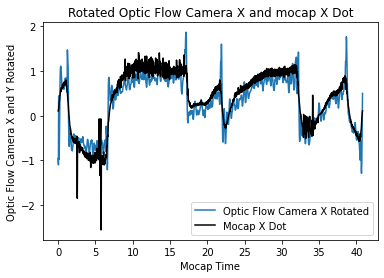

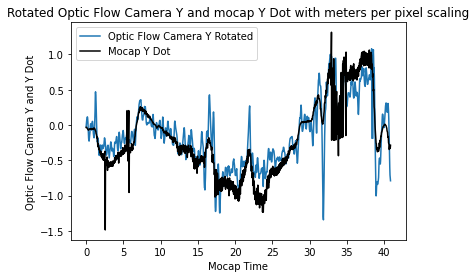

In [343]:
# Reshape the optic flow data to fit the linear regression model
OFX_rot_temp = np.array(OFX_rot)[:int(len(optic_flow_camera_x_mocap_interp)/1)].reshape(-1, 1)
OFY_rot_temp = np.array(OFY_rot)[:int(len(optic_flow_camera_x_mocap_interp)/1)].reshape(-1, 1)
print(len(OFY))
# Perform linear regression
modelX = LinearRegression()
modelX.fit(OFX_rot_temp, mocap_bl_X_dot[:int(len(optic_flow_camera_x_mocap_interp)/1)])

# The slope of the linear regression gives you the scalar (meters/pixel)
meters_per_pixel_X = modelX.coef_[0]
optic_flow_scalar_X = meters_per_pixel_X.copy()
print(f"Scalar (meters/pixel) X: {meters_per_pixel_X}")

modelY = LinearRegression()
modelY.fit(OFY_rot_temp, mocap_bl_Y_dot[:int(len(optic_flow_camera_x_mocap_interp)/1)])

# The slope of the linear regression gives you the scalar (meters/pixel)
meters_per_pixel_Y = modelY.coef_[0]
optic_flow_scalar_Y = meters_per_pixel_Y.copy()
print(f"Scalar (meters/pixel) Y: {meters_per_pixel_Y}")

# Plot the rotated optic flow data
plt.plot(mocap_time_shifted, np.multiply(OFX_rot,meters_per_pixel_X), label="Optic Flow Camera X Rotated")
plt.plot(mocap_time_shifted,np.multiply(mocap_bl_X_dot,1), label="Mocap X Dot",color='black')
# plt.plot(mocap_time, OFY_rot, label="Optic Flow Camera Y Rotated")
plt.title('Rotated Optic Flow Camera X and mocap X Dot')
plt.xlabel('Mocap Time')
plt.ylabel('Optic Flow Camera X and Y Rotated')
plt.legend()
plt.show()

plt.plot(mocap_time_shifted, np.multiply(OFY_rot,meters_per_pixel_Y), label="Optic Flow Camera Y Rotated")
plt.plot(mocap_time_shifted,np.multiply(mocap_bl_Y_dot,1), label="Mocap Y Dot",color='black')
plt.title('Rotated Optic Flow Camera Y and mocap Y Dot with meters per pixel scaling')
plt.xlabel('Mocap Time')
plt.ylabel('Optic Flow Camera Y and Y Dot')
plt.legend()
plt.show()

# stats model 

                            OLS Regression Results                            
Dep. Variable:                    vel   R-squared:                       0.808
Model:                            OLS   Adj. R-squared:                  0.808
Method:                 Least Squares   F-statistic:                     5142.
Date:                Mon, 28 Apr 2025   Prob (F-statistic):               0.00
Time:                        22:34:28   Log-Likelihood:                 654.43
No. Observations:                1226   AIC:                            -1305.
Df Residuals:                    1224   BIC:                            -1295.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      0.0446      0.005      9.609      0.0

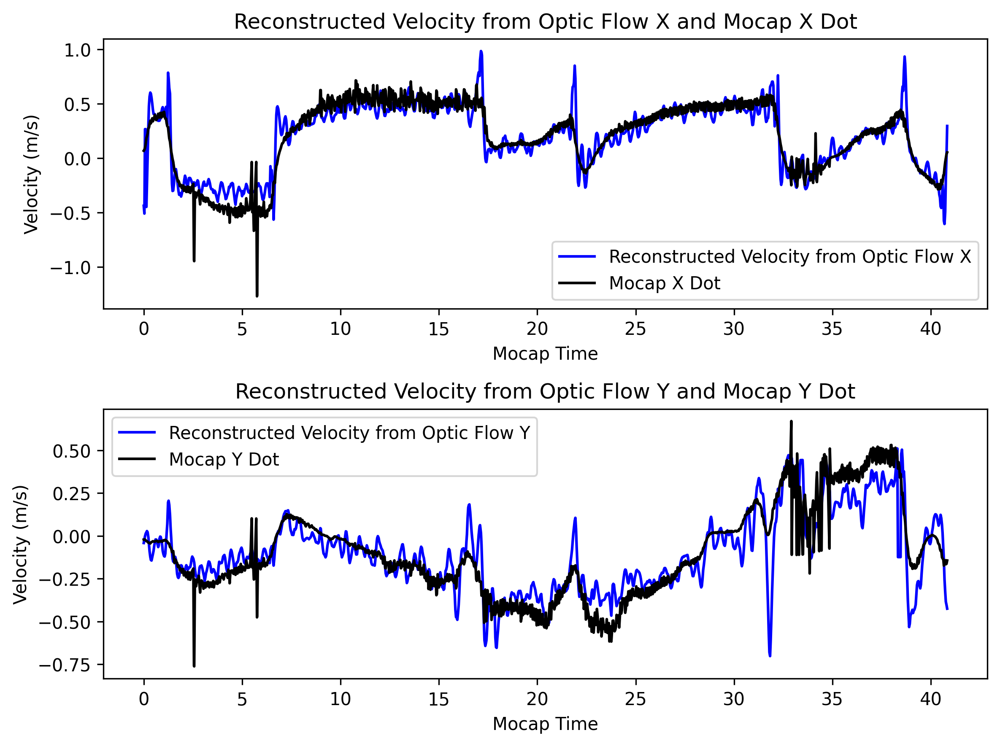

In [344]:
import pandas as pd
import statsmodels.formula.api as smf

# Create DataFrame for X-axis
df_X = pd.DataFrame({
    'flow': np.array(OFX_rot)[:len(optic_flow_camera_x_mocap_interp)],
    'vel': np.divide(mocap_bl_X_dot[:len(optic_flow_camera_x_mocap_interp)],mocap_Z[:len(optic_flow_camera_x_mocap_interp)])
})

# Run regression for X-axis
modelX = smf.ols('vel ~ flow', data=df_X).fit()
optic_flow_scalar_X = modelX.params['flow']
optic_flow_intercept_X = modelX.params['Intercept']
vel_from_optic_flow_X = optic_flow_scalar_X * np.array(OFX_rot)[:len(optic_flow_camera_x_mocap_interp)]+ optic_flow_intercept_X
print(modelX.summary())
print(f"Scalar (meters/pixel) X: {optic_flow_scalar_X}")

# Create DataFrame for Y-axis
df_Y = pd.DataFrame({
    'flow': np.array(OFY_rot)[:len(optic_flow_camera_x_mocap_interp)],
    'vel': np.divide(mocap_bl_Y_dot[:len(optic_flow_camera_x_mocap_interp)],mocap_Z[:len(optic_flow_camera_x_mocap_interp)])
})

# Run regression for Y-axis
modelY = smf.ols('vel ~ flow', data=df_Y).fit()
optic_flow_scalar_Y = modelY.params['flow']
optic_flow_intercept_Y = modelY.params['Intercept']
vel_from_optic_flow_Y = optic_flow_scalar_Y * np.array(OFY_rot)[:len(optic_flow_camera_x_mocap_interp)]+ optic_flow_intercept_Y
print(modelY.summary())
print(f"Scalar (meters/pixel) Y: {optic_flow_scalar_Y}")

# plot the reconstructed velocity based on the optic flow data and the statsmodels
fig, ax = plt.subplots(2, 1, figsize=(8, 6), dpi=300)
# Plot X-axis
ax[0].plot(mocap_time_shifted, vel_from_optic_flow_X, label="Reconstructed Velocity from Optic Flow X", color='blue')
ax[0].plot(mocap_time_shifted, np.divide(mocap_bl_X_dot[:len(optic_flow_camera_x_mocap_interp)],mocap_Z[:len(optic_flow_camera_x_mocap_interp)]), label="Mocap X Dot", color='black')
ax[0].set_title('Reconstructed Velocity from Optic Flow X and Mocap X Dot')
ax[0].set_xlabel('Mocap Time')
ax[0].set_ylabel('Velocity (m/s)')
ax[0].legend()
# Plot Y-axis
ax[1].plot(mocap_time_shifted, vel_from_optic_flow_Y, label="Reconstructed Velocity from Optic Flow Y", color='blue')
ax[1].plot(mocap_time_shifted, np.divide(mocap_bl_Y_dot[:len(optic_flow_camera_x_mocap_interp)],mocap_Z[:len(optic_flow_camera_x_mocap_interp)]), label="Mocap Y Dot", color='black')
ax[1].set_title('Reconstructed Velocity from Optic Flow Y and Mocap Y Dot')
ax[1].set_xlabel('Mocap Time')
ax[1].set_ylabel('Velocity (m/s)')
ax[1].legend()
plt.tight_layout()
plt.show()


0.14188545279825018


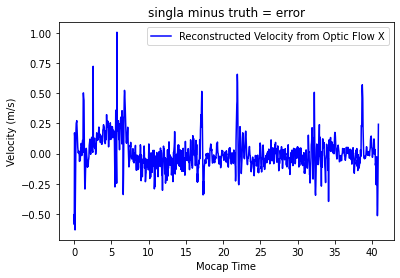

In [345]:
plt.plot(mocap_time_shifted, vel_from_optic_flow_X-np.divide(mocap_bl_X_dot[:len(optic_flow_camera_x_mocap_interp)],mocap_Z[:len(optic_flow_camera_x_mocap_interp)]), label="Reconstructed Velocity from Optic Flow X", color='blue')
plt.title('singla minus truth = error')
plt.xlabel('Mocap Time')
plt.ylabel('Velocity (m/s)')
plt.legend()

print(np.std(vel_from_optic_flow_X-np.divide(mocap_bl_X_dot[:len(optic_flow_camera_x_mocap_interp)],mocap_Z[:len(optic_flow_camera_x_mocap_interp)])))

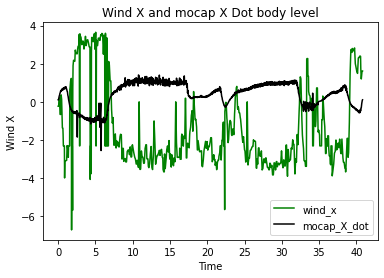

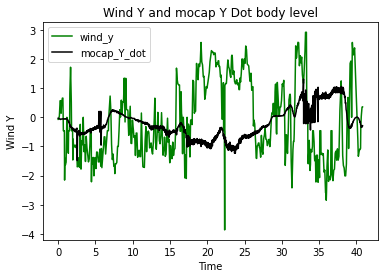

In [346]:
wind_time = data['trisonica']['rosbagTimestamp']/1e9/2
wind_time_shifted = wind_time - wind_time[0]
wind_x = data['trisonica']['westeast']
wind_y = -1*data['trisonica']['northsouth']

# interpolate wind data to mocap time
wind_x_mocap_interp = interpolate_data(wind_time, wind_x, mocap_time)
wind_y_mocap_interp = interpolate_data(wind_time, wind_y, mocap_time)

wind_x_mocap_interp = remove_outliers(wind_x_mocap_interp)
wind_y_mocap_interp = remove_outliers(wind_y_mocap_interp)

# # # filter out large spikes in the wind data
# if FLAG_FILE == "con_vel" or FLAG_FILE == "con_vel_con_yaw":
#     wind_x_mocap_interp[np.abs(wind_x_mocap_interp - np.median(wind_x_mocap_interp)) > 3 * np.std(wind_x_mocap_interp)] = np.median(wind_x_mocap_interp)
#     wind_y_mocap_interp[np.abs(wind_y_mocap_interp - np.median(wind_y_mocap_interp)) > 3 * np.std(wind_y_mocap_interp)] = np.median(wind_y_mocap_interp)


plt.plot(mocap_time_shifted, wind_x_mocap_interp,label='wind_x',color='green')
# plt.plot(wind_time_shifted, wind_x,label='wind_x',color='green')
# plt.plot(mocap_time_shifted, np.multiply(OFX_rot,meters_per_pixel_X), label="Optic Flow Camera X Rotated",color='blue')
plt.plot(mocap_time_shifted, mocap_bl_X_dot,label='mocap_X_dot',color='black')
plt.title('Wind X and mocap X Dot body level')
plt.xlabel('Time')
plt.ylabel('Wind X')
plt.legend()
plt.show()

plt.plot(mocap_time_shifted, wind_y_mocap_interp,label='wind_y',color='green')
# plt.plot(mocap_time_shifted, np.multiply(OFY_rot,meters_per_pixel_Y), label="Optic Flow Camera Y Rotated",color='blue')
plt.plot(mocap_time_shifted, mocap_bl_Y_dot,label='mocap_Y_dot',color='black')
plt.title('Wind Y and mocap Y Dot body level')
plt.xlabel('Time')
plt.ylabel('Wind Y')
plt.legend()
plt.show()

# mocap groung speed and direction
mocap_ground_speed = np.sqrt(np.square(mocap_bl_X_dot) + np.square(mocap_bl_Y_dot))
mocap_ground_direction = np.arctan2(mocap_bl_Y_dot, mocap_bl_X_dot)
wind_ground_speed = np.sqrt(np.square(wind_x_mocap_interp) + np.square(wind_y_mocap_interp))
wind_ground_direction = np.arctan2(wind_y_mocap_interp, wind_x_mocap_interp)

# plt.plot(mocap_time_shifted, mocap_ground_speed,label='mocap_ground_speed',color='black')
# plt.plot(mocap_time_shifted, wind_ground_speed,label='wind_speed',color='green')
# plt.title('Ground Speed')
# plt.xlabel('Time')
# plt.ylabel('Speed')
# plt.legend()
# plt.show()

# plt.plot(mocap_time_shifted, mocap_ground_direction,label='mocap_ground_direction',color='black')
# # plt.plot(mocap_time_shifted, wind_ground_direction,label='wind_direction',color='green')
# plt.title('Ground Direction')
# plt.xlabel('Time')
# plt.ylabel('Direction')
# plt.legend()
# plt.show()


Scalar X: -0.24102019964780197
Scalar Y: -0.14384277612227803


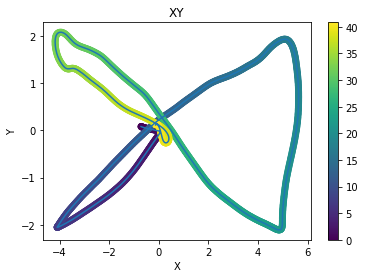

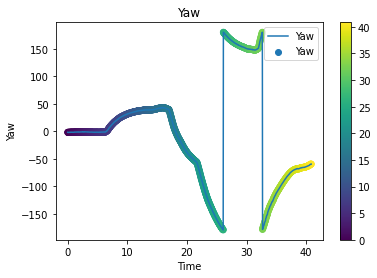

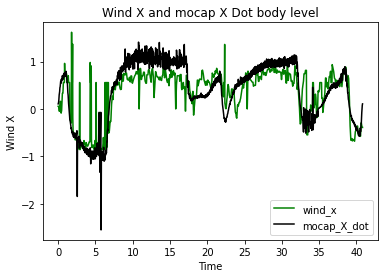

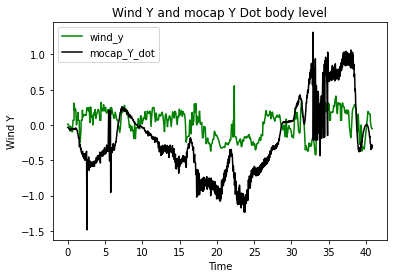

In [347]:

if FLAG_FILE == 'neg_X':
    start_int_x = 0
    stop_int_x = 1/4
    start_int_y = 0
    stop_int_y = 4/4
elif FLAG_FILE == 'con_vel':
    stop_int_x = 1/4
    start_int_y = 1/4
    stop_int_y = 2/4
elif FLAG_FILE == 'con_vel_con_yaw':
    start_int_x = 0/4
    stop_int_x = 4/4
    start_int_y = 2/4
    stop_int_y = 3/4
else:
    start_int_x = 0
    stop_int_x = 4/4
    start_int_y = 0
    stop_int_y = 4/4

wind_body_level_x, wind_body_level_y =np.array(wind_x_mocap_interp).reshape(-1, 1), np.array(wind_y_mocap_interp).reshape(-1, 1)

wind_body_level_x_temp, wind_body_level_y_temp =np.array(wind_x_mocap_interp)[int(len(wind_x_mocap_interp)*start_int_x):int(len(wind_x_mocap_interp)*stop_int_x)].reshape(-1, 1), np.array(wind_y_mocap_interp).reshape(-1, 1)

wind_body_level_mag_temp = np.array(wind_ground_speed).reshape(-1, 1)

#perform linear regression on the wind data
model_wind_x = LinearRegression()
model_wind_x.fit(wind_body_level_x_temp, mocap_bl_X_dot[int(len(wind_x_mocap_interp)*start_int_x):int(len(wind_x_mocap_interp)*stop_int_x)])

# The slope of the linear regression gives you the scalar
wind_scalar_x = model_wind_x.coef_[0]
# print(model_wind_x.coef_)
print(f"Scalar X: {wind_scalar_x}")

model_wind_y = LinearRegression()
model_wind_y.fit(wind_body_level_y_temp, mocap_bl_Y_dot)

# The slope of the linear regression gives you the scalar
wind_scalar_y = model_wind_y.coef_[0]
print(f"Scalar Y: {wind_scalar_y}")

model_wind_mag = LinearRegression()
model_wind_mag.fit(wind_body_level_mag_temp, mocap_ground_speed)

# The slope of the linear regression gives you the scalar
wind_scalar_mag = model_wind_mag.coef_[0]
# print(f"Scalar (unitless) Mag: {wind_scalar_mag}")


#mocap xy plot
plt.plot(mocap_X, mocap_Y,label='mocap')
plt.scatter(mocap_X, mocap_Y, label='start', c=mocap_time_shifted)
plt.xlabel('X')
plt.ylabel('Y')
plt.title('XY')
plt.colorbar()
plt.show()

#plot mocap yaw
plt.plot(mocap_time_shifted, mocap_Yaw,label='Yaw')
plt.scatter(mocap_time_shifted, mocap_Yaw, label='Yaw', c=mocap_time_shifted)
plt.title('Yaw')
plt.xlabel('Time')
plt.ylabel('Yaw')
plt.legend()
plt.colorbar()
plt.show()

plt.plot(mocap_time_shifted, np.multiply(wind_body_level_x,wind_scalar_x),label='wind_x',color='green')
plt.plot(mocap_time_shifted, mocap_bl_X_dot,label='mocap_X_dot',color='black')
plt.title('Wind X and mocap X Dot body level')
plt.xlabel('Time')
plt.ylabel('Wind X')
# plt.ylim(-1.5,1.5)
plt.legend()
plt.show()

plt.plot(mocap_time_shifted, np.multiply(wind_body_level_y,wind_scalar_y),label='wind_y',color='green')
plt.plot(mocap_time_shifted, mocap_bl_Y_dot,label='mocap_Y_dot',color='black')
plt.title('Wind Y and mocap Y Dot body level')
plt.xlabel('Time')
plt.ylabel('Wind Y')
plt.legend()
plt.show()

# plt.plot(mocap_time_shifted, np.multiply(wind_ground_speed,wind_scalar_mag),label='wind_speed')
# plt.plot(mocap_time_shifted, mocap_ground_speed,label='mocap_ground_speed')
# plt.title('Ground Speed')
# plt.xlabel('Time')
# plt.ylabel('Speed')
# plt.legend()
# plt.show()


# stats model

                            OLS Regression Results                            
Dep. Variable:                    vel   R-squared:                       0.610
Model:                            OLS   Adj. R-squared:                  0.609
Method:                 Least Squares   F-statistic:                     1911.
Date:                Mon, 28 Apr 2025   Prob (F-statistic):          3.07e-252
Time:                        22:34:52   Log-Likelihood:                -618.46
No. Observations:                1226   AIC:                             1241.
Df Residuals:                    1224   BIC:                             1251.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      0.0530      0.014      3.764      0.0

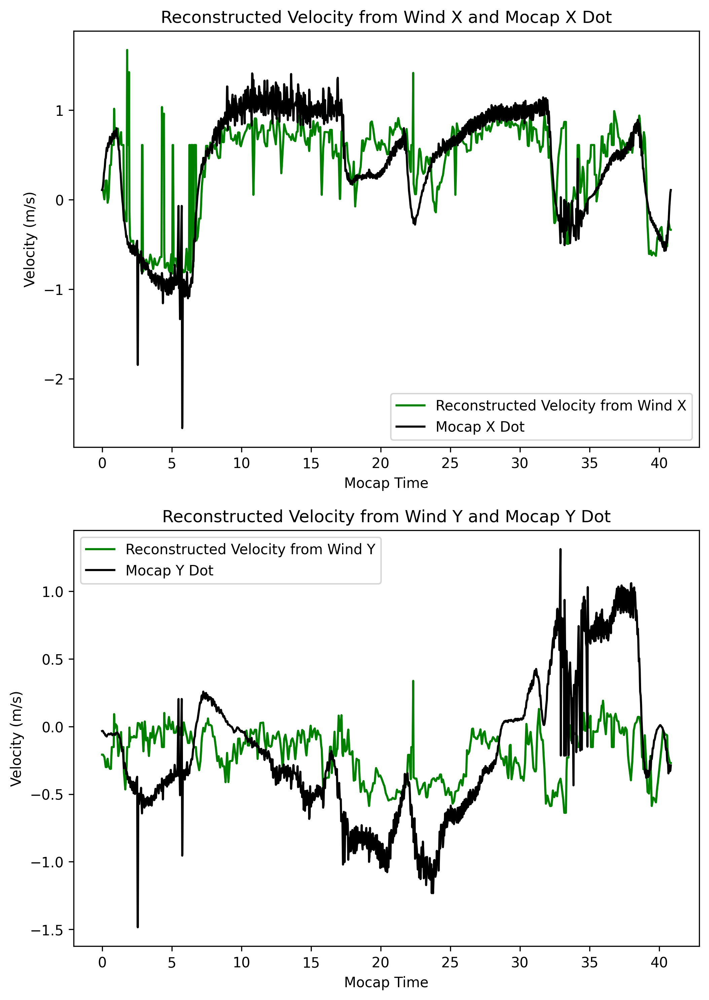

In [348]:
import pandas as pd
import statsmodels.formula.api as smf

# X-axis regression (full range)
df_wind_x = pd.DataFrame({
    'wind': np.array(wind_x_mocap_interp),
    'vel': mocap_bl_X_dot
})
model_wind_x = smf.ols('vel ~ wind', data=df_wind_x).fit()
wind_scalar_x = model_wind_x.params['wind']
wind_intercept_x = model_wind_x.params['Intercept']
vel_from_wind_x = wind_scalar_x * np.array(wind_x_mocap_interp) + wind_intercept_x
print(model_wind_x.summary())
print(f"Scalar X: {wind_scalar_x}")

# Y-axis regression (full range)
df_wind_y = pd.DataFrame({
    'wind': np.array(wind_y_mocap_interp),
    'vel': mocap_bl_Y_dot
})
model_wind_y = smf.ols('vel ~ wind', data=df_wind_y).fit()
wind_scalar_y = model_wind_y.params['wind']
wind_intercept_y = model_wind_y.params['Intercept']
vel_from_wind_y = wind_scalar_y * np.array(wind_y_mocap_interp) + wind_intercept_y
print(model_wind_y.summary())
print(f"Scalar Y: {wind_scalar_y}")

# Magnitude regression (full range)
df_wind_mag = pd.DataFrame({
    'wind': np.array(wind_ground_speed),
    'vel': mocap_ground_speed
})
model_wind_mag = smf.ols('vel ~ wind', data=df_wind_mag).fit()
wind_scalar_mag = model_wind_mag.params['wind']
wind_intercept_mag = model_wind_mag.params['Intercept']
vel_from_wind_mag = wind_scalar_mag * np.array(wind_ground_speed) + wind_intercept_mag
print(model_wind_mag.summary())
print(f"Scalar Mag: {wind_scalar_mag}")

# Plot the reconstructed velocity based on the wind data and the statsmodels
fig, ax = plt.subplots(2, 1, figsize=(8, 12), dpi=300)
# Plot X-axis
ax[0].plot(mocap_time_shifted, vel_from_wind_x, label="Reconstructed Velocity from Wind X", color='green')
ax[0].plot(mocap_time_shifted, mocap_bl_X_dot, label="Mocap X Dot", color='black')
ax[0].set_title('Reconstructed Velocity from Wind X and Mocap X Dot')
ax[0].set_xlabel('Mocap Time')
ax[0].set_ylabel('Velocity (m/s)')
ax[0].legend()
# Plot Y-axis
ax[1].plot(mocap_time_shifted, vel_from_wind_y, label="Reconstructed Velocity from Wind Y", color='green')
ax[1].plot(mocap_time_shifted, mocap_bl_Y_dot, label="Mocap Y Dot", color='black')
ax[1].set_title('Reconstructed Velocity from Wind Y and Mocap Y Dot')
ax[1].set_xlabel('Mocap Time')
ax[1].set_ylabel('Velocity (m/s)')
ax[1].legend()




# RC Out ~ PWM

In [349]:
data['mavros/rc/out']
# split the data in header "channels" into individual columns named PWM1, PWM2, PWM3, PWM4 (only take the first 4 channels) each colum should be a float not a string
rc_time = data['mavros/rc/out']['rosbagTimestamp']/1e9/2
rc_time_shifted = rc_time - rc_time[0]
rc_channels = data['mavros/rc/out']['channels']
rc_channels = rc_channels.str.split(',', expand=True)
# remove "[" from the first column
rc_channels[0] = rc_channels[0].str.replace('[','')
rc_channels = rc_channels.iloc[:, :4]
rc_channels = rc_channels.astype(float)
PX4_1 = rc_channels[0]
PX4_2 = rc_channels[1]
PX4_3 = rc_channels[2]
PX4_4 = rc_channels[3]



/tmp/ipykernel_3858216/2308055145.py:8: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.
  rc_channels[0] = rc_channels[0].str.replace('[','')


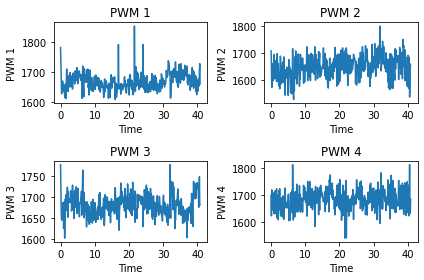

In [350]:
# pwm_1 = PX4_3
# pwm_2 = PX4_1
# pwm_3 = PX4_4
# pwm_4 = PX4_2

pwm_1 = PX4_1
pwm_2 = PX4_2
pwm_3 = PX4_3
pwm_4 = PX4_4
# 2x2 plot of the pwm data
plt.subplot(2, 2, 1)
plt.plot(rc_time_shifted, pwm_1)
plt.title('PWM 1')
plt.xlabel('Time')
plt.ylabel('PWM 1')

plt.subplot(2, 2, 2)
plt.plot(rc_time_shifted, pwm_2)
plt.title('PWM 2')
plt.xlabel('Time')
plt.ylabel('PWM 2')

plt.subplot(2, 2, 3)
plt.plot(rc_time_shifted, pwm_3)
plt.title('PWM 3')
plt.xlabel('Time')
plt.ylabel('PWM 3')

plt.subplot(2, 2, 4)
plt.plot(rc_time_shifted, pwm_4)
plt.title('PWM 4')
plt.xlabel('Time')
plt.ylabel('PWM 4')

plt.tight_layout()
plt.show()

# Get the final values fir all the measured data

## since Optic Flow is the fastes we will interpolate to that

### Mocap Final

In [351]:
X_TRUE = interpolate_data(mocap_time, mocap_X, optic_flow_camera_x_time)
X_DOT_G_TRUE = interpolate_data(mocap_time, mocap_X_dot, optic_flow_camera_x_time)
X_DOT_BL_TRUE = interpolate_data(mocap_time, mocap_bl_X_dot, optic_flow_camera_x_time)
Y_TRUE = interpolate_data(mocap_time, mocap_Y, optic_flow_camera_x_time)
Y_DOT_G_TRUE = interpolate_data(mocap_time, mocap_Y_dot, optic_flow_camera_x_time)
Y_DOT_BL_TRUE = interpolate_data(mocap_time, mocap_bl_Y_dot, optic_flow_camera_x_time)
Z_TRUE = interpolate_data(mocap_time, mocap_Z, optic_flow_camera_x_time)
Z_DOT_G_TRUE = interpolate_data(mocap_time, mocap_Z_dot, optic_flow_camera_x_time)
Z_DOT_BL_TRUE = interpolate_data(mocap_time, mocap_bl_Z_dot, optic_flow_camera_x_time)
Roll_TRUE = interpolate_data(mocap_time, mocap_Roll, optic_flow_camera_x_time)
Pitch_TRUE = interpolate_data(mocap_time, mocap_Pitch, optic_flow_camera_x_time)
Yaw_TRUE = interpolate_data(mocap_time, mocap_Yaw, optic_flow_camera_x_time)
OMEGA_X_TRUE = interpolate_data(mocap_time, mocap_Omega_x, optic_flow_camera_x_time)
OMEGA_Y_TRUE = interpolate_data(mocap_time, mocap_Omega_y, optic_flow_camera_x_time)
OMEGA_Z_TRUE = interpolate_data(mocap_time, mocap_Omega_z, optic_flow_camera_x_time)


### IMU Final

In [352]:
IMU_ROLL = interpolate_data(imu_time, imu_Roll, optic_flow_camera_x_time)
IMU_PITCH = interpolate_data(imu_time, imu_Pitch, optic_flow_camera_x_time)
IMU_YAW = interpolate_data(imu_time, imu_Yaw, optic_flow_camera_x_time)
IMU_ROLL_DOT = interpolate_data(imu_time, imu_Roll_dot, optic_flow_camera_x_time)
IMU_PITCH_DOT = interpolate_data(imu_time, imu_Pitch_dot, optic_flow_camera_x_time)
IMU_YAW_DOT = interpolate_data(imu_time, imu_Yaw_dot, optic_flow_camera_x_time)
IMU_OMEGA_X = interpolate_data(imu_time, imu_omega_x, optic_flow_camera_x_time)
IMU_OMEGA_Y = interpolate_data(imu_time, imu_omega_y, optic_flow_camera_x_time)
IMU_OMEGA_Z = interpolate_data(imu_time, imu_omega_z, optic_flow_camera_x_time)
IMU_ACC_BL_X = interpolate_data(imu_time, acc_x_body_level, optic_flow_camera_x_time)
IMU_ACC_BL_Y = interpolate_data(imu_time, acc_y_body_level, optic_flow_camera_x_time)
IMU_ACC_BL_Z = interpolate_data(imu_time, acc_z_body_level, optic_flow_camera_x_time)
print(np.shape(acc_z_body_level))

(2042,)


### Wind Sensor Final

In [353]:
Wind_BL_X = interpolate_data(mocap_time, np.ravel(np.array(wind_body_level_x)), optic_flow_camera_x_time)
Wind_BL_Y = interpolate_data(mocap_time, np.ravel(np.array(wind_body_level_y)), optic_flow_camera_x_time)
Wind_BL_X_f = 1*wind_scalar_x
Wind_BL_X_offset = wind_intercept_x
Wind_BL_Y_f = 1*wind_scalar_y
Wind_BL_Y_offset = wind_intercept_y
Wind_BL_X_Scaled = np.multiply(Wind_BL_X, Wind_BL_X_f) + Wind_BL_X_offset
Wind_BL_Y_Scaled = np.multiply(Wind_BL_Y, Wind_BL_Y_f) + Wind_BL_Y_offset
Wind_BL_A = np.sqrt(np.square(Wind_BL_X_Scaled) + np.square(Wind_BL_Y_Scaled))
Wind_BL_Gamma = np.arctan2(Wind_BL_Y_Scaled, Wind_BL_X_Scaled)


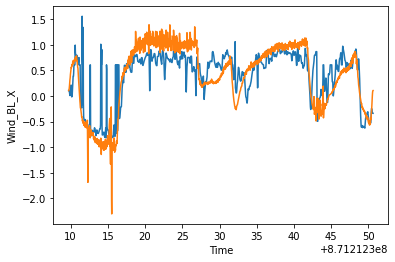

<function matplotlib.pyplot.show(*args, **kw)>

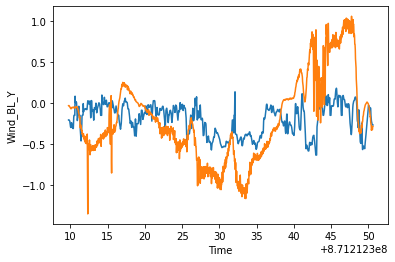

In [354]:
plt.plot(optic_flow_camera_x_time, Wind_BL_X_Scaled,label='Wind_X_f')
plt.plot(optic_flow_camera_x_time, X_DOT_BL_TRUE,label='X_DOT_BL_TRUE')
plt.xlabel('Time')
plt.ylabel('Wind_BL_X')
plt.show()

plt.plot(optic_flow_camera_x_time, Wind_BL_Y_Scaled,label='Wind_Y_f')
plt.plot(optic_flow_camera_x_time, Y_DOT_BL_TRUE,label='Y_DOT_BL_TRUE')
plt.xlabel('Time')
plt.ylabel('Wind_BL_Y')
plt.show

### Optic Flow Final

In [355]:
OF_BL_X, OF_BL_Y = rotate_optic_flow(optic_flow_camera_x, optic_flow_camera_y)
OF_BL_X_f = optic_flow_scalar_X.copy()
print(OF_BL_X_f)
OF_BL_X_offset = optic_flow_intercept_X.copy()
print(OF_BL_X_offset)
OF_BL_Y_f = optic_flow_scalar_Y
OF_BL_Y_offset = optic_flow_intercept_Y
OF_BL_X_Scaled = np.multiply(OF_BL_X,OF_BL_X_f) + OF_BL_X_offset
OF_BL_Y_Scaled = np.multiply(OF_BL_Y,OF_BL_Y_f) + OF_BL_Y_offset

0.0007892997409164298
0.044582777621349504


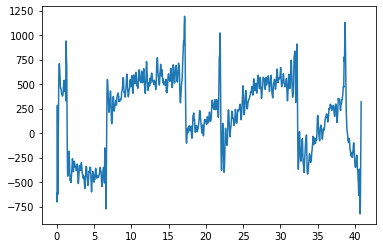

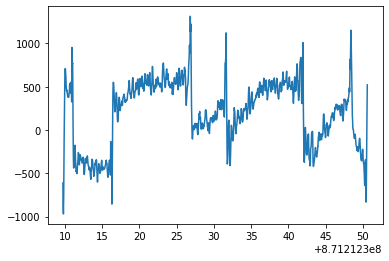

In [356]:
plt.plot(mocap_time_shifted, OFX_rot,label='vel_from_optic_flow_X')
plt.show()

plt.plot(optic_flow_camera_x_time, OF_BL_X,label='OF_BL_X_Scaled')

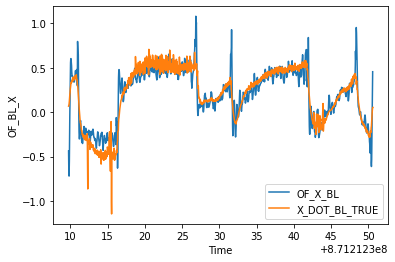

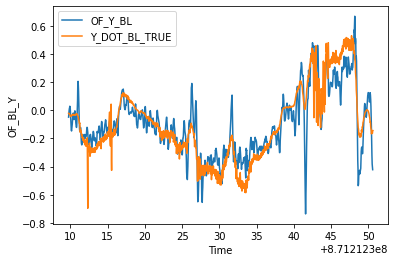

Standard deviation of OF_BL_X_Scaled - np.divide(X_DOT_BL_TRUE,Z_TRUE): 0.13941004053829548
Standard deviation of OF_BL_Y_Scaled - np.divide(Y_DOT_BL_TRUE,Z_TRUE): 0.12851952371658698


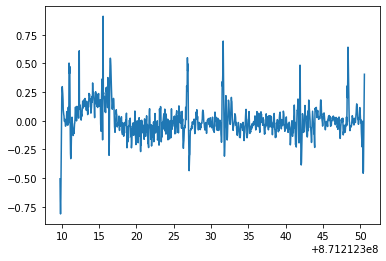

In [357]:
plt.plot(optic_flow_camera_x_time, OF_BL_X_Scaled,label='OF_X_BL')
plt.plot(optic_flow_camera_x_time, np.divide(X_DOT_BL_TRUE,Z_TRUE),label='X_DOT_BL_TRUE')
plt.xlabel('Time')
plt.ylabel('OF_BL_X')
plt.legend()
plt.show()

plt.plot(optic_flow_camera_x_time, OF_BL_Y_Scaled,label='OF_Y_BL')
plt.plot(optic_flow_camera_x_time, np.divide(Y_DOT_BL_TRUE,Z_TRUE),label='Y_DOT_BL_TRUE')
plt.xlabel('Time')
plt.ylabel('OF_BL_Y')
plt.legend()
plt.show()

# calculate the standard deviation of OF_BL_X_Scaled -np.divide(X_DOT_BL_TRUE,Z_TRUE) and print it
std_dev_x = np.std(OF_BL_X_Scaled-np.divide(X_DOT_BL_TRUE,Z_TRUE))
print('Standard deviation of OF_BL_X_Scaled - np.divide(X_DOT_BL_TRUE,Z_TRUE):', std_dev_x)
std_dev_y = np.std(OF_BL_Y_Scaled-np.divide(Y_DOT_BL_TRUE,Z_TRUE))
print('Standard deviation of OF_BL_Y_Scaled - np.divide(Y_DOT_BL_TRUE,Z_TRUE):', std_dev_y)

plt.plot(optic_flow_camera_x_time, OF_BL_X_Scaled-np.divide(X_DOT_BL_TRUE,Z_TRUE),label='OF_BL_X-X_DOT_BL')

### PWM Final

In [358]:
PWM_1 = (interpolate_data(rc_time, pwm_1, optic_flow_camera_x_time)-1150)/1000*9.81
PWM_2 = (interpolate_data(rc_time, pwm_2, optic_flow_camera_x_time)-1150)/1000*9.81
PWM_3 = (interpolate_data(rc_time, pwm_3, optic_flow_camera_x_time)-1150)/1000*9.81
PWM_4 = (interpolate_data(rc_time, pwm_4, optic_flow_camera_x_time)-1150)/1000*9.81

In [359]:
print(1150/1000*9.81)

11.2815


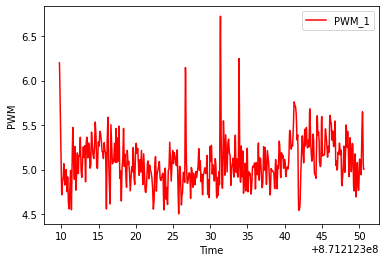

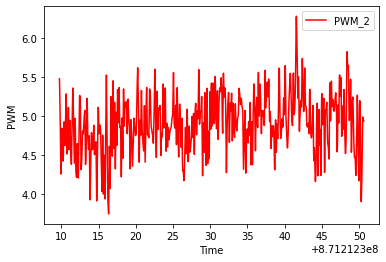

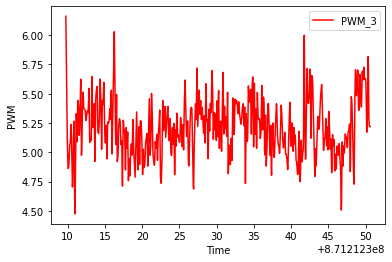

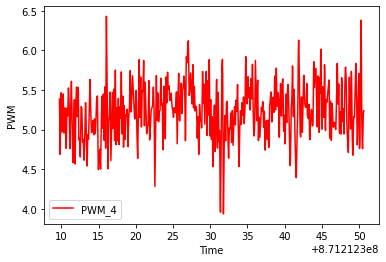

In [416]:
plt.plot(optic_flow_camera_x_time, PWM_1,label='PWM_1',color='red')
plt.xlabel('Time')
plt.ylabel('PWM')
plt.legend()
plt.show()
plt.plot(optic_flow_camera_x_time, PWM_2,label='PWM_2',color='red')
plt.xlabel('Time')
plt.ylabel('PWM')
plt.legend()
plt.show()
plt.plot(optic_flow_camera_x_time, PWM_3,label='PWM_3',color='red')
plt.xlabel('Time')
plt.ylabel('PWM')
plt.legend()
plt.show()
plt.plot(optic_flow_camera_x_time, PWM_4,label='PWM_4',color='red')
plt.xlabel('Time')
plt.ylabel('PWM')
plt.legend()
plt.show()

### Time

In [361]:
TIME_BL = optic_flow_camera_x_time-optic_flow_camera_x_time[0]
DT_BL=np.round(TIME_BL[1]-TIME_BL[0],2)
print(DT_BL)

0.03


# Real Drone Parameters

In [362]:
########################################################################################
#################### Real Drone Parameters #############################################
########################################################################################
Real_m   = 0.086  # [kg] mass
Real_M   = 2.529  # [kg] mass
Real_mM  = Real_M+4*Real_m  # [kg] mass (total=2.529+4*0.086=2.897)
Real_l   = 0.2032 # [m] length
Real_r   = 0.1778 # [m] average body radius
# Real_Ix  = (2*(Real_M*Real_r**2)/5 + 2*Real_m*Real_l**2)*4 # [kg*m^2] moment of inertia
Real_Ix  = .491 # [kg*m^2] moment of inertia
# Real_Iy  = (2*(Real_M*Real_r**2)/5 + 2*Real_m*Real_l**2)*4 # [kg*m^2] moment of inertia
Real_Iy  = .387 # [kg*m^2] moment of inertia
# Real_Iz  = (2*(Real_M*Real_r**2)/5 + 4*Real_m*Real_l**2)*4 # [kg*m^2] moment of inertia
Real_Iz  = .667 # [kg*m^2] moment of inertia
Real_Jr  = (2*(Real_M*Real_r**2)/5)*4 # [kg*m^2] polar moment of inertia ### FAKE VALUE
Real_b   = 1.8311 # thrust coefficient
Real_d   = 0.01 # drag coefficient
Real_Dl  = 0.01 # drag coefficient from ground speed plus air speed
Real_Dr  = 0.01 # drag coefficient from rotation speed
Real_C   = 0.1 # thrust coefficient

print('Real Drone Parameters:')
print('Real_m:       ', Real_m)
print('Real_M:       ', Real_M)
print('Real_M_total: ', Real_mM)
print('Real_l:       ', Real_l)
print('Real_r:       ', Real_r)
print('Real_Ix:      ', Real_Ix)
print('Real_Iy:      ', Real_Iy)
print('Real_Iz:      ', Real_Iz)
print('Real_Jr:      ', Real_Jr)
print('Real_b:       ', Real_b)
print('Real_d:       ', Real_d)
print('Real_Dl:      ', Real_Dl)
print('Real_Dr:      ', Real_Dr)


# params = [m,l,Ix,Iy,Iz,Jr,b,d,Dl,Dr]
params = [Real_mM,Real_l,Real_Ix,Real_Iy,Real_Iz,Real_Jr,Real_b,Real_d,Real_Dl,Real_Dr]
g  = 9.81 # m/s^2

Real Drone Parameters:
Real_m:        0.086
Real_M:        2.529
Real_M_total:  2.8729999999999998
Real_l:        0.2032
Real_r:        0.1778
Real_Ix:       0.491
Real_Iy:       0.387
Real_Iz:       0.667
Real_Jr:       0.127918195776
Real_b:        1.8311
Real_d:        0.01
Real_Dl:       0.01
Real_Dr:       0.01


# Cluster Measurments and Inputs

In [402]:
P_cluster = np.array(np.vstack([X_TRUE,Y_TRUE,Z_TRUE]))
V_BL_cluster = np.array(np.vstack([X_DOT_BL_TRUE,Y_DOT_BL_TRUE,Z_DOT_BL_TRUE]))
V_G_cluster = np.array(np.vstack([X_DOT_G_TRUE,Y_DOT_G_TRUE,Z_DOT_G_TRUE]))
Attitude_cluster = np.array(np.vstack([Roll_TRUE,Pitch_TRUE,Yaw_TRUE]))
Omega_cluster = np.array(np.vstack([IMU_OMEGA_X,IMU_OMEGA_Y,IMU_OMEGA_Z]))
Acc_BL_cluster = np.array(np.vstack([IMU_ACC_BL_X,IMU_ACC_BL_Y,IMU_ACC_BL_Z]))
IMU_cluster = np.array(np.vstack([IMU_ROLL, IMU_PITCH, IMU_YAW, IMU_OMEGA_X, IMU_OMEGA_Y,IMU_OMEGA_Z,IMU_ACC_BL_X,IMU_ACC_BL_Y,IMU_ACC_BL_Z]))
Wind_BL_XY_cluster = np.array(np.vstack([Wind_BL_X_Scaled,Wind_BL_Y_Scaled]))
Wind_BL_cluster = np.array(np.vstack([Wind_BL_X_Scaled,Wind_BL_Y_Scaled]))
OF_BL_cluster = np.array(np.vstack([OF_BL_X_Scaled,OF_BL_Y_Scaled]))
Y_SWEEP='no_OF_wind'
if Y_SWEEP == 'all':
    Y_BL = np.vstack((P_cluster,V_BL_cluster,Attitude_cluster,Omega_cluster,Acc_BL_cluster,OF_BL_cluster,Wind_BL_XY_cluster))
elif Y_SWEEP == 'real':
    Y_BL = np.vstack((IMU_cluster,OF_BL_cluster,Wind_BL_cluster))
elif Y_SWEEP == 'no_wind':
    Y_BL = np.vstack((IMU_cluster,OF_BL_cluster))
elif Y_SWEEP == 'no_OF':
    Y_BL = np.vstack((IMU_cluster,Wind_BL_cluster))
elif Y_SWEEP == 'no_OF_wind':
    Y_BL = np.vstack((IMU_cluster))


print(np.shape(Y_BL))

U_BL = np.array(np.vstack([PWM_1,PWM_2,PWM_3,PWM_4]))

print(np.shape(U_BL))


(9, 1226)
(4, 1226)


# Get the initial conditions

In [403]:
# X0_BL = np.atleast_2d(np.vstack((X_TRUE[0], # X
#                                  Y_TRUE[0], # Y
#                                  Z_TRUE[0], # Z
#                                  X_DOT_BL_TRUE[0], # X_DOT
#                                  Y_DOT_BL_TRUE[0], # Y_DOT
#                                  Z_DOT_BL_TRUE[0], # Z_DOT
#                                  IMU_ROLL[0], # ROLL
#                                  IMU_PITCH[0], # PITCH
#                                  IMU_YAW[0], # YAW
#                                  IMU_OMEGA_X[0], # OMEGA_X
#                                  IMU_OMEGA_Y[0], # OMEGA_Y
#                                  IMU_OMEGA_Z[0], # OMEGA_Z
#                                  0, # w
#                                  0, # zeta
#                                  Real_mM, # m
#                                  Real_Ix, # Ix
#                                  Real_Iy, # Iy
#                                  Real_Iz, # Iz
#                                  Real_C # C
#                                  )))

# X0_BL = np.atleast_2d(np.vstack((X_TRUE[0], # X
#                                  Y_TRUE[0], # Y
#                                  Z_TRUE[0], # 1/Z = mu
#                                  X_DOT_BL_TRUE[0], # X_DOT
#                                  Y_DOT_BL_TRUE[0], # Y_DOT
#                                  Z_DOT_BL_TRUE[0], # Z_DOT
#                                  IMU_ROLL[0], # ROLL
#                                  IMU_PITCH[0], # PITCH
#                                  IMU_YAW[0], # YAW
#                                  IMU_OMEGA_X[0], # OMEGA_X
#                                  IMU_OMEGA_Y[0], # OMEGA_Y
#                                  IMU_OMEGA_Z[0], # OMEGA_Z
#                                  0, # w
#                                  0 # zeta
#                                  )))

X0_BL = np.atleast_2d(np.vstack((X_TRUE[0], # X
                                 Y_TRUE[0], # Y
                                 Z_TRUE[0], # 1/Z = mu
                                 X_DOT_BL_TRUE[0], # X_DOT
                                 Y_DOT_BL_TRUE[0], # Y_DOT
                                 Z_DOT_BL_TRUE[0], # Z_DOT
                                 IMU_ROLL[0], # ROLL
                                 IMU_PITCH[0], # PITCH
                                 IMU_YAW[0], # YAW
                                 IMU_OMEGA_X[0], # OMEGA_X
                                 IMU_OMEGA_Y[0], # OMEGA_Y
                                 IMU_OMEGA_Z[0], # OMEGA_Z
                                 0, # wx
                                 0 # wy
                                 )))

print(np.shape(X0_BL))

(14, 1)


# System Covariance

In [404]:
# Q_BL = np.diag(np.array([1.0e-2, # x
#                          1.0e-2, # y
#                          1.0e-20, # z
#                          1.0e-2, # x_dot_body_level
#                          1.0e-2, # y_dot_body_level
#                          1.0e-20, # z_dot_body_level
#                          1.0e-2, # roll (phi)
#                          1.0e-2, # pitch (theta)
#                          1.0e-2, # yaw (psi)
#                          1.0e-1, # omega_x
#                          1.0e-1, # omega_y
#                          1.0e-1, # omega_z
#                          1.0e-10, # wind_magnitude (w)
#                          1.0e-10, # wind_direction (zeta)
#                          1.0e-20, # m
#                          1.0e-20, # Ix
#                          1.0e-20, # Iy
#                          1.0e-20, # Iz
#                          1.0e-20])) # C

# Q_BL = np.diag(np.array([1.0e-2, # x
#                          1.0e-2, # y
#                          1.0e-20, # z
#                          1.0e-2, # x_dot_body_level
#                          1.0e-2, # y_dot_body_level
#                          1.0e-20, # z_dot_body_level
#                          1.0e-2, # roll (phi)
#                          1.0e-2, # pitch (theta)
#                          1.0e-2, # yaw (psi)
#                          1.0e3, # omega_x
#                          1.0e3, # omega_y
#                          1.0e3, # omega_z
#                          1.0e-10, # wind_magnitude (w)
#                          1.0e-10 # wind_direction (zeta)
#                          ]))

Q_BL = np.diag(np.array([1.0e-2, # x
                         1.0e-2, # y
                         1.0e-20, # z
                         1.0e-5, # x_dot_body_level
                         1.0e-5, # y_dot_body_level
                         1.0e-20, # z_dot_body_level
                         1.0e-2, # roll (phi)
                         1.0e-2, # pitch (theta)
                         1.0e-2, # yaw (psi)
                         1.0e3, # omega_x
                         1.0e3, # omega_y
                         1.0e3, # omega_z
                         1.0e-10, # wind_x (wx)
                         1.0e-10 # wind_y (wy)
                         ]))

print(np.shape(Q_BL))

(14, 14)


# Error covariance

In [405]:
# get standard deviation of the data and make plus minus 3 sigma bounds
X_TRUE_STD = np.std(X_TRUE)
X_TRUE_PLUS = X_TRUE + 3*X_TRUE_STD
X_TRUE_MINUS = X_TRUE - 3*X_TRUE_STD
print("X_TRUE_STD: ", X_TRUE_STD)
Y_TRUE_STD = np.std(Y_TRUE)
Y_TRUE_PLUS = Y_TRUE + 3*Y_TRUE_STD
Y_TRUE_MINUS = Y_TRUE - 3*Y_TRUE_STD
print("Y_TRUE_STD: ", Y_TRUE_STD)
Z_TRUE_STD = np.std(Z_TRUE)
Z_TRUE_PLUS = Z_TRUE + 3*Z_TRUE_STD
Z_TRUE_MINUS = Z_TRUE - 3*Z_TRUE_STD
print("Z_TRUE_STD: ", Z_TRUE_STD)
X_DOT_BL_TRUE_STD = np.std(X_DOT_BL_TRUE)
X_DOT_BL_TRUE_PLUS = X_DOT_BL_TRUE + 3*X_DOT_BL_TRUE_STD
X_DOT_BL_TRUE_MINUS = X_DOT_BL_TRUE - 3*X_DOT_BL_TRUE_STD
print("X_DOT_BL_TRUE_STD: ", X_DOT_BL_TRUE_STD)
Y_DOT_BL_TRUE_STD = np.std(Y_DOT_BL_TRUE)
Y_DOT_BL_TRUE_PLUS = Y_DOT_BL_TRUE + 3*Y_DOT_BL_TRUE_STD
Y_DOT_BL_TRUE_MINUS = Y_DOT_BL_TRUE - 3*Y_DOT_BL_TRUE_STD
print("Y_DOT_BL_TRUE_STD: ", Y_DOT_BL_TRUE_STD)
Z_DOT_BL_TRUE_STD = np.std(Z_DOT_BL_TRUE)
Z_DOT_BL_TRUE_PLUS = Z_DOT_BL_TRUE + 3*Z_DOT_BL_TRUE_STD
Z_DOT_BL_TRUE_MINUS = Z_DOT_BL_TRUE - 3*Z_DOT_BL_TRUE_STD
print("Z_DOT_BL_TRUE_STD: ", Z_DOT_BL_TRUE_STD)
Roll_TRUE_STD = np.std(Roll_TRUE)
Roll_TRUE_PLUS = Roll_TRUE + 3*Roll_TRUE_STD
Roll_TRUE_MINUS = Roll_TRUE - 3*Roll_TRUE_STD
print("Roll_TRUE_STD: ", Roll_TRUE_STD)
Pitch_TRUE_STD = np.std(Pitch_TRUE)
Pitch_TRUE_PLUS = Pitch_TRUE + 3*Pitch_TRUE_STD
Pitch_TRUE_MINUS = Pitch_TRUE - 3*Pitch_TRUE_STD
print("Pitch_TRUE_STD: ", Pitch_TRUE_STD)
Yaw_TRUE_STD = np.std(Yaw_TRUE)
Yaw_TRUE_PLUS = Yaw_TRUE + 3*Yaw_TRUE_STD
Yaw_TRUE_MINUS = Yaw_TRUE - 3*Yaw_TRUE_STD
print("Yaw_TRUE_STD: ", Yaw_TRUE_STD)
IMU_OMEGA_X_STD = np.std(IMU_OMEGA_X)
IMU_OMEGA_X_PLUS = IMU_OMEGA_X + 3*IMU_OMEGA_X_STD
IMU_OMEGA_X_MINUS = IMU_OMEGA_X - 3*IMU_OMEGA_X_STD
print("IMU_OMEGA_X_STD: ", IMU_OMEGA_X_STD)
IMU_OMEGA_Y_STD = np.std(IMU_OMEGA_Y)
IMU_OMEGA_Y_PLUS = IMU_OMEGA_Y + 3*IMU_OMEGA_Y_STD
IMU_OMEGA_Y_MINUS = IMU_OMEGA_Y - 3*IMU_OMEGA_Y_STD
print("IMU_OMEGA_Y_STD: ", IMU_OMEGA_Y_STD)
IMU_OMEGA_Z_STD = np.std(IMU_OMEGA_Z)
IMU_OMEGA_Z_PLUS = IMU_OMEGA_Z + 3*IMU_OMEGA_Z_STD
IMU_OMEGA_Z_MINUS = IMU_OMEGA_Z - 3*IMU_OMEGA_Z_STD
print("IMU_OMEGA_Z_STD: ", IMU_OMEGA_Z_STD)
IMU_ACC_BL_X_STD = np.std(IMU_ACC_BL_X)
IMU_ACC_BL_X_PLUS = IMU_ACC_BL_X + 3*IMU_ACC_BL_X_STD
IMU_ACC_BL_X_MINUS = IMU_ACC_BL_X - 3*IMU_ACC_BL_X_STD
print("IMU_ACC_BL_X_STD: ", IMU_ACC_BL_X_STD)
IMU_ACC_BL_Y_STD = np.std(IMU_ACC_BL_Y)
IMU_ACC_BL_Y_PLUS = IMU_ACC_BL_Y + 3*IMU_ACC_BL_Y_STD
IMU_ACC_BL_Y_MINUS = IMU_ACC_BL_Y - 3*IMU_ACC_BL_Y_STD
print("IMU_ACC_BL_Y_STD: ", IMU_ACC_BL_Y_STD)
IMU_ACC_BL_Z_STD = np.std(IMU_ACC_BL_Z)
IMU_ACC_BL_Z_PLUS = IMU_ACC_BL_Z + 3*IMU_ACC_BL_Z_STD
IMU_ACC_BL_Z_MINUS = IMU_ACC_BL_Z - 3*IMU_ACC_BL_Z_STD
print("IMU_ACC_BL_Z_STD: ", IMU_ACC_BL_Z_STD)
Wind_BL_X_Scaled_STD = np.std(Wind_BL_X_Scaled)
Wind_BL_X_Scaled_PLUS = Wind_BL_X_Scaled + 3*Wind_BL_X_Scaled_STD
Wind_BL_X_Scaled_MINUS = Wind_BL_X_Scaled - 3*Wind_BL_X_Scaled_STD
print("Wind_BL_X_Scaled_STD: ", Wind_BL_X_Scaled_STD)
Wind_BL_Y_Scaled_STD = np.std(Wind_BL_Y_Scaled)
Wind_BL_Y_Scaled_PLUS = Wind_BL_Y_Scaled + 3*Wind_BL_Y_Scaled_STD
Wind_BL_Y_Scaled_MINUS = Wind_BL_Y_Scaled - 3*Wind_BL_Y_Scaled_STD
print("Wind_BL_Y_Scaled_STD: ", Wind_BL_Y_Scaled_STD)
Wind_BL_A_STD = np.std(Wind_BL_A)
Wind_BL_A_PLUS = Wind_BL_A + 3*Wind_BL_A_STD
Wind_BL_A_MINUS = Wind_BL_A - 3*Wind_BL_A_STD
print("Wind_BL_A_STD: ", Wind_BL_A_STD)
Wind_BL_Gamma_STD = np.std(Wind_BL_Gamma)
Wind_BL_Gamma_PLUS = Wind_BL_Gamma + 3*Wind_BL_Gamma_STD
Wind_BL_Gamma_MINUS = Wind_BL_Gamma - 3*Wind_BL_Gamma_STD
print("Wind_BL_Gamma_STD: ", Wind_BL_Gamma_STD)
OF_BL_X_Scaled_STD = np.std(OF_BL_X_Scaled)
OF_BL_X_Scaled_PLUS = OF_BL_X_Scaled + 3*OF_BL_X_Scaled_STD
OF_BL_X_Scaled_MINUS = OF_BL_X_Scaled - 3*OF_BL_X_Scaled_STD
print("OF_BL_X_Scaled_STD: ", OF_BL_X_Scaled_STD)
OF_BL_Y_Scaled_STD = np.std(OF_BL_Y_Scaled)
OF_BL_Y_Scaled_PLUS = OF_BL_Y_Scaled + 3*OF_BL_Y_Scaled_STD
OF_BL_Y_Scaled_MINUS = OF_BL_Y_Scaled - 3*OF_BL_Y_Scaled_STD
print("OF_BL_Y_Scaled_STD: ", OF_BL_Y_Scaled_STD)
# plt.plot(TIME_BL, IMU_OMEGA_X,label='IMU_OMEGA_X')
# plt.plot(TIME_BL, IMU_OMEGA_X_PLUS,label='IMU_OMEGA_X_PLUS')
# plt.plot(TIME_BL, IMU_OMEGA_X_MINUS,label='IMU_OMEGA_X_MINUS')

# plt.plot(TIME_BL, Wind_BL_X_Scaled-X_DOT_BL_TRUE,label='Wind_noise')
print("windX noise:",np.std(Wind_BL_X_Scaled-X_DOT_BL_TRUE))
print("windY noise:",np.std(Wind_BL_Y_Scaled-Y_DOT_BL_TRUE))
print("OFX noise:",np.std(np.multiply(OF_BL_X_Scaled,Z_TRUE)-X_DOT_BL_TRUE))
print("OFY noise:",np.std(np.multiply(OF_BL_Y_Scaled,Z_TRUE)-Y_DOT_BL_TRUE))


X_TRUE_STD:  2.9910394720669173
Y_TRUE_STD:  1.2037909947596295
Z_TRUE_STD:  0.051713563785022516
X_DOT_BL_TRUE_STD:  0.6360845652343509
Y_DOT_BL_TRUE_STD:  0.5132415353265034
Z_DOT_BL_TRUE_STD:  0.03008730668225858
Roll_TRUE_STD:  2.491277681659999
Pitch_TRUE_STD:  3.8747523563196555
Yaw_TRUE_STD:  91.69252601706765
IMU_OMEGA_X_STD:  0.35070171962098967
IMU_OMEGA_Y_STD:  0.2944563832609182
IMU_OMEGA_Z_STD:  0.3056826897375677
IMU_ACC_BL_X_STD:  3.5181249791792264
IMU_ACC_BL_Y_STD:  2.658848932722316
IMU_ACC_BL_Z_STD:  8.12500295123411
Wind_BL_X_Scaled_STD:  0.4972633009992243
Wind_BL_Y_Scaled_STD:  0.1817908095037748
Wind_BL_A_STD:  0.20262268806643619
Wind_BL_Gamma_STD:  1.1215226159930316
OF_BL_X_Scaled_STD:  0.2936338298975086
OF_BL_Y_Scaled_STD:  0.223789174840799
windX noise: 0.38880431924641606
windY noise: 0.47872819888054574
OFX noise: 0.27222068163660695
OFY noise: 0.25488453040933656


In [406]:
P_V_cluster = np.vstack(np.array(([0.02,0.02,0.02])))
V_V_BL_cluster = np.vstack(np.array(([0.02,0.02,0.02])))
V_V_G_cluster = np.vstack(np.array(([0.02,0.02,0.02])))
Attitude_V_cluster = np.vstack(np.array(([0.02,0.02,0.02])))
Omega_V_cluster = np.vstack(np.array(([0.2,0.2,0.1])))
Acc_V_BL_cluster = np.vstack(np.array(([2,2,2])))
IMU_V_cluster = np.vstack(np.array(([0.0001, 0.0001, 0.0001, 0.2, 0.2, 0.2, 2, 2, 2])))
Wind_V_BL_XY_cluster = np.vstack(np.array(([0.2,0.4])))
Wind_V_BL_cluster = np.vstack(np.array(([0.2,0.2])))
# Wind_V_BL_cluster = np.vstack(np.array(([1e10,1e10])))
OF_V_BL_cluster = np.vstack(np.array(([0.09,0.09])))
# OF_V_BL_cluster = np.vstack(np.array(([1e10,1e10])))

# use the y sweep flag to determine which noise values to use
if Y_SWEEP == 'all':
    P_V = np.vstack((P_V_cluster,V_V_BL_cluster,Attitude_V_cluster,Omega_V_cluster,Acc_V_BL_cluster,OF_V_BL_cluster,Wind_V_BL_XY_cluster))
elif Y_SWEEP == 'real':
    V_BL = np.vstack([IMU_V_cluster,OF_V_BL_cluster,Wind_V_BL_cluster])
elif Y_SWEEP == 'no_wind':
    V_BL = np.vstack([IMU_V_cluster,OF_V_BL_cluster])
elif Y_SWEEP == 'no_OF':
    V_BL = np.vstack([IMU_V_cluster,Wind_V_BL_cluster])
elif Y_SWEEP == 'no_OF_wind':
    V_BL = np.vstack([IMU_V_cluster])

R_BL = np.power(np.diag(V_BL.flatten()),2)

print(np.shape(R_BL))

(9, 9)


# Initial estimate covariance

In [407]:
# P0_BL = np.diag(np.array([1e-2, # x
#                        1e-2, # y
#                        1e-2, # z
#                        1e-2, # v_x
#                        1e-2, # v_y
#                        1e-2, # v_z
#                        1e-2, # phi
#                        1e-2, # theta
#                        1e-2, # psi
#                        1e-2, # omega_x
#                        1e-2, # omega_y
#                        1e-2, # omega_z
#                        1e-2, # w
#                        1e-2, # zeta
#                        1e-2, # m
#                        1e-2, # I_x
#                        1e-2, # I_y
#                        1e-2, # I_z
#                        1e-2])) # C

# P0_BL = np.diag(np.array([1e-2, # x
#                        1e-2, # y
#                        1e-2, # z
#                        1e-2, # v_x
#                        1e-2, # v_y
#                        1e-2, # v_z
#                        1e-2, # phi
#                        1e-2, # theta
#                        1e-2, # psi
#                        1e-2, # omega_x
#                        1e-2, # omega_y
#                        1e-2, # omega_z
#                        1e-2, # w
#                        1e-2 # zeta
#                        ]))

P0_BL = np.diag(np.array([1e-2, # x
                       1e-2, # y
                       1e-2, # z
                       1e-2, # v_x
                       1e-2, # v_y
                       1e-2, # v_z
                       1e-2, # phi
                       1e-2, # theta
                       1e-2, # psi
                       1e-2, # omega_x
                       1e-2, # omega_y
                       1e-2, # omega_z
                       1e-2, # wx
                       1e-2 # wy
                       ]))

print(np.shape(P0_BL))

(14, 14)


# check sizes

In [408]:
# check that all inputs are a two-dimensional array
print('Ynoisy:',Y_BL.shape)
print('x0:',X0_BL.shape)
print('U:',U_BL.shape)
print('Q:',Q_BL.shape)
print('R:',R_BL.shape)
print('P0:',P0_BL.shape)

if Y_BL.shape[0] != R_BL.shape[0]:
    raise ValueError("Y_BL and R_BL must have the same number of rows")
elif Y_BL.shape[0] != R_BL.shape[1]:
    raise ValueError("Y_BL and R_BL must have the same number of columns")
elif X0_BL.shape[0] != P0_BL.shape[0]:
    raise ValueError("X0_BL and P0_BL must have the same number of rows")
elif X0_BL.shape[0] != P0_BL.shape[1]:
    raise ValueError("X0_BL and P0_BL must have the same number of columns")
elif X0_BL.shape[0] != Q_BL.shape[0]:
    raise ValueError("X0_BL and Q_BL must have the same number of rows")
elif X0_BL.shape[0] != Q_BL.shape[1]:
    raise ValueError("X0_BL and Q_BL must have the same number of columns")
else:
    print("All inputs are the right shape")

Ynoisy: (9, 1226)
x0: (14, 1)
U: (4, 1226)
Q: (14, 14)
R: (9, 9)
P0: (14, 14)
All inputs are the right shape


In [409]:
# drone_model = DroneModel()
# f_c=drone_model.f_c

# def outer(func):
#     def wrapper(*args, **kwargs):
#         global DT_BL
#         args = list(args) + [DT_BL]
#         value = func(*args)
#         return value
#     return wrapper

# f_c = outer(drone_model.f_c)

drone_model = DroneModel()
f_c=drone_model.f_c_car

def outer(func):
    def wrapper(*args, **kwargs):
        global DT_BL
        args = list(args) + [DT_BL]
        value = func(*args)
        return value
    return wrapper

f_c = outer(drone_model.f_c_car)


# drone_model = DroneModel()
# f_c=drone_model.f_c_small

# def outer(func):
#     def wrapper(*args, **kwargs):
#         global DT_BL
#         args = list(args) + [DT_BL]
#         value = func(*args)
#         return value
#     return wrapper

# f_c = outer(drone_model.f_c_small)

# drone_model = DroneModel()
# f_c=drone_model.f_c_mu

# def outer(func):
#     def wrapper(*args, **kwargs):
#         global DT_BL
#         args = list(args) + [DT_BL]
#         value = func(*args)
#         return value
#     return wrapper

# f_c = outer(drone_model.f_c_mu)

In [410]:
# h_c=drone_model.h_c
h_c=drone_model.h_c_car
# h_c=drone_model.h_c_small
# h_c=drone_model.h_c_mu

In [411]:
np.diag(R_BL)

array([1.e-08, 1.e-08, 1.e-08, 4.e-02, 4.e-02, 4.e-02, 4.e+00, 4.e+00,
       4.e+00])

In [412]:
xhat_BL, P_BL, s_BL = EKF(Y_BL, X0_BL, f_c, h_c, Q_BL, R_BL, U_BL, P0_BL)

In [413]:
x_hat_BL = xhat_BL[0,:]  # x estimate
y_hat_BL = xhat_BL[1,:]  # y estimate
z_hat_BL = xhat_BL[2,:]  # z estimate
v_x_hat_BL = xhat_BL[3,:]  # v_x estimate
v_y_hat_BL = xhat_BL[4,:]  # v_y estimate
v_z_hat_BL = xhat_BL[5,:]  # v_z estimate
phi_hat_BL = xhat_BL[6,:]  # phi estimate
theta_hat_BL = xhat_BL[7,:]  # theta estimate
psi_hat_BL = xhat_BL[8,:]  # psi estimate
omega_x_hat_BL = xhat_BL[9,:]  # omega_x estimate
omega_y_hat_BL = xhat_BL[10,:]  # omega_y estimate
omega_z_hat_BL = xhat_BL[11,:]  # omega_z estimate
# w_hat_BL = xhat_BL[12,:]  # w estimate
# zeta_hat_BL = xhat_BL[13,:]  # zeta estimate
wx_hat_BL = xhat_BL[12,:]  # wx estimate
wy_hat_BL = xhat_BL[13,:]  # wy estimate

# m_hat_BL = xhat_BL[14,:]  # m estimate
# I_x_hat_BL = xhat_BL[15,:]  # I_x estimate
# I_y_hat_BL = xhat_BL[16,:]  # I_y estimate
# I_z_hat_BL = xhat_BL[17,:]  # I_z estimate
# C_hat_BL = xhat_BL[18,:]  # C estimate

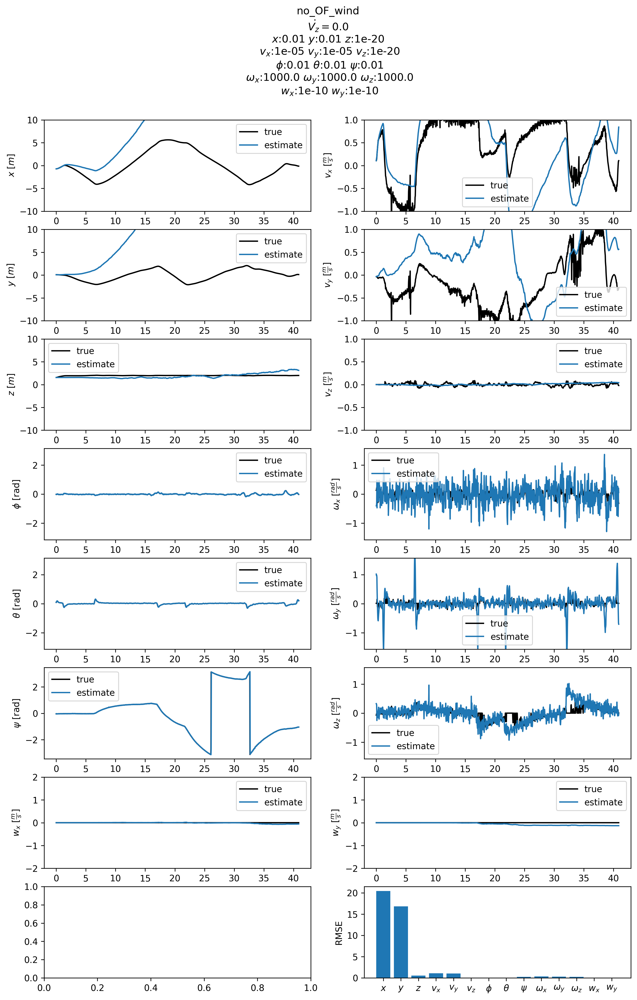

In [414]:
FLAG_PLOTTING = 'states'
if FLAG_PLOTTING == 'states_and_params':
   # plot the estimated states and the true states all on the same figure
    # 19 states make the plots 10 by 2
    fig, ax = plt.subplots(10, 2, figsize=(3 * 4, 3 * 6), dpi=300)

    # plot x
    ax[0, 0].plot(TIME_BL, X_TRUE, label='true', color='black')
    ax[0, 0].plot(TIME_BL, x_hat_BL, label='estimate')
    ax[0, 0].set_ylabel('$x$ [$m$]')
    ax[0, 0].set_ylim(-10, 10)
    ax[0, 0].legend()

    # plot y
    ax[1, 0].plot(TIME_BL, Y_TRUE, label='true', color='black')
    ax[1, 0].plot(TIME_BL, y_hat_BL, label='estimate')
    ax[1, 0].set_ylabel('$y$ [$m$]')
    ax[1, 0].set_ylim(-10, 10)
    ax[1, 0].legend()

    # plot z
    ax[2, 0].plot(TIME_BL, Z_TRUE, label='true', color='black')
    ax[2, 0].plot(TIME_BL, z_hat_BL, label='estimate')
    ax[2, 0].set_ylabel('$z$ [$m$]')
    ax[2, 0].set_ylim(-10, 10)
    ax[2, 0].legend()

    # plot v_x
    ax[0, 1].plot(TIME_BL, X_DOT_BL_TRUE, label='true', color='black')
    ax[0, 1].plot(TIME_BL, v_x_hat_BL, label='estimate')
    ax[0, 1].set_ylabel(r'$v_x$ [$\frac{m}{s}$]')
    ax[0, 1].set_ylim(-1, 1)
    ax[0, 1].legend()

    # plot v_y
    ax[1, 1].plot(TIME_BL, Y_DOT_BL_TRUE, label='true', color='black')
    ax[1, 1].plot(TIME_BL, v_y_hat_BL, label='estimate')
    ax[1, 1].set_ylabel(r'$v_y$ [$\frac{m}{s}$]')
    ax[1, 1].set_ylim(-1, 1)
    ax[1, 1].legend()

    # plot v_z
    ax[2, 1].plot(TIME_BL, Z_DOT_BL_TRUE, label='true', color='black')
    ax[2, 1].plot(TIME_BL, v_z_hat_BL, label='estimate')
    ax[2, 1].set_ylabel(r'$v_z$ [$\frac{m}{s}$]')
    ax[2, 1].set_ylim(-1, 1)
    ax[2, 1].legend()

    # plot phi
    ax[3, 0].plot(TIME_BL, IMU_ROLL, label='true', color='black')
    ax[3, 0].plot(TIME_BL, phi_hat_BL, label='estimate')
    ax[3, 0].set_ylabel('$\phi$ [rad]')
    ax[3, 0].set_ylim(-1*np.pi, 1*np.pi)
    ax[3, 0].legend()

    # plot theta
    ax[4, 0].plot(TIME_BL, IMU_PITCH, label='true', color='black')
    ax[4, 0].plot(TIME_BL, theta_hat_BL, label='estimate')
    ax[4, 0].set_ylabel(r'$\theta$ [rad]')
    ax[4, 0].set_ylim(-1*np.pi, 1*np.pi)
    ax[4, 0].legend()

    # plot psi
    ax[5, 0].plot(TIME_BL, IMU_YAW, label='true', color='black')
    ax[5, 0].plot(TIME_BL, psi_hat_BL, label='estimate')
    ax[5, 0].set_ylabel('$\psi$ [rad]')
    # ax[5, 0].set_ylim(-2*np.pi, 5*np.pi)
    ax[5, 0].legend()

    # plot omega_x
    ax[3, 1].plot(TIME_BL, IMU_OMEGA_X, label='true', color='black')
    ax[3, 1].plot(TIME_BL, omega_x_hat_BL, label='estimate')
    ax[3, 1].set_ylabel(r'$\omega_x$ [$\frac{rad}{s}$]')
    ax[3, 1].set_ylim(-0.5*np.pi, 0.5*np.pi)
    ax[3, 1].legend()

    # plot omega_y
    ax[4, 1].plot(TIME_BL, IMU_OMEGA_Y, label='true', color='black')
    ax[4, 1].plot(TIME_BL, omega_y_hat_BL, label='estimate')
    ax[4, 1].set_ylabel(r'$\omega_y$ [$\frac{rad}{s}$]')
    ax[4, 1].set_ylim(-0.5*np.pi, 0.5*np.pi)
    ax[4, 1].legend()

    # plot omega_z
    ax[5, 1].plot(TIME_BL, IMU_OMEGA_Z, label='true', color='black')
    ax[5, 1].plot(TIME_BL, omega_z_hat_BL, label='estimate')
    ax[5, 1].set_ylabel(r'$\omega_z$ [$\frac{rad}{s}$]')
    ax[5, 1].set_ylim(-0.5*np.pi, 0.5*np.pi)
    ax[5, 1].legend()

    # plot w
    ax[6, 0].plot(TIME_BL, np.zeros_like(TIME_BL), label='true', color='black')
    ax[6, 0].plot(TIME_BL, w_hat_BL, label='estimate')
    ax[6, 0].set_ylabel(r'$w$ [$\frac{m}{s}$]')
    ax[6, 0].set_ylim(-2, 2)
    ax[6, 0].legend()

    # plot zeta
    ax[7, 0].plot(TIME_BL, np.zeros_like(TIME_BL), label='true', color='black')
    ax[7, 0].plot(TIME_BL, zeta_hat_BL, label='estimate')
    ax[7, 0].set_ylabel('$\zeta$ [rad]')
    ax[7, 0].set_ylim(-np.pi, 2.5*np.pi)
    ax[7, 0].legend()

    # plot m
    ax[8, 0].plot(TIME_BL, np.ones_like(TIME_BL)*Real_mM, label='true', color='black')
    ax[8, 0].plot(TIME_BL, m_hat_BL, label='estimate')
    ax[8, 0].set_ylabel('$m$ [kg]')
    # ax[8, 0].set_ylim(0, .2)
    ax[8, 0].legend()

    # plot C
    ax[9, 0].plot(TIME_BL, np.ones_like(TIME_BL)*Real_C, label='true', color='black')
    ax[9, 0].plot(TIME_BL, C_hat_BL, label='estimate')
    ax[9, 0].set_ylabel('$C$')
    # ax[9, 0].set_ylim(0, .15)
    ax[9, 0].legend()

    # plot I_x
    ax[6, 1].plot(TIME_BL, np.ones_like(TIME_BL)*Real_Ix, label='true', color='black')
    ax[6, 1].plot(TIME_BL, I_x_hat_BL, label='estimate')
    ax[6, 1].set_ylabel('$I_x$ [$kg*m^2$]')
    # ax[6, 1].set_ylim(0, .09)
    ax[6, 1].legend()

    # plot I_y
    ax[7, 1].plot(TIME_BL, np.ones_like(TIME_BL)*Real_Iy, label='true', color='black')
    ax[7, 1].plot(TIME_BL, I_y_hat_BL, label='estimate')
    ax[7, 1].set_ylabel('$I_y$ [$kg*m^2$]')
    # ax[7, 1].set_ylim(0, .09)
    ax[7, 1].legend()

    # plot I_z
    ax[8, 1].plot(TIME_BL, np.ones_like(TIME_BL)*Real_Iz, label='true', color='black')
    ax[8, 1].plot(TIME_BL, I_z_hat_BL, label='estimate')
    ax[8, 1].set_ylabel('$I_z$ [$kg*m^2$]')
    # ax[8, 1].set_ylim(0, .09)
    ax[8, 1].legend()

    # Calculate RMSE between true and estimated states
    RMSE_x = np.sqrt(np.mean((X_TRUE - x_hat_BL) ** 2))
    RMSE_y = np.sqrt(np.mean((Y_TRUE - y_hat_BL) ** 2))
    RMSE_z = np.sqrt(np.mean((Z_TRUE - z_hat_BL) ** 2))
    RMSE_v_x = np.sqrt(np.mean((X_DOT_BL_TRUE - v_x_hat_BL) ** 2))
    RMSE_v_y = np.sqrt(np.mean((Y_DOT_BL_TRUE - v_y_hat_BL) ** 2))
    RMSE_v_z = np.sqrt(np.mean((Z_DOT_BL_TRUE - v_z_hat_BL) ** 2))
    RMSE_phi = np.sqrt(np.mean((IMU_ROLL - phi_hat_BL) ** 2))
    RMSE_theta = np.sqrt(np.mean((IMU_PITCH - theta_hat_BL) ** 2))
    RMSE_psi = np.sqrt(np.mean((IMU_YAW - psi_hat_BL) ** 2))
    RMSE_omega_x = np.sqrt(np.mean((IMU_OMEGA_X - omega_x_hat_BL) ** 2))
    RMSE_omega_y = np.sqrt(np.mean((IMU_OMEGA_Y - omega_y_hat_BL) ** 2))
    RMSE_omega_z = np.sqrt(np.mean((IMU_OMEGA_Z - omega_z_hat_BL) ** 2))
    RMSE_w = np.sqrt(np.mean((np.zeros_like(TIME_BL) - w_hat_BL) ** 2))
    RMSE_zeta = np.sqrt(np.mean((np.zeros_like(TIME_BL) - zeta_hat_BL) ** 2))

    RMSE_m = np.sqrt(np.mean((np.ones_like(TIME_BL) * Real_mM - m_hat_BL) ** 2))
    RMSE_I_x = np.sqrt(np.mean((np.ones_like(TIME_BL) * Real_Ix - I_x_hat_BL) ** 2))
    RMSE_I_y = np.sqrt(np.mean((np.ones_like(TIME_BL) * Real_Iy - I_y_hat_BL) ** 2))
    RMSE_I_z = np.sqrt(np.mean((np.ones_like(TIME_BL) * Real_Iz - I_z_hat_BL) ** 2))
    RMSE_C = np.sqrt(np.mean((np.ones_like(TIME_BL) * Real_C - C_hat_BL) ** 2))

    # Combine RMSE values into an array
    RMSE = np.array([RMSE_x, RMSE_y, RMSE_z, RMSE_v_x, RMSE_v_y, RMSE_v_z, RMSE_phi, RMSE_theta, RMSE_psi, RMSE_omega_x, RMSE_omega_y, RMSE_omega_z, RMSE_w, RMSE_zeta, RMSE_m, RMSE_I_x, RMSE_I_y, RMSE_I_z, RMSE_C])

    # RMSE = np.array([RMSE_x, RMSE_y, RMSE_z, RMSE_v_x, RMSE_v_y, RMSE_v_z, RMSE_phi, RMSE_theta, RMSE_psi, RMSE_omega_x, RMSE_omega_y, RMSE_omega_z, RMSE_w, RMSE_zeta])
    # Plot RMSE as a bar graph
    ax[9, 1].bar(np.arange(len(RMSE)), RMSE)  # Adjust x-axis range to match RMSE length
    ax[9, 1].set_ylabel('RMSE')
    ax[9, 1].set_xticks(np.arange(len(RMSE)))
    # Write x tick labels in LaTeX format
    ax[9, 1].set_xticklabels(['$x$', '$y$', '$z$', '$v_x$', '$v_y$', '$v_z$', '$\phi$', r'$\theta$', '$\psi$', '$\omega_x$', '$\omega_y$', '$\omega_z$', '$w$', '$\zeta$', '$m$', '$I_x$', '$I_y$', '$I_z$', '$C$'])

    # ax[9, 1].set_xticklabels(['$x$', '$y$', '$z$', '$v_x$', '$v_y$', '$v_z$', '$\phi$', r'$\theta$', '$\psi$', '$\omega_x$', '$\omega_y$', '$\omega_z$', '$w$', '$\zeta$'])
    # add title that shows the state and it s coresponding Q value
    Q_BL_diag = np.diag(Q_BL)
    fig.suptitle('$x$:' + str(Q_BL_diag[0]) + ' $y$:' + str(Q_BL_diag[1]) + ' $z$:' + str(Q_BL_diag[2]) + '\n' +' $v_x$:' + str(Q_BL_diag[3]) + ' $v_y$:' + str(Q_BL_diag[4]) + ' $v_z$:' + str(Q_BL_diag[5]) + '\n' +' $\phi$:' + str(Q_BL_diag[6]) + r' $\theta$:' + str(Q_BL_diag[7]) + ' $\psi$:' + str(Q_BL_diag[8]) + '\n' + ' $\omega_x$:' + str(Q_BL_diag[9]) + ' $\omega_y$:' + str(Q_BL_diag[10]) + ' $\omega_z$:' + str(Q_BL_diag[11]) + '\n' +' $w$:' + str(Q_BL_diag[12]) + ' $\zeta$:' + str(Q_BL_diag[13]) + '\n' + ' $m$:' + str(Q_BL_diag[14]) + ' $I_x$:' + str(Q_BL_diag[15]) + ' $I_y$:' + str(Q_BL_diag[16]) + ' $I_z$:' + str(Q_BL_diag[17]))

    # fig.suptitle('$x$:' + str(Q_BL_diag[0]) + ' $y$:' + str(Q_BL_diag[1]) + ' $z$:' + str(Q_BL_diag[2]) + '\n' +' $v_x$:' + str(Q_BL_diag[3]) + ' $v_y$:' + str(Q_BL_diag[4]) + ' $v_z$:' + str(Q_BL_diag[5]) + '\n' +' $\phi$:' + str(Q_BL_diag[6]) + r' $\theta$:' + str(Q_BL_diag[7]) + ' $\psi$:' + str(Q_BL_diag[8]) + '\n' + ' $\omega_x$:' + str(Q_BL_diag[9]) + ' $\omega_y$:' + str(Q_BL_diag[10]) + ' $\omega_z$:' + str(Q_BL_diag[11]) + '\n' +' $w$:' + str(Q_BL_diag[12]) + ' $\zeta$:' + str(Q_BL_diag[13]))

    plt.show()

elif FLAG_PLOTTING == 'states':
        # plot the estimated states and the true states all on the same figure
    # 19 states make the plots 10 by 2
    fig, ax = plt.subplots(8, 2, figsize=(3 * 4, 3 * 6), dpi=300)

    # plot x
    ax[0, 0].plot(TIME_BL, X_TRUE, label='true', color='black')
    ax[0, 0].plot(TIME_BL, x_hat_BL, label='estimate')
    ax[0, 0].set_ylabel('$x$ [$m$]')
    ax[0, 0].set_ylim(-10, 10)
    ax[0, 0].legend()

    # plot y
    ax[1, 0].plot(TIME_BL, Y_TRUE, label='true', color='black')
    ax[1, 0].plot(TIME_BL, y_hat_BL, label='estimate')
    ax[1, 0].set_ylabel('$y$ [$m$]')
    ax[1, 0].set_ylim(-10, 10)
    ax[1, 0].legend()

    # plot z
    ax[2, 0].plot(TIME_BL, Z_TRUE, label='true', color='black')
    ax[2, 0].plot(TIME_BL, z_hat_BL, label='estimate')
    ax[2, 0].set_ylabel('$z$ [$m$]')
    ax[2, 0].set_ylim(-10, 10)
    ax[2, 0].legend()

    # plot v_x
    ax[0, 1].plot(TIME_BL, X_DOT_BL_TRUE, label='true', color='black')
    ax[0, 1].plot(TIME_BL, v_x_hat_BL, label='estimate')
    ax[0, 1].set_ylabel(r'$v_x$ [$\frac{m}{s}$]')
    ax[0, 1].set_ylim(-1, 1)
    ax[0, 1].legend()

    # plot v_y
    ax[1, 1].plot(TIME_BL, Y_DOT_BL_TRUE, label='true', color='black')
    ax[1, 1].plot(TIME_BL, v_y_hat_BL, label='estimate')
    ax[1, 1].set_ylabel(r'$v_y$ [$\frac{m}{s}$]')
    ax[1, 1].set_ylim(-1, 1)
    ax[1, 1].legend()

    # plot v_z
    ax[2, 1].plot(TIME_BL, Z_DOT_BL_TRUE, label='true', color='black')
    ax[2, 1].plot(TIME_BL, v_z_hat_BL, label='estimate')
    ax[2, 1].set_ylabel(r'$v_z$ [$\frac{m}{s}$]')
    ax[2, 1].set_ylim(-1, 1)
    ax[2, 1].legend()

    # plot phi
    ax[3, 0].plot(TIME_BL, IMU_ROLL, label='true', color='black')
    ax[3, 0].plot(TIME_BL, phi_hat_BL, label='estimate')
    ax[3, 0].set_ylabel('$\phi$ [rad]')
    ax[3, 0].set_ylim(-1*np.pi, 1*np.pi)
    ax[3, 0].legend()

    # plot theta
    ax[4, 0].plot(TIME_BL, IMU_PITCH, label='true', color='black')
    ax[4, 0].plot(TIME_BL, theta_hat_BL, label='estimate')
    ax[4, 0].set_ylabel(r'$\theta$ [rad]')
    ax[4, 0].set_ylim(-1*np.pi, 1*np.pi)
    ax[4, 0].legend()

    # plot psi
    ax[5, 0].plot(TIME_BL, IMU_YAW, label='true', color='black')
    ax[5, 0].plot(TIME_BL, psi_hat_BL, label='estimate')
    ax[5, 0].set_ylabel('$\psi$ [rad]')
    # ax[5, 0].set_ylim(-2*np.pi, 5*np.pi)
    ax[5, 0].legend()

    # plot omega_x
    ax[3, 1].plot(TIME_BL, OMEGA_X_TRUE, label='true', color='black')
    ax[3, 1].plot(TIME_BL, omega_x_hat_BL, label='estimate')
    ax[3, 1].set_ylabel(r'$\omega_x$ [$\frac{rad}{s}$]')
    ax[3, 1].set_ylim(-0.5*np.pi, 0.5*np.pi)
    ax[3, 1].legend()

    # plot omega_y
    ax[4, 1].plot(TIME_BL, OMEGA_Y_TRUE, label='true', color='black')
    ax[4, 1].plot(TIME_BL, omega_y_hat_BL, label='estimate')
    ax[4, 1].set_ylabel(r'$\omega_y$ [$\frac{rad}{s}$]')
    ax[4, 1].set_ylim(-0.5*np.pi, 0.5*np.pi)
    ax[4, 1].legend()

    # plot omega_z
    ax[5, 1].plot(TIME_BL, OMEGA_Z_TRUE, label='true', color='black')
    ax[5, 1].plot(TIME_BL, omega_z_hat_BL, label='estimate')
    ax[5, 1].set_ylabel(r'$\omega_z$ [$\frac{rad}{s}$]')
    ax[5, 1].set_ylim(-0.5*np.pi, 0.5*np.pi)
    ax[5, 1].legend()

    # plot wx
    ax[6, 0].plot(TIME_BL, np.zeros_like(TIME_BL), label='true', color='black')
    ax[6, 0].plot(TIME_BL, wx_hat_BL, label='estimate')
    ax[6, 0].set_ylabel(r'$w_{x}$ [$\frac{m}{s}$]')
    ax[6, 0].set_ylim(-2, 2)
    ax[6, 0].legend()

    # plot wy
    ax[6, 1].plot(TIME_BL, np.zeros_like(TIME_BL), label='true', color='black')
    ax[6, 1].plot(TIME_BL, wy_hat_BL, label='estimate')
    ax[6, 1].set_ylabel(r'$w_{y}$ [$\frac{m}{s}$]')
    ax[6, 1].set_ylim(-2, 2)
    ax[6, 1].legend()


    # Calculate RMSE between true and estimated states
    RMSE_x = np.sqrt(np.mean((X_TRUE - x_hat_BL) ** 2))
    RMSE_y = np.sqrt(np.mean((Y_TRUE - y_hat_BL) ** 2))
    RMSE_z = np.sqrt(np.mean((Z_TRUE - z_hat_BL) ** 2))
    RMSE_v_x = np.sqrt(np.mean((X_DOT_BL_TRUE - v_x_hat_BL) ** 2))
    RMSE_v_y = np.sqrt(np.mean((Y_DOT_BL_TRUE - v_y_hat_BL) ** 2))
    RMSE_v_z = np.sqrt(np.mean((Z_DOT_BL_TRUE - v_z_hat_BL) ** 2))
    RMSE_phi = np.sqrt(np.mean((IMU_ROLL - phi_hat_BL) ** 2))
    RMSE_theta = np.sqrt(np.mean((IMU_PITCH - theta_hat_BL) ** 2))
    RMSE_psi = np.sqrt(np.mean((IMU_YAW - psi_hat_BL) ** 2))
    RMSE_omega_x = np.sqrt(np.mean((OMEGA_X_TRUE - omega_x_hat_BL) ** 2))
    RMSE_omega_y = np.sqrt(np.mean((OMEGA_Y_TRUE - omega_y_hat_BL) ** 2))
    RMSE_omega_z = np.sqrt(np.mean((OMEGA_Z_TRUE - omega_z_hat_BL) ** 2))
    RMSE_wx = np.sqrt(np.mean((np.zeros_like(TIME_BL) - wx_hat_BL) ** 2))
    RMSE_wy = np.sqrt(np.mean((np.zeros_like(TIME_BL) - wx_hat_BL) ** 2))

    # Combine RMSE values into an array
    RMSE = np.array([RMSE_x, RMSE_y, RMSE_z, RMSE_v_x, RMSE_v_y, RMSE_v_z, RMSE_phi, RMSE_theta, RMSE_psi, RMSE_omega_x, RMSE_omega_y, RMSE_omega_z, RMSE_wx, RMSE_wy])
    # Plot RMSE as a bar graph
    ax[7, 1].bar(np.arange(len(RMSE)), RMSE)  # Adjust x-axis range to match RMSE length
    ax[7, 1].set_ylabel('RMSE')
    ax[7, 1].set_xticks(np.arange(len(RMSE)))
    # Write x tick labels in LaTeX format
    ax[7, 1].set_xticklabels(['$x$', '$y$', '$z$', '$v_x$', '$v_y$', '$v_z$', '$\phi$', r'$\theta$', '$\psi$', '$\omega_x$', '$\omega_y$', '$\omega_z$', '$w_x$', '$w_y$'])
    # add title that shows the state and it s coresponding Q value
    Q_BL_diag = np.diag(Q_BL)
    FLAG_VZ_DOT='zero'
    if FLAG_VZ_DOT=='zero':
        fig.suptitle(Y_SWEEP + '\n' + '$\dot{V_z}=0.0$' + '\n' +'$x$:' + str(Q_BL_diag[0]) + ' $y$:' + str(Q_BL_diag[1]) + ' $z$:' + str(Q_BL_diag[2]) + '\n' +' $v_x$:' + str(Q_BL_diag[3]) + ' $v_y$:' + str(Q_BL_diag[4]) + ' $v_z$:' + str(Q_BL_diag[5]) + '\n' +' $\phi$:' + str(Q_BL_diag[6]) + r' $\theta$:' + str(Q_BL_diag[7]) + ' $\psi$:' + str(Q_BL_diag[8]) + '\n' + ' $\omega_x$:' + str(Q_BL_diag[9]) + ' $\omega_y$:' + str(Q_BL_diag[10]) + ' $\omega_z$:' + str(Q_BL_diag[11]) + '\n' +' $w_x$:' + str(Q_BL_diag[12]) + ' $w_y$:' + str(Q_BL_diag[13]))
    else:
        fig.suptitle('$x$:' + str(Q_BL_diag[0]) + ' $y$:' + str(Q_BL_diag[1]) + ' $z$:' + str(Q_BL_diag[2]) + '\n' +' $v_x$:' + str(Q_BL_diag[3]) + ' $v_y$:' + str(Q_BL_diag[4]) + ' $v_z$:' + str(Q_BL_diag[5]) + '\n' +' $\phi$:' + str(Q_BL_diag[6]) + r' $\theta$:' + str(Q_BL_diag[7]) + ' $\psi$:' + str(Q_BL_diag[8]) + '\n' + ' $\omega_x$:' + str(Q_BL_diag[9]) + ' $\omega_y$:' + str(Q_BL_diag[10]) + ' $\omega_z$:' + str(Q_BL_diag[11]) + '\n' +' $w_x$:' + str(Q_BL_diag[12]) + ' $w_y$:' + str(Q_BL_diag[13]))
    plt.show()

In [331]:
# print("IX_final",I_x_hat_BL[-1])
# print("IY_final",I_y_hat_BL[-1])
# print("IZ_final",I_z_hat_BL[-1])

# Simulate based on real data

In [332]:
# great dictionary from real pwm values named 'PWM1' 'PWM2' 'PWM3' 'PWM4'
U_real = {'PWM1': PWM_1, 
          'PWM2': PWM_2,
          'PWM3': PWM_3,
          'PWM4': PWM_4}

In [333]:
X0_BL

array([[-5.96742463e-01],
       [-4.97031148e-01],
       [ 1.35630095e+00],
       [ 4.90342649e-03],
       [-2.36234048e-02],
       [-1.55084875e-04],
       [-1.07587688e-02],
       [ 1.12447599e-02],
       [ 1.82535697e-01],
       [-1.28735318e-02],
       [-8.33132714e-02],
       [ 2.12058332e-01],
       [ 0.00000000e+00],
       [ 0.00000000e+00]])

In [108]:
X0_sim = []
for i in range(len(X0_BL)):
    X0_sim.append(X0_BL[i][0])

# Check if the absolute values of the last two elements are both < 1e-12
if abs(X0_BL[-1][0]) < 1e-12 and abs(X0_BL[-2][0]) < 1e-12:
    print('hello')
    X0_sim[-2] = 1e-12
    X0_sim[-1] = 1e-12


X0_sim = np.array(X0_sim)
print("X0_sim", len(X0_sim), '\n', X0_sim)

hello
X0_sim 14 
 [-5.96742463e-01 -4.97031148e-01  1.35630095e+00  4.90342649e-03
 -2.36234048e-02 -1.55084875e-04 -1.07587688e-02  1.12447599e-02
  1.82535697e-01 -1.28735318e-02 -8.33132714e-02  2.12058332e-01
  1.00000000e-12  1.00000000e-12]


In [109]:
len(X0_sim)

14

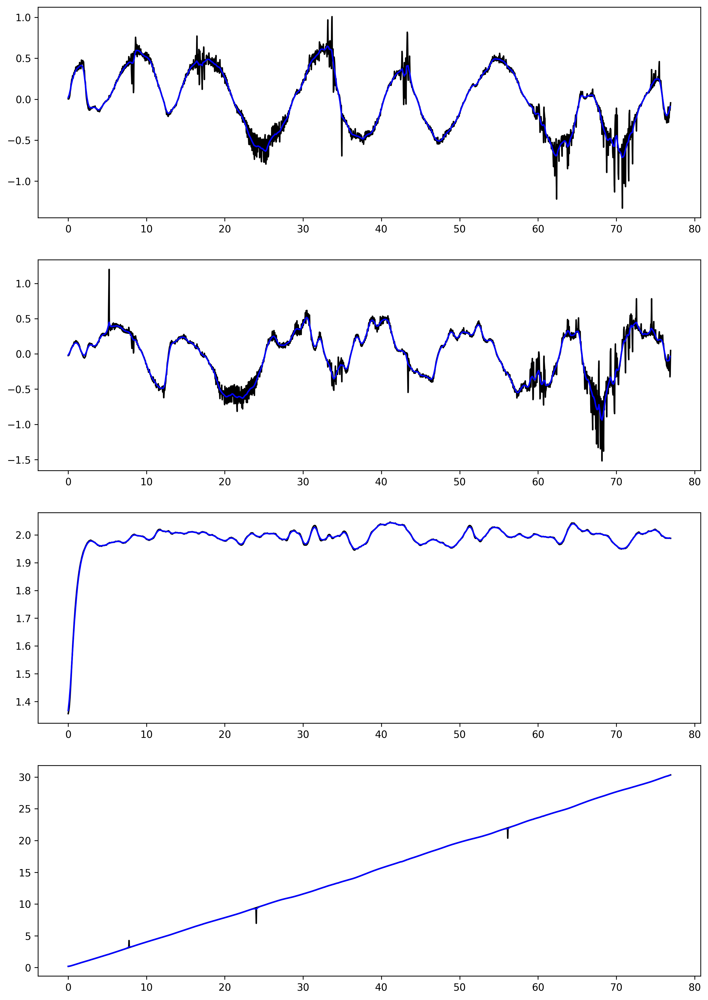

In [193]:
# run targets through filter to smooth them
# get dt for the filter
dt_filtter = TIME_BL[1] - TIME_BL[0]
X_DOT_BL_TRUE_MPC = low_pass_filter(X_DOT_BL_TRUE, dt_filtter, 1)
Y_DOT_BL_TRUE_MPC = low_pass_filter(Y_DOT_BL_TRUE, dt_filtter, 1)
Z_TRUE_MPC = low_pass_filter(Z_TRUE, dt_filtter, 1)
IMU_YAW_MPC = low_pass_filter(np.unwrap(IMU_YAW), dt_filtter, 1)

#take every nth element of the array
nth= 4
TIME_BL_MPC = np.array(TIME_BL[::nth])
dt_MPC = np.mean(np.diff(TIME_BL_MPC))
X_DOT_BL_TRUE_MPC = np.array(X_DOT_BL_TRUE_MPC[::nth])
Y_DOT_BL_TRUE_MPC = np.array(Y_DOT_BL_TRUE_MPC[::nth])
Z_TRUE_MPC = np.array(Z_TRUE_MPC[::nth])
IMU_YAW_MPC = np.array(IMU_YAW_MPC[::nth])
# print the length of the arrays
# plot the target trajectories X_DOT_BL_TRUE, Y_DOT_BL_TRUE, Z_TRUE, Yaw_true
fig, ax = plt.subplots(4, 1, figsize=(3 * 4, 3 * 6), dpi=300)
# plot
ax[0].plot(TIME_BL, X_DOT_BL_TRUE, label='true', color='black')
ax[1].plot(TIME_BL, Y_DOT_BL_TRUE, label='true', color='black')
ax[2].plot(TIME_BL, Z_TRUE, label='true', color='black')
ax[3].plot(TIME_BL, np.unwrap(IMU_YAW), label='true', color='black')
ax[0].plot(TIME_BL_MPC, X_DOT_BL_TRUE_MPC, label='true', color='blue')
ax[1].plot(TIME_BL_MPC, Y_DOT_BL_TRUE_MPC, label='true', color='blue')
ax[2].plot(TIME_BL_MPC, Z_TRUE_MPC, label='true', color='blue')
ax[3].plot(TIME_BL_MPC, IMU_YAW_MPC, label='true', color='blue')
plt.show()


In [228]:
g = 9.81  # gravity [m/s^2]
m = 0.086  # mass [kg]
M = 2.529  # mass [kg]
Mm = 4 * m + M  # total mass [kg]
L = 0.2032  # length [m]
R = 0.1778  # average body radius [m]
I_x = .491
# self.I_x = 2 * (self.M * self.R ** 2) / 5 + 2 * self.m * self.L ** 2  # [kg*m^2] moment of inertia about x
I_y = .387
# self.I_y = 2 * (self.M * self.R ** 2) / 5 + 2 * self.m * self.L ** 2  # [kg*m^2] moment of inertia about y
I_z = .667
# self.I_z = 2 * (self.M * self.R ** 2) / 5 + 4 * self.m * self.L ** 2  # [kg*m^2] moment of inertia about y
# b = 1.8311  # thrust coefficient
# d = 1  # drag constant
# C = 0.1  # drag coefficient from ground speed plus air speed
b = 1.34
d = 1.0
C = 0.1

PARAMS = {
        'g': g,
        'm': m,
        'M': M,
        'Mm': Mm,
        'L': L,
        'R': R,
        'I_x': I_x,
        'I_y': I_y,
        'I_z': I_z,
        'b': b,
        'd': d,
        'C': C
                }

In [229]:
# Create simulator
simulator = DroneSimulator(dt=dt_MPC, mpc_horizon=50, r_u=1e-4, control_mode='velocity_body_level',params=PARAMS)
# Update the setpoints
simulator.update_setpoint(v_x=X_DOT_BL_TRUE_MPC, v_y=Y_DOT_BL_TRUE_MPC, psi=IMU_YAW_MPC, z=Z_TRUE_MPC, wx=np.zeros_like(Z_TRUE_MPC), wy=np.zeros_like(Z_TRUE_MPC))
# Run simulation
st = time.time()
# t_sim, x_sim, u_sim, y_sim = simulator.simulate(x0=X0_sim, u=U_real, mpc=False, return_full_output=True)
t_sim, x_sim, u_sim, y_sim = simulator.simulate(x0=X0_sim, mpc=True, return_full_output=True)
et = time.time()
print('elapsed time:', et-st)

Drone parameters: {'g': 9.81, 'm': 0.086, 'M': 2.529, 'Mm': 2.8729999999999998, 'L': 0.2032, 'R': 0.1778, 'I_x': 0.491, 'I_y': 0.387, 'I_z': 0.667, 'b': 1.34, 'd': 1.0, 'C': 0.1}
elapsed time: 118.73005747795105


In [230]:
U_real

{'PWM1': array([4.77747   , 5.02757828, 5.33024709, ..., 5.57906357, 5.40110995,
        5.03253   ]),
 'PWM2': array([4.54203   , 4.72759421, 4.95215494, ..., 5.00116464, 4.89319278,
        4.66956   ]),
 'PWM3': array([7.0632    , 6.84805309, 6.58769283, ..., 5.55133909, 5.52934483,
        5.48379   ]),
 'PWM4': array([7.3575    , 7.1504211 , 6.89982434, ..., 5.59834883, 5.74631026,
        6.05277   ])}

In [231]:
x_sim

{'x': array([-5.96742463e-01, -5.94571025e-01, -5.87466027e-01, -5.71646883e-01,
        -5.48615812e-01, -5.21475697e-01, -4.92310190e-01, -4.62040673e-01,
        -4.31136652e-01, -3.99906166e-01, -3.68257950e-01, -3.35624366e-01,
        -3.01347587e-01, -2.65396803e-01, -2.29233945e-01, -1.96244407e-01,
        -1.70954651e-01, -1.57098145e-01, -1.55790758e-01, -1.65235660e-01,
        -1.81920824e-01, -2.02194499e-01, -2.23307287e-01, -2.43651150e-01,
        -2.62566980e-01, -2.80217320e-01, -2.97449084e-01, -3.15412438e-01,
        -3.35129114e-01, -3.57293759e-01, -3.82277616e-01, -4.10125603e-01,
        -4.40507701e-01, -4.72703067e-01, -5.05751208e-01, -5.38981006e-01,
        -5.72910755e-01, -6.09728757e-01, -6.52012912e-01, -6.99825599e-01,
        -7.49698886e-01, -7.98286600e-01, -8.45532649e-01, -8.93274632e-01,
        -9.42780490e-01, -9.94294146e-01, -1.04763982e+00, -1.10252421e+00,
        -1.15867235e+00, -1.21595474e+00, -1.27433070e+00, -1.33365799e+00,
       

In [232]:
print(dt_MPC)
print(DT_BL)

0.1334555231862598
0.03


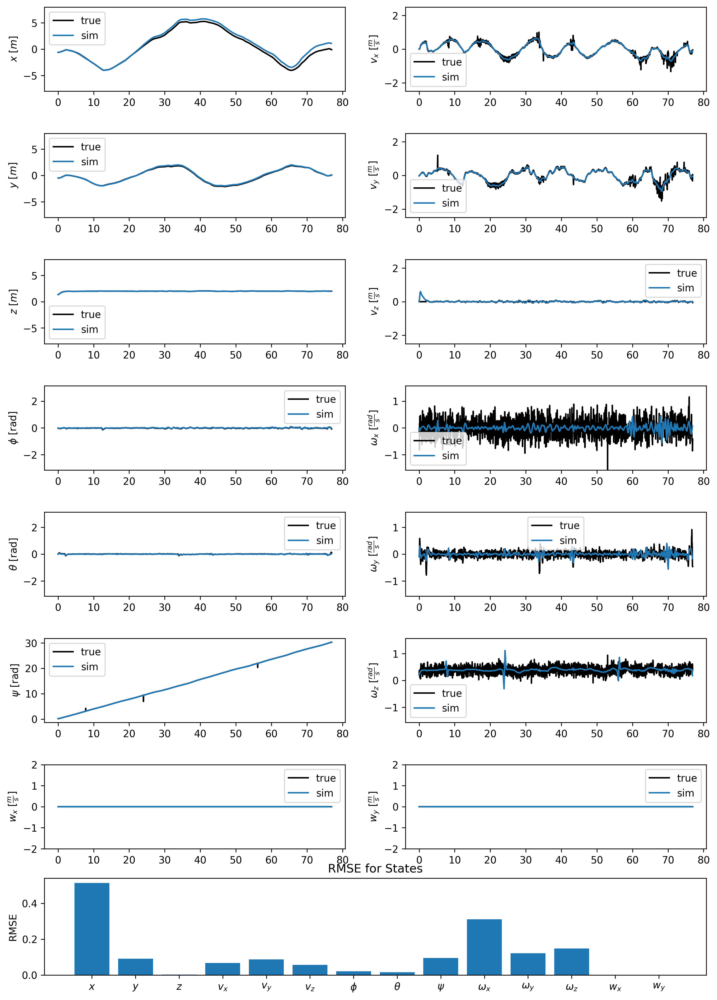

In [233]:
T_MPC = t_sim
# Create the 7x2 grid for plotting
fig, ax = plt.subplots(8, 2, figsize=(3 * 4, 3 * 6), dpi=300)

# Plot each state using the dictionary
# plot x
ax[0, 0].plot(TIME_BL, X_TRUE, label='true', color='black')
ax[0, 0].plot(T_MPC, x_sim['x'],  label='sim')
ax[0, 0].set_ylabel('$x$ [$m$]')
ax[0, 0].set_ylim(-8, 8)
ax[0, 0].legend()

# plot y
ax[1, 0].plot(TIME_BL, Y_TRUE, label='true', color='black')
ax[1, 0].plot(T_MPC, x_sim['y'], label='sim')
ax[1, 0].set_ylabel('$y$ [$m$]')
ax[1, 0].set_ylim(-8, 8)
ax[1, 0].legend()

# plot z
ax[2, 0].plot(TIME_BL, Z_TRUE, label='true', color='black')
ax[2, 0].plot(T_MPC, x_sim['z'],  label='sim')
ax[2, 0].set_ylabel('$z$ [$m$]')
ax[2, 0].set_ylim(-8, 8)
ax[2, 0].legend()

# plot v_x
ax[0, 1].plot(TIME_BL, X_DOT_BL_TRUE, label='true', color='black')
ax[0, 1].plot(T_MPC, x_sim['v_x'],  label='sim')
ax[0, 1].set_ylabel(r'$v_x$ [$\frac{m}{s}$]')
ax[0, 1].set_ylim(-2.5, 2.5)
ax[0, 1].legend()

# plot v_y
ax[1, 1].plot(TIME_BL, Y_DOT_BL_TRUE, label='true', color='black')
ax[1, 1].plot(T_MPC, x_sim['v_y'],  label='sim')
ax[1, 1].set_ylabel(r'$v_y$ [$\frac{m}{s}$]')
ax[1, 1].set_ylim(-2.5, 2.5)
ax[1, 1].legend()

# plot v_z
ax[2, 1].plot(TIME_BL, Z_DOT_BL_TRUE, label='true', color='black')
ax[2, 1].plot(T_MPC, x_sim['v_z'],  label='sim')
ax[2, 1].set_ylabel(r'$v_z$ [$\frac{m}{s}$]')
ax[2, 1].set_ylim(-2.5, 2.5)
ax[2, 1].legend()

# plot phi
ax[3, 0].plot(TIME_BL, IMU_ROLL, label='true', color='black')
ax[3, 0].plot(T_MPC, x_sim['phi'],  label='sim')
ax[3, 0].set_ylabel('$\phi$ [rad]')
ax[3, 0].set_ylim(-1 * np.pi, 1 * np.pi)
ax[3, 0].legend()

# plot theta
ax[4, 0].plot(TIME_BL, IMU_PITCH, label='true', color='black')
ax[4, 0].plot(T_MPC, x_sim['theta'],  label='sim')
ax[4, 0].set_ylabel(r'$\theta$ [rad]')
ax[4, 0].set_ylim(-1 * np.pi, 1 * np.pi)
ax[4, 0].legend()

# plot psi
ax[5, 0].plot(TIME_BL, np.unwrap(IMU_YAW), label='true', color='black')
ax[5, 0].plot(T_MPC, x_sim['psi'],  label='sim')
ax[5, 0].set_ylabel('$\psi$ [rad]')
ax[5, 0].legend()

# plot omega_x
ax[3, 1].plot(TIME_BL, IMU_OMEGA_X, label='true', color='black')
ax[3, 1].plot(T_MPC, x_sim['omega_x'], label='sim')
ax[3, 1].set_ylabel(r'$\omega_x$ [$\frac{rad}{s}$]')
ax[3, 1].set_ylim(-0.5 * np.pi, 0.5 * np.pi)
ax[3, 1].legend()

# plot omega_y
ax[4, 1].plot(TIME_BL, IMU_OMEGA_Y, label='true', color='black')
ax[4, 1].plot(T_MPC, x_sim['omega_y'],label='sim')
ax[4, 1].set_ylabel(r'$\omega_y$ [$\frac{rad}{s}$]')
ax[4, 1].set_ylim(-0.5 * np.pi, 0.5 * np.pi)
ax[4, 1].legend()

# plot omega_z
ax[5, 1].plot(TIME_BL, IMU_OMEGA_Z, label='true', color='black')
ax[5, 1].plot(T_MPC, x_sim['omega_z'], label='sim')
ax[5, 1].set_ylabel(r'$\omega_z$ [$\frac{rad}{s}$]')
ax[5, 1].set_ylim(-0.5 * np.pi, 0.5 * np.pi)
ax[5, 1].legend()

# plot wx
ax[6, 0].plot(TIME_BL, np.zeros_like(TIME_BL), label='true', color='black')
ax[6, 0].plot(T_MPC, x_sim['wx'], label='sim')
ax[6, 0].set_ylabel(r'$w_x$ [$\frac{m}{s}$]')
ax[6, 0].set_ylim(-2, 2)
ax[6, 0].legend()

# plot wy
ax[6, 1].plot(TIME_BL, np.zeros_like(TIME_BL), label='true', color='black')
ax[6, 1].plot(T_MPC, x_sim['wy'], label='sim')
ax[6, 1].set_ylabel(r'$w_y$ [$\frac{m}{s}$]')
ax[6, 1].set_ylim(-2, 2)
ax[6, 1].legend()

# make the sub plot [7,0] and [7,1] empty with no ticks number of splines
ax[7, 0].axis('off')
ax[7, 0].set_xticks([])
ax[7, 0].set_yticks([])
ax[7, 1].axis('off')
ax[7, 1].set_xticks([])
ax[7, 1].set_yticks([])


# Calculate RMSE between true and estimated states
RMSE_x = np.sqrt(np.mean((X_TRUE[::nth] - x_sim['x']) ** 2))
RMSE_y = np.sqrt(np.mean((Y_TRUE[::nth] - x_sim['y']) ** 2))
RMSE_z = np.sqrt(np.mean((Z_TRUE[::nth] - x_sim['z']) ** 2))
RMSE_v_x = np.sqrt(np.mean((X_DOT_BL_TRUE[::nth] - x_sim['v_x']) ** 2))
RMSE_v_y = np.sqrt(np.mean((Y_DOT_BL_TRUE[::nth] - x_sim['v_y']) ** 2))
RMSE_v_z = np.sqrt(np.mean((Z_DOT_BL_TRUE[::nth] - x_sim['v_z']) ** 2))
RMSE_phi = np.sqrt(np.mean((IMU_ROLL[::nth] - x_sim['phi']) ** 2))
RMSE_theta = np.sqrt(np.mean((IMU_PITCH[::nth] - x_sim['theta']) ** 2))
RMSE_psi = np.sqrt(np.mean((np.unwrap(IMU_YAW)[::nth] - x_sim['psi']) ** 2))
RMSE_omega_x = np.sqrt(np.mean((IMU_OMEGA_X[::nth] - x_sim['omega_x']) ** 2))
RMSE_omega_y = np.sqrt(np.mean((IMU_OMEGA_Y[::nth] - x_sim['omega_y']) ** 2))
RMSE_omega_z = np.sqrt(np.mean((IMU_OMEGA_Z[::nth] - x_sim['omega_z']) ** 2))
RMSE_wx = np.sqrt(np.mean((np.zeros_like(TIME_BL)[::nth] - x_sim['wx']) ** 2))
RMSE_wy = np.sqrt(np.mean((np.zeros_like(TIME_BL)[::nth] - x_sim['wy']) ** 2))

# Combine RMSE values into an array
RMSE = np.array([RMSE_x, RMSE_y, RMSE_z, RMSE_v_x, RMSE_v_y, RMSE_v_z, RMSE_phi, RMSE_theta, RMSE_psi, RMSE_omega_x, RMSE_omega_y, RMSE_omega_z, RMSE_wx, RMSE_wy])

# Plot RMSE as a bar graph
fig.subplots_adjust(hspace=0.5)  # Adjust spacing between subplots
fig.add_subplot(7, 2, (13, 14))  # Add a subplot spanning the bottom row
plt.bar(np.arange(len(RMSE)), RMSE)
plt.ylabel('RMSE')
plt.xticks([]) 
plt.xticks(np.arange(len(RMSE)), ['$x$', '$y$', '$z$', '$v_x$', '$v_y$', '$v_z$', '$\phi$', r'$\theta$', '$\psi$', '$\omega_x$', '$\omega_y$', '$\omega_z$', '$w_x$', '$w_y$'])
plt.title('RMSE for States')

plt.show()

RMSE sum 4.056800644254568


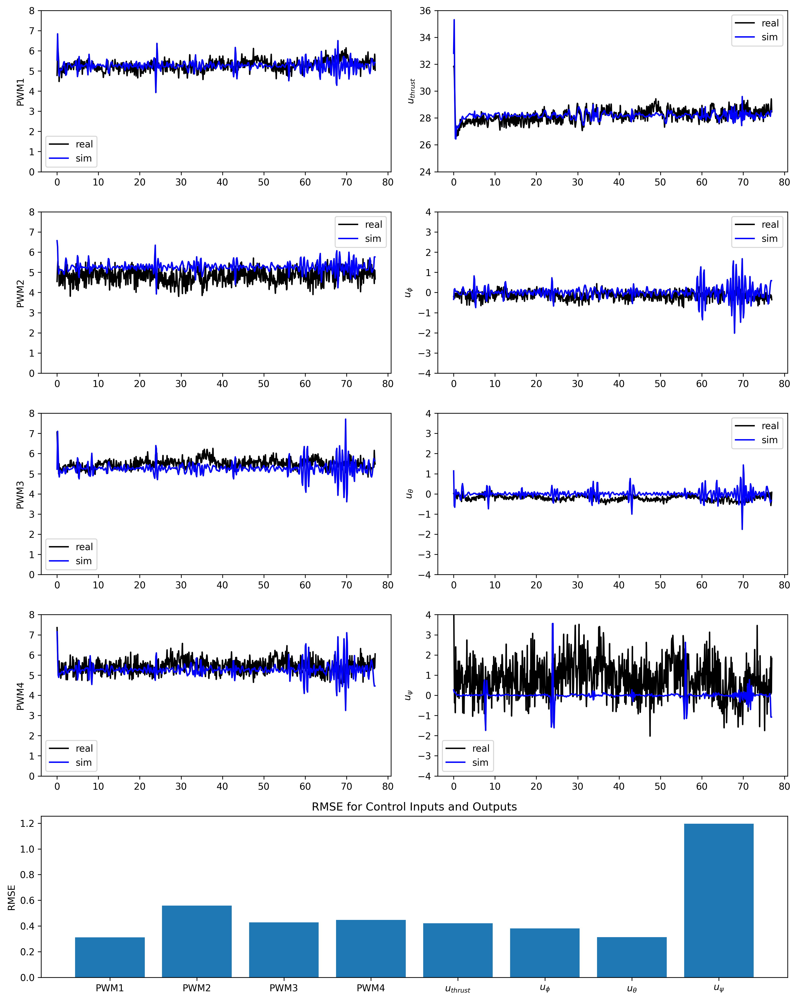

In [239]:
# Create the 5x2 grid for plotting
fig, ax = plt.subplots(5, 2, figsize=(3 * 4, 3 * 5), dpi=300)


Lx = 2 * PARAMS['L'] / np.sqrt(2)
u_thrust_sim = PARAMS['b'] * (u_sim['PWM1'] + u_sim['PWM2'] + u_sim['PWM3'] + u_sim['PWM4'])
u_phi_sim = PARAMS['b'] * Lx * (-u_sim['PWM1'] + u_sim['PWM2'] + u_sim['PWM3'] - u_sim['PWM4'])
u_theta_sim = PARAMS['b'] * Lx * (-u_sim['PWM1'] + u_sim['PWM2'] - u_sim['PWM3'] + u_sim['PWM4'])
u_psi_sim = PARAMS['d'] * (-u_sim['PWM1'] - u_sim['PWM2'] + u_sim['PWM3'] + u_sim['PWM4'])

u_thrust_real = PARAMS['b'] * (PWM_1 + PWM_2 + PWM_3 + PWM_4)
u_phi_real = PARAMS['b'] * Lx * (-PWM_1 + PWM_2 + PWM_3 - PWM_4)
u_theta_real = PARAMS['b'] * Lx * (-PWM_1 + PWM_2 - PWM_3 + PWM_4)
u_psi_real = PARAMS['d'] * (-PWM_1 - PWM_2 + PWM_3 + PWM_4)

# Plot PWM1
ax[0, 0].plot(TIME_BL, PWM_1, label='real', color='black')
ax[0, 0].plot(T_MPC, u_sim['PWM1'], label='sim', color='blue')
ax[0, 0].set_ylabel('PWM1')
ax[0, 0].set_ylim(0, 8)
ax[0, 0].legend()

# Plot PWM2
ax[1, 0].plot(TIME_BL, PWM_2, label='real', color='black')
ax[1, 0].plot(T_MPC, u_sim['PWM2'], label='sim', color='blue')
ax[1, 0].set_ylabel('PWM2')
ax[1, 0].set_ylim(0, 8)
ax[1, 0].legend()

# Plot PWM3
ax[2, 0].plot(TIME_BL, PWM_3, label='real', color='black')
ax[2, 0].plot(T_MPC, u_sim['PWM3'], label='sim', color='blue')
ax[2, 0].set_ylabel('PWM3')
ax[2, 0].set_ylim(0, 8)
ax[2, 0].legend()

# Plot PWM4
ax[3, 0].plot(TIME_BL, PWM_4, label='real', color='black')
ax[3, 0].plot(T_MPC, u_sim['PWM4'], label='sim', color='blue')
ax[3, 0].set_ylabel('PWM4')
ax[3, 0].set_ylim(0, 8)
ax[3, 0].legend()

# Plot u_thrust
ax[0, 1].plot(TIME_BL, u_thrust_real, label='real', color='black')
ax[0, 1].plot(T_MPC, u_thrust_sim, label='sim', color='blue')
ax[0, 1].set_ylabel('$u_{thrust}$')
ax[0, 1].set_ylim(24, 36)
ax[0, 1].legend()

# Plot u_phi
ax[1, 1].plot(TIME_BL, u_phi_real, label='real', color='black')
ax[1, 1].plot(T_MPC, u_phi_sim, label='sim', color='blue')
ax[1, 1].set_ylabel('$u_{\phi}$')
ax[1, 1].set_ylim(-4, 4)
ax[1, 1].legend()

# Plot u_theta
ax[2, 1].plot(TIME_BL, u_theta_real, label='real', color='black')
ax[2, 1].plot(T_MPC, u_theta_sim, label='sim', color='blue')
ax[2, 1].set_ylabel('$u_{\\theta}$')
ax[2, 1].set_ylim(-4, 4)
ax[2, 1].legend()

# Plot u_psi
ax[3, 1].plot(TIME_BL, u_psi_real, label='real', color='black')
ax[3, 1].plot(T_MPC, u_psi_sim, label='sim', color='blue')
ax[3, 1].set_ylabel('$u_{\psi}$')
ax[3, 1].set_ylim(-4, 4)
ax[3, 1].legend()

# Make the subplot [4,0] and [4,1] span both columns for RMSE
ax[4, 0].axis('off')
ax[4, 1].axis('off')
ax_rmse = fig.add_subplot(5, 1, 5)  # Add a subplot spanning the bottom row

# Calculate RMSE between real and simulated control inputs
RMSE_PWM1 = np.sqrt(np.mean((PWM_1[::nth] - u_sim['PWM1']) ** 2))
RMSE_PWM2 = np.sqrt(np.mean((PWM_2[::nth] - u_sim['PWM2']) ** 2))
RMSE_PWM3 = np.sqrt(np.mean((PWM_3[::nth] - u_sim['PWM3']) ** 2))
RMSE_PWM4 = np.sqrt(np.mean((PWM_4[::nth] - u_sim['PWM4']) ** 2))

RMSE_u_thrust = np.sqrt(np.mean((u_thrust_real[::nth] - u_thrust_sim) ** 2))
RMSE_u_phi = np.sqrt(np.mean((u_phi_real[::nth] - u_phi_sim) ** 2))
RMSE_u_theta = np.sqrt(np.mean((u_theta_real[::nth] - u_theta_sim) ** 2))
RMSE_u_psi = np.sqrt(np.mean((u_psi_real[::nth] - u_psi_sim) ** 2))

# print the sum of the RMSE values all together as one number
RMSE_sum = RMSE_PWM1 + RMSE_PWM2 + RMSE_PWM3 + RMSE_PWM4 + RMSE_u_thrust + RMSE_u_phi + RMSE_u_theta + RMSE_u_psi
print("RMSE sum", RMSE_sum)

# Combine RMSE values into an array
RMSE = np.array([RMSE_PWM1, RMSE_PWM2, RMSE_PWM3, RMSE_PWM4, RMSE_u_thrust, RMSE_u_phi, RMSE_u_theta, RMSE_u_psi])

# Plot RMSE as a bar graph
ax_rmse.bar(np.arange(len(RMSE)), RMSE)
ax_rmse.set_ylabel('RMSE')
ax_rmse.set_xticks(np.arange(len(RMSE)))
ax_rmse.set_xticklabels(['PWM1', 'PWM2', 'PWM3', 'PWM4', '$u_{thrust}$', '$u_{\phi}$', '$u_{\\theta}$', '$u_{\psi}$'])
ax_rmse.set_title('RMSE for Control Inputs and Outputs')

plt.tight_layout()
plt.show()


In [240]:
import numpy as np
from scipy.optimize import minimize
# make sure dt_MPC, X0_sim, PWM_1, PWM_2, PWM_3, PWM_4,
# X_DOT_BL_TRUE_MPC, Y_DOT_BL_TRUE_MPC, IMU_YAW_MPC, Z_TRUE_MPC, nth
# are all in scope here

# initial PARAMS (defaults)
BASE = {
    'g': 9.81,
    'm': 0.086,
    'M': 2.529,
    'Mm': 4*0.086 + 2.529,
    'L': 0.2032,
    'R': 0.1778,
    'I_x': 0.491,
    'I_y': 0.387,
    'I_z': 0.667,
    'b': 1.34,
    'd': 1.0,
    'C': 0.1
}

def objective(p):
    # unpack
    I_x, I_y, I_z= p

    # build a fresh PARAMS dict
    params = BASE.copy()
    params.update({'I_x': I_x,
                   'I_y': I_y,
                   'I_z': I_z})

    # instantiate simulator
    sim = DroneSimulator(
        dt=dt_MPC,
        mpc_horizon=50,
        r_u=1e-4,
        control_mode='velocity_body_level',
        params=params
    )

    # set the trajectory
    sim.update_setpoint(
        v_x=X_DOT_BL_TRUE_MPC,
        v_y=Y_DOT_BL_TRUE_MPC,
        psi=IMU_YAW_MPC,
        z=Z_TRUE_MPC,
        wx=np.zeros_like(Z_TRUE_MPC),
        wy=np.zeros_like(Z_TRUE_MPC)
    )

    # run the MPC rollout (downsample via nth inside RMSE)
    _, _, u_sim, _ = sim.simulate(
        x0=X0_sim,
        mpc=True,
        return_full_output=True
    )

    # recompute controls from PWM
    Lx = 2 * params['L'] / np.sqrt(2)
    u_thrust_sim = params['b'] * (u_sim['PWM1'] + u_sim['PWM2'] +
                                  u_sim['PWM3'] + u_sim['PWM4'])
    u_phi_sim    = params['b'] * Lx * (-u_sim['PWM1'] + u_sim['PWM2'] +
                                       u_sim['PWM3'] - u_sim['PWM4'])
    u_theta_sim  = params['b'] * Lx * (-u_sim['PWM1'] + u_sim['PWM2'] -
                                       u_sim['PWM3'] + u_sim['PWM4'])
    u_psi_sim    = params['d'] * (-u_sim['PWM1'] - u_sim['PWM2'] +
                                  u_sim['PWM3'] + u_sim['PWM4'])

    # the “real” controls computed from your logged PWM arrays
    u_thrust_real = params['b'] * (PWM_1 + PWM_2 + PWM_3 + PWM_4)
    u_phi_real    = params['b'] * Lx * (-PWM_1 + PWM_2 + PWM_3 - PWM_4)
    u_theta_real  = params['b'] * Lx * (-PWM_1 + PWM_2 - PWM_3 + PWM_4)
    u_psi_real    = params['d'] * (-PWM_1 - PWM_2 + PWM_3 + PWM_4)

    # helper to compute RMSE with downsampling
    def rmse(a, b):
        return np.sqrt(np.mean((a[::nth] - b)**2))

    # collect all RMSEs
    rmses = [
        rmse(PWM_1, u_sim['PWM1']),
        rmse(PWM_2, u_sim['PWM2']),
        rmse(PWM_3, u_sim['PWM3']),
        rmse(PWM_4, u_sim['PWM4']),
        # rmse(u_thrust_real, u_thrust_sim),
        # rmse(u_phi_real,    u_phi_sim),
        # rmse(u_theta_real,  u_theta_sim),
        rmse(u_psi_real,    u_psi_sim),
    ]

    # sum them (you can instead weight or pick a subset)
    return np.sum(rmses)


if __name__ == '__main__':
    # initial guess: defaults from BASE
    p0 = np.array([BASE['I_x'], BASE['I_y'], BASE['I_z']])

    # bounds to keep things physical
    bounds = [
        (0.1, 2.0),    # I_x
        (0.1, 2.0),    # I_y
        (0.1, 2.0),    # I_z
    ]

    result = minimize(
        objective,
        x0=p0,
        bounds=bounds,
        method='L-BFGS-B',
        options={'disp': True, 'maxiter': 5}
    )

    print("Success:", result.success)
    print("Estimated [I_x, I_y, I_z]:", result.x)
    print("Final cost (sum RMSE):", result.fun)


Drone parameters: {'g': 9.81, 'm': 0.086, 'M': 2.529, 'Mm': 2.8729999999999998, 'L': 0.2032, 'R': 0.1778, 'I_x': 0.491, 'I_y': 0.387, 'I_z': 0.667, 'b': 1.34, 'd': 1.0, 'C': 0.1}
Drone parameters: {'g': 9.81, 'm': 0.086, 'M': 2.529, 'Mm': 2.8729999999999998, 'L': 0.2032, 'R': 0.1778, 'I_x': 0.49100001, 'I_y': 0.387, 'I_z': 0.667, 'b': 1.34, 'd': 1.0, 'C': 0.1}
Drone parameters: {'g': 9.81, 'm': 0.086, 'M': 2.529, 'Mm': 2.8729999999999998, 'L': 0.2032, 'R': 0.1778, 'I_x': 0.491, 'I_y': 0.38700001, 'I_z': 0.667, 'b': 1.34, 'd': 1.0, 'C': 0.1}
Drone parameters: {'g': 9.81, 'm': 0.086, 'M': 2.529, 'Mm': 2.8729999999999998, 'L': 0.2032, 'R': 0.1778, 'I_x': 0.491, 'I_y': 0.387, 'I_z': 0.6670000100000001, 'b': 1.34, 'd': 1.0, 'C': 0.1}
Success: True
Estimated [I_x, I_y, I_z]: [0.491 0.387 0.667]
Final cost (sum RMSE):RUNNING THE L-BFGS-B CODE

 2.942031707311273
           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the